In [57]:
# standard imports
import warnings
import math
import cmath
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from sklearn.linear_model import LinearRegression
import os.path
import datetime
from datetime import date
import random
from nsetools import Nse

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# creating a Nse object
nse = Nse()

pd.set_option('display.max_rows', None)

# Find the most recent working day, to avoid trying to download all stocks data from weekends
end_dt = dt.datetime.today()
day_of_the_week = end_dt.weekday() # starts from 0 for Monday end ends on 6 for Sunday
if ( day_of_the_week == 5): # Saturday & Sunday
    end_dt = end_dt - dt.timedelta(days=1)
elif ( day_of_the_week == 6): # Saturday & Sunday
    end_dt = end_dt - dt.timedelta(days=2)

DD = dt.timedelta(days=365*20)
start_dt = end_dt - DD
end = end_dt.strftime("%Y-%m-%d")
start = start_dt.strftime("%Y-%m-%d")
print("Date as string - start:{} end:{}".format(start, end))
annual_risk_free_interest_rate = (5.1/100)
# compound interest rate is translated into a monthly rate with this formula: i_monthly = (1 + i_annual) ^ (1/12) – 1
monthly_risk_free_interest_rate = (1 + annual_risk_free_interest_rate / 100 )**(1/12) - 1
equity_risk_premium = (8.0/100) # India Equity Risk Premium (2021) study: https://incwert.com/india-equity-risk-premium-2021/
#tickers=['^NSEI', 'ACC.NS','TCS.NS', 'INFY.NS', 'WIPRO.NS']
t=['^NSEI', 'ACC.NS', 'AJANTSOY.BO', 'AMARAJABAT.NS', 'AROGRANITE.NS', 'ASHOKLEY.NS', 'ATULAUTO.NS', 'BAJAJST.BO', 'BHARTIARTL.NS', 'CANBK.NS', 'CYIENT.NS', 'DABUR.NS', 'DCW.NS', 'DECCANCE.NS', 'DEEPAKNTR.NS', 'DELTACORP.NS', 'DIXON.NS', 'DWARKESH.NS', 'EIDPARRY.NS', 'FSL.NS', 'GPIL.NS', 'HAL.NS', 'HAPPSTMNDS.NS', 'HEMIPROP.NS', 'HGS.NS', 'HINDALCO.NS', 'IGPL.NS', 'INDHOTEL.NS', 'INDIACEM.NS', 'INDNIPPON.NS', 'INTENTECH.NS', 'INTLCONV.NS', 'ITC.NS', 'JENBURPH.BO', 'JKTYRE.NS', 'JSLHISAR.NS', 'LGBBROSLTD.NS', 'LINCOLN.NS', 'LT.NS', 'MANALIPETC.NS', 'MCX.NS', 'MIDHANI.NS', 'MINDTREE.NS', 'MPHASIS.NS', 'NMDC.NS', 'NTPC.NS', 'OPTOCIRCUI.NS', 'PNB.NS', 'POWERGRID.NS', 'RELIANCE.NS', 'RPOWER.NS', 'SUZLON.NS', 'TATACHEM.NS', 'TATAMTRDVR.NS', 'TATAPOWER.NS', 'TATASTEEL.NS', 'TATASTLLP.NS', 'TCS.NS', 'TINPLATE.NS', 'TITAN.NS', 'ULTRACEMCO.NS', 'WOCKPHARMA.NS', 'ZEEL.NS']
j=['^NSEI', 'ACC.NS', 'ANSALHSG.NS', 'DABUR.NS', 'DLF.NS', 'GICHSGFIN.NS', 'GMRINFRA.NS', 'IDBI.NS', 'JPASSOCIAT.NS', 'LT.NS', 'Parsvnath.NS', 'PURVA.NS', 'RELCAPITAL.NS', 'Reliance.NS', 'Suzlon.NS', 'TTML.NS', 'UNITECH.NS']
nifty500=['^NSEI', '3MINDIA.NS', 'ABB.NS', 'ACC.NS', 'AIAENG.NS', 'APLAPOLLO.NS', 'AUBANK.NS', 'POWERINDIA.NS', 'AARTIDRUGS.NS', 'AARTIIND.NS', 'AAVAS.NS', 'ABB.NS', 'ABBOTINDIA.NS', 'ABCAPITAL.NS', 'ABFRL.NS', 'ACC.NS', 'ADANIENT.NS', 'ADANIGREEN.NS', 'ADANIPORTS.NS', 'ADANITRANS.NS', 'ADVENZYMES.NS', 'AEGISCHEM.NS', 'AFFLE.NS', 'AIAENG.NS', 'AJANTPHARM.NS', 'ALEMBICLTD.NS', 'ALKEM.NS', 'ALKYLAMINE.NS', 'ALOKINDS.NS', 'AMARAJABAT.NS', 'AMBER.NS', 'AMBUJACEM.NS', 'ANGELBRKG.NS', 'ANURAS.NS', 'APLAPOLLO.NS', 'APLLTD.NS', 'APOLLOHOSP.NS', 'APOLLOTYRE.NS', 'ASAHIINDIA.NS', 'ASHOKA.NS', 'ASHOKLEY.NS', 'ASIANPAINT.NS', 'ASTERDM.NS', 'ASTRAL.NS', 'ASTRAZEN.NS', 'ATGL.NS', 'ATUL.NS', 'AUBANK.NS', 'AUROPHARMA.NS', 'AVANTIFEED.NS', 'AXISBANK.NS', 'BAJAJ-AUTO.NS', 'BAJAJCON.NS', 'BAJAJELEC.NS', 'BAJAJFINSV.NS', 'BAJAJHLDNG.NS', 'BAJFINANCE.NS', 'BALAMINES.NS', 'BALKRISIND.NS', 'BALRAMCHIN.NS', 'BANDHANBNK.NS', 'BANKBARODA.NS', 'BANKINDIA.NS', 'BASF.NS', 'BATAINDIA.NS', 'BAYERCROP.NS', 'BBTC.NS', 'BDL.NS', 'BEL.NS', 'BEML.NS', 'BERGEPAINT.NS', 'BHARATFORG.NS', 'BHARATRAS.NS', 'BHARTIARTL.NS', 'BHEL.NS', 'BIOCON.NS', 'BIRLACORPN.NS', 'BLUEDART.NS', 'BLUESTARCO.NS', 'BOSCHLTD.NS', 'BPCL.NS', 'BRIGADE.NS', 'BRITANNIA.NS', 'BSE.NS', 'BSOFT.NS', 'BURGERKING.NS', 'CADILAHC.NS', 'CAMS.NS', 'CANBK.NS', 'CANFINHOME.NS', 'CAPLIPOINT.NS', 'CARBORUNIV.NS', 'CASTROLIND.NS', 'CCL.NS', 'CDSL.NS', 'CEATLTD.NS', 'CENTRALBK.NS', 'CENTURYPLY.NS', 'CENTURYTEX.NS', 'CERA.NS', 'CESC.NS', 'CGCL.NS', 'CGPOWER.NS', 'CHALET.NS', 'CHAMBLFERT.NS', 'CHOLAFIN.NS', 'CHOLAHLDNG.NS', 'CIPLA.NS', 'COALINDIA.NS', 'COCHINSHIP.NS', 'COFORGE.NS', 'COLPAL.NS', 'CONCOR.NS', 'COROMANDEL.NS', 'CREDITACC.NS', 'CRISIL.NS', 'CROMPTON.NS', 'CSBBANK.NS', 'CUB.NS', 'CUMMINSIND.NS', 'CYIENT.NS', 'DABUR.NS', 'DALBHARAT.NS', 'DBL.NS', 'DCBBANK.NS', 'DCMSHRIRAM.NS', 'DEEPAKNTR.NS', 'DELTACORP.NS', 'DHANI.NS', 'DHANUKA.NS', 'DIVISLAB.NS', 'DIXON.NS', 'DLF.NS', 'DMART.NS', 'DRREDDY.NS', 'ECLERX.NS', 'EDELWEISS.NS', 'EICHERMOT.NS', 'EIDPARRY.NS', 'EIHOTEL.NS', 'ELGIEQUIP.NS', 'EMAMILTD.NS', 'ENDURANCE.NS', 'ENGINERSIN.NS', 'EPL.NS', 'EQUITAS.NS', 'EQUITASBNK.NS', 'ERIS.NS', 'ESCORTS.NS', 'EXIDEIND.NS', 'FACT.NS', 'FDC.NS', 'FEDERALBNK.NS', 'FINCABLES.NS', 'FINEORG.NS', 'FINPIPE.NS', 'FLUOROCHEM.NS', 'FORTIS.NS', 'FRETAIL.NS', 'FSL.NS', 'GAEL.NS', 'GAIL.NS', 'GALAXYSURF.NS', 'GARFIBRES.NS', 'GESHIP.NS', 'GICRE.NS', 'GILLETTE.NS', 'GLAND.NS', 'GLAXO.NS', 'GLENMARK.NS', 'GMMPFAUDLR.NS', 'GNFC.NS', 'GODFRYPHLP.NS', 'GODREJAGRO.NS', 'GODREJCP.NS', 'GODREJIND.NS', 'GODREJPROP.NS', 'GPPL.NS', 'GRANULES.NS', 'GRAPHITE.NS', 'GRASIM.NS', 'GREAVESCOT.NS', 'GRINDWELL.NS', 'GSFC.NS', 'GSPL.NS', 'GUJALKALI.NS', 'GUJGASLTD.NS', 'HAL.NS', 'HAPPSTMNDS.NS', 'HATHWAY.NS', 'HATSUN.NS', 'HAVELLS.NS', 'HCLTECH.NS', 'HDFC.NS', 'HDFCAMC.NS', 'HDFCBANK.NS', 'HDFCLIFE.NS', 'HEG.NS', 'HEIDELBERG.NS', 'HEMIPROP.NS', 'HEROMOTOCO.NS', 'HFCL.NS', 'HGS.NS', 'HIKAL.NS', 'HINDALCO.NS', 'HINDCOPPER.NS', 'HINDPETRO.NS', 'HINDUNILVR.NS', 'HINDZINC.NS', 'HOMEFIRST.NS', 'HONAUT.NS', 'HUDCO.NS', 'IBREALEST.NS', 'IBULHSGFIN.NS', 'ICICIBANK.NS', 'ICICIGI.NS', 'ICICIPRULI.NS', 'ICIL.NS', 'IDBI.NS', 'IDEA.NS', 'IDFC.NS', 'IDFCFIRSTB.NS', 'IEX.NS', 'IFBIND.NS', 'IGL.NS', 'IIFL.NS', 'IIFLWAM.NS', 'INDHOTEL.NS', 'INDIACEM.NS', 'INDIAMART.NS', 'INDIANB.NS', 'INDIGO.NS', 'INDIGOPNTS.NS', 'INDOCO.NS', 'INDUSINDBK.NS', 'INDUSTOWER.NS', 'INFIBEAM.NS', 'INFY.NS', 'INGERRAND.NS', 'INOXLEISUR.NS', 'INTELLECT.NS', 'IOB.NS', 'IOC.NS', 'IOLCP.NS', 'IPCALAB.NS', 'IRB.NS', 'IRCON.NS', 'IRCTC.NS', 'IRFC.NS', 'ISEC.NS', 'ITC.NS', 'ITI.NS', 'JAMNAAUTO.NS', 'JBCHEPHARM.NS', 'JCHAC.NS', 'JINDALSAW.NS', 'JINDALSTEL.NS', 'JKCEMENT.NS', 'JKLAKSHMI.NS', 'JKPAPER.NS', 'JKTYRE.NS', 'JMFINANCIL.NS', 'JSL.NS', 'JSLHISAR.NS', 'JSWENERGY.NS', 'JSWSTEEL.NS', 'JUBLFOOD.NS', 'JUBLINGREA.NS', 'JUBLPHARMA.NS', 'JUSTDIAL.NS', 'JYOTHYLAB.NS', 'KAJARIACER.NS', 'KALPATPOWR.NS', 'KALYANKJIL.NS', 'KANSAINER.NS', 'KARURVYSYA.NS', 'KEC.NS', 'KEI.NS', 'KNRCON.NS', 'KOTAKBANK.NS', 'KPITTECH.NS', 'KPRMILL.NS', 'KRBL.NS', 'KSB.NS', 'KSCL.NS', 'L&TFH.NS', 'LALPATHLAB.NS', 'LAOPALA.NS', 'LAURUSLABS.NS', 'LAXMIMACH.NS', 'LEMONTREE.NS', 'LICHSGFIN.NS', 'LINDEINDIA.NS', 'LODHA.NS', 'LT.NS', 'LTI.NS', 'LTTS.NS', 'LUPIN.NS', 'LUXIND.NS', 'LXCHEM.NS', 'M&M.NS', 'M&MFIN.NS', 'MAHABANK.NS', 'MAHINDCIE.NS', 'MAHLOG.NS', 'MANAPPURAM.NS', 'MARICO.NS', 'MARUTI.NS', 'MASTEK.NS', 'MAXHEALTH.NS', 'MAZDOCK.NS', 'MCDOWELL-N.NS', 'MCX.NS', 'METROPOLIS.NS', 'MFSL.NS', 'MGL.NS', 'MHRIL.NS', 'MIDHANI.NS', 'MINDACORP.NS', 'MINDAIND.NS', 'MINDTREE.NS', 'MMTC.NS', 'MOIL.NS', 'MOTILALOFS.NS', 'MPHASIS.NS', 'MRF.NS', 'MRPL.NS', 'MUTHOOTFIN.NS', 'NAM-INDIA.NS', 'NATCOPHARM.NS', 'NATIONALUM.NS', 'NAUKRI.NS', 'NAVINFLUOR.NS', 'NAZARA.NS', 'NBCC.NS', 'NCC.NS', 'NESCO.NS', 'NESTLEIND.NS', 'NETWORK18.NS', 'NFL.NS', 'NH.NS', 'NHPC.NS', 'NIACL.NS', 'NILKAMAL.NS', 'NLCINDIA.NS', 'NMDC.NS', 'NOCIL.NS', 'NTPC.NS', 'OBEROIRLTY.NS', 'OFSS.NS', 'OIL.NS', 'ONGC.NS', 'ORIENTELEC.NS', 'PAGEIND.NS', 'PEL.NS', 'PERSISTENT.NS', 'PETRONET.NS', 'PFC.NS', 'PFIZER.NS', 'PGHH.NS', 'PGHL.NS', 'PHILIPCARB.NS', 'PHOENIXLTD.NS', 'PIDILITIND.NS', 'PIIND.NS', 'PNB.NS', 'PNBHOUSING.NS', 'PNCINFRA.NS', 'POLYCAB.NS', 'POLYMED.NS', 'POLYPLEX.NS', 'POONAWALLA.NS', 'POWERGRID.NS', 'POWERINDIA.NS', 'PRAJIND.NS', 'PRESTIGE.NS', 'PRINCEPIPE.NS', 'PRSMJOHNSN.NS', 'PVR.NS', 'QUESS.NS', 'RADICO.NS', 'RAILTEL.NS', 'RAIN.NS', 'RAJESHEXPO.NS', 'RALLIS.NS', 'RAMCOCEM.NS', 'RATNAMANI.NS', 'RBLBANK.NS', 'RCF.NS', 'RECLTD.NS', 'REDINGTON.NS', 'RELAXO.NS', 'RELIANCE.NS', 'RHIM.NS', 'RITES.NS', 'ROSSARI.NS', 'ROUTE.NS', 'RVNL.NS', 'SAIL.NS', 'SANOFI.NS', 'SBICARD.NS', 'SBILIFE.NS', 'SBIN.NS', 'SCHAEFFLER.NS', 'SCHNEIDER.NS', 'SCI.NS', 'SEQUENT.NS', 'SFL.NS', 'SHARDACROP.NS', 'SHILPAMED.NS', 'SHREECEM.NS', 'SHRIRAMCIT.NS', 'SIEMENS.NS', 'SIS.NS', 'SJVN.NS', 'SKFINDIA.NS', 'SOBHA.NS', 'SOLARA.NS', 'SOLARINDS.NS', 'SONACOMS.NS', 'SONATSOFTW.NS', 'SPANDANA.NS', 'SPARC.NS', 'SPICEJET.NS', 'SRF.NS', 'SRTRANSFIN.NS', 'STAR.NS', 'STARCEMENT.NS', 'STLTECH.NS', 'SUDARSCHEM.NS', 'SUMICHEM.NS', 'SUNDARMFIN.NS', 'SUNDRMFAST.NS', 'SUNPHARMA.NS', 'SUNTECK.NS', 'SUNTV.NS', 'SUPPETRO.NS', 'SUPRAJIT.NS', 'SUPREMEIND.NS', 'SUVENPHAR.NS', 'SUZLON.NS', 'SWSOLAR.NS', 'SYMPHONY.NS', 'SYNGENE.NS', 'TANLA.NS', 'TASTYBITE.NS', 'TATACHEM.NS', 'TATACOFFEE.NS', 'TATACOMM.NS', 'TATACONSUM.NS', 'TATAELXSI.NS', 'TATAMOTORS.NS', 'TATAMTRDVR.NS', 'TATAPOWER.NS', 'TATASTEEL.NS', 'TATASTLLP.NS', 'TCIEXP.NS', 'TCNSBRANDS.NS', 'TCS.NS', 'TEAMLEASE.NS', 'TECHM.NS', 'THERMAX.NS', 'THYROCARE.NS', 'TIINDIA.NS', 'TIMKEN.NS', 'TITAN.NS', 'TORNTPHARM.NS', 'TORNTPOWER.NS', 'TRENT.NS', 'TRIDENT.NS', 'TRITURBINE.NS', 'TTKPRESTIG.NS', 'TTML.NS', 'TV18BRDCST.NS', 'TVSMOTOR.NS', 'UBL.NS', 'UCOBANK.NS', 'UFLEX.NS', 'UJJIVAN.NS', 'UJJIVANSFB.NS', 'ULTRACEMCO.NS', 'UNIONBANK.NS', 'UPL.NS', 'UTIAMC.NS', 'VAIBHAVGBL.NS', 'VAKRANGEE.NS', 'VALIANTORG.NS', 'VARROC.NS', 'VBL.NS', 'VEDL.NS', 'VENKEYS.NS', 'VGUARD.NS', 'VINATIORGA.NS', 'VIPIND.NS', 'VMART.NS', 'VOLTAS.NS', 'VTL.NS', 'WABCOINDIA.NS', 'WELCORP.NS', 'WELSPUNIND.NS', 'WESTLIFE.NS', 'WHIRLPOOL.NS', 'WIPRO.NS', 'WOCKPHARMA.NS', 'YESBANK.NS', 'ZEEL.NS', 'ZENSARTECH.NS', 'ZYDUSWELL.NS']
# all_stocks_nifty1 = ['^NSEI', 'RELIANCE.NS', 'TCS.NS', 'HDFCBANK.NS', 'INFY.NS', 'HINDUNILVR.NS', 'HDFC.NS', 'ICICIBANK.NS', 'KOTAKBANK.NS', 'SBIN.NS', 'BAJFINANCE.NS', 'BHARTIARTL.NS', 'ITC.NS', 'HCLTECH.NS', 'ASIANPAINT.NS', 'WIPRO.NS', 'AXISBANK.NS', 'MARUTI.NS', 'LT.NS', 'ULTRACEMCO.NS', 'DMART.NS', 'ADANIGREEN.NS', 'BAJAJFINSV.NS', 'SUNPHARMA.NS', 'ADANIPORTS.NS', 'HDFCLIFE.NS', 'TITAN.NS', 'ONGC.NS', 'HINDZINC.NS', 'ADANIENT.NS', 'JSWSTEEL.NS', 'POWERGRID.NS', 'SHREECEM.NS', 'BAJAJ-AUTO.NS', 'ATGL.NS', 'NTPC.NS', 'TATAMOTORS.NS', 'ADANITRANS.NS', 'M&M.NS', 'DIVISLAB.NS', 'TECHM.NS', 'DABUR.NS', 'GRASIM.NS', 'BPCL.NS', 'PIDILITIND.NS', 'TATASTEEL.NS', 'SBILIFE.NS', 'BRITANNIA.NS', 'SBICARD.NS', 'IOC.NS', 'VEDL.NS', 'COALINDIA.NS', 'DRREDDY.NS', 'GODREJCP.NS', 'BERGEPAINT.NS', 'INDUSINDBK.NS', 'HINDALCO.NS', 'EICHERMOT.NS', 'DLF.NS', 'LTI.NS', 'INDUSTOWER.NS', 'HAVELLS.NS', 'CIPLA.NS', 'SIEMENS.NS', 'ICICIGI.NS', 'ICICIPRULI.NS', 'MOTHERSUMI.NS', 'INDIGO.NS', 'HDFCAMC.NS', 'AMBUJACEM.NS', 'GAIL.NS', 'TATACONSUM.NS', 'HEROMOTOCO.NS', 'NAUKRI.NS', 'BANDHANBNK.NS', 'MARICO.NS', 'AUROPHARMA.NS', 'BIOCON.NS', 'UPL.NS', 'MUTHOOTFIN.NS', 'LUPIN.NS', 'CHOLAFIN.NS', 'CADILAHC.NS', 'TORNTPHARM.NS', 'COLPAL.NS', 'HONAUT.NS', 'APOLLOHOSP.NS', 'BOSCHLTD.NS', 'IDBI.NS', 'PGHH.NS', 'GLAND.NS', 'MCDOWELL-N.NS', 'NMDC.NS', 'PEL.NS', 'GODREJPROP.NS', 'YESBANK.NS', 'JUBLFOOD.NS', 'PNB.NS', 'AUBANK.NS', 'BANKBARODA.NS', 'GUJGASLTD.NS', 'BAJAJHLDNG.NS', 'CONCOR.NS', 'SRTRANSFIN.NS', 'IGL.NS', 'ACC.NS', 'JINDALSTEL.NS', 'GICRE.NS', 'MRF.NS', 'HINDPETRO.NS', 'MINDTREE.NS', '3MINDIA.NS', 'PIIND.NS', 'PAGEIND.NS', 'PETRONET.NS', 'ASHOKLEY.NS', 'HAL.NS', 'MPHASIS.NS', 'VOLTAS.NS', 'ALKEM.NS', 'TATAPOWER.NS', 'UBL.NS', 'ADANIPOWER.NS', 'BALKRISIND.NS', 'SAIL.NS', 'ASTRAL.NS', 'KANSAINER.NS', 'SRF.NS', 'IDFCFIRSTB.NS', 'BEL.NS', 'TATACOMM.NS', 'PFC.NS', 'IRFC.NS', 'ABB.NS', 'DALBHARAT.NS', 'MFSL.NS', 'VBL.NS', 'ABCAPITAL.NS', 'SUNDARMFIN.NS', 'WHIRLPOOL.NS', 'IRCTC.NS', 'LTTS.NS', 'TVSMOTOR.NS', 'BHARATFORG.NS', 'OFSS.NS', 'TRENT.NS', 'IDEA.NS', 'IOB.NS', 'SUPREMEIND.NS', 'RECLTD.NS', 'CUMMINSIND.NS', 'NIACL.NS', 'CANBK.NS', 'CROMPTON.NS', 'M&MFIN.NS', 'NHPC.NS', 'GLAXO.NS', 'IPCALAB.NS', 'L&TFH.NS', 'RAMCOCEM.NS', 'INDIAMART.NS', 'TIINDIA.NS', 'AARTIIND.NS', 'COROMANDEL.NS', 'DEEPAKNTR.NS', 'LALPATHLAB.NS', 'JKCEMENT.NS', 'BANKINDIA.NS', 'UNIONBANK.NS', 'RELAXO.NS', 'SYNGENE.NS', 'LICHSGFIN.NS', 'EMAMILTD.NS', 'DIXON.NS', 'ATUL.NS', 'OBEROIRLTY.NS', 'NAM-INDIA.NS', 'PFIZER.NS', 'POLYCAB.NS', 'ENDURANCE.NS', 'TORNTPOWER.NS', 'MAXHEALTH.NS', 'ZEEL.NS', 'LAURUSLABS.NS', 'AIAENG.NS', 'GILLETTE.NS', 'TATACHEM.NS', 'AAVAS.NS', 'RUCHI.NS', 'APLLTD.NS', 'SUNTV.NS', 'GODREJIND.NS', 'SANOFI.NS', 'BATAINDIA.NS', 'COFORGE.NS', 'APLAPOLLO.NS', 'ESCORTS.NS', 'ABFRL.NS', 'SCHAEFFLER.NS', 'BHEL.NS', 'SUNDRMFAST.NS', 'TATAELXSI.NS', 'THERMAX.NS', 'HATSUN.NS', 'EXIDEIND.NS', 'AJANTPHARM.NS', 'GSPL.NS', 'LINDEINDIA.NS', 'FEDERALBNK.NS', 'NATCOPHARM.NS', 'FORTIS.NS', 'KAJARIACER.NS', 'MINDAIND.NS', 'PERSISTENT.NS', 'GMRINFRA.NS', 'AMARAJABAT.NS', 'SUMICHEM.NS', 'JSWENERGY.NS', 'VINATIORGA.NS', 'APOLLOTYRE.NS', 'RAJESHEXPO.NS', 'AFFLE.NS', 'MAHABANK.NS', 'NAVINFLUOR.NS', 'PHOENIXLTD.NS', 'CRISIL.NS', 'OIL.NS', 'BLUEDART.NS', 'INDHOTEL.NS', 'GLENMARK.NS', 'INDIANB.NS', 'SUVENPHAR.NS', 'MANAPPURAM.NS', 'ZYDUSWELL.NS', 'VAIBHAVGBL.NS', 'WABCOINDIA.NS', 'RBLBANK.NS', 'CASTROLIND.NS', 'ISEC.NS', 'PRESTIGE.NS', 'ALKYLAMINE.NS', 'SOLARINDS.NS', 'MGL.NS', 'CUB.NS', 'METROPOLIS.NS', 'INDIGOPNTS.NS', 'CHOLAHLDNG.NS', 'BAJAJELEC.NS', 'AMBER.NS', 'SKFINDIA.NS', 'TANLA.NS', 'HINDCOPPER.NS', 'UCOBANK.NS', 'IIFLWAM.NS', 'JUBLPHARMA.NS', 'VGUARD.NS', 'ITI.NS', 'IIFL.NS', 'KEC.NS', 'GRINDWELL.NS', 'AEGISCHEM.NS', 'AKZOINDIA.NS', 'CREDITACC.NS', 'QUESS.NS', 'PGHL.NS', 'SJVN.NS', 'NATIONALUM.NS', 'GODREJAGRO.NS', 'TTKPRESTIG.NS', 'ALOKINDS.NS', 'GRAPHITE.NS', 'IEX.NS', 'INTELLECT.NS', 'ORCHPHARMA.NS', 'TIMKEN.NS', 'JBCHEPHARM.NS', 'CARBORUNIV.NS', 'SFL.NS', 'CENTRALBK.NS', 'CHAMBLFERT.NS', 'MOTILALOFS.NS', 'IBULHSGFIN.NS', 'GALAXYSURF.NS', 'SHRIRAMCIT.NS', 'BLUESTARCO.NS', 'BASF.NS', 'CGPOWER.NS', 'RATNAMANI.NS', 'DHANI.NS', 'SYMPHONY.NS', 'HUDCO.NS', 'KIOCL.NS', 'NBCC.NS', 'NH.NS', 'ERIS.NS', 'CANFINHOME.NS', 'ROUTE.NS', 'WELSPUNIND.NS', 'JMFINANCIL.NS', 'DBL.NS', 'HAPPSTMNDS.NS', 'FSL.NS', 'FINPIPE.NS', 'POLYMED.NS', 'CESC.NS', 'DCMSHRIRAM.NS', 'BBTC.NS', 'STLTECH.NS', 'STAR.NS', 'IDFC.NS', 'ASAHIINDIA.NS', 'ASTRAZEN.NS', 'GRANULES.NS', 'RADICO.NS', 'VTL.NS', 'EPL.NS', 'PVR.NS', 'REDINGTON.NS', 'UTIAMC.NS', 'KPRMILL.NS', 'BIRLACORPN.NS', 'LAXMIMACH.NS', 'JCHAC.NS', 'TRIDENT.NS', 'CYIENT.NS', 'CENTURYPLY.NS', 'BSOFT.NS', 'KALYANKJIL.NS', 'FINEORG.NS', 'NLCINDIA.NS', 'ASTERDM.NS', 'EQUITASBNK.NS', 'CDSL.NS', 'MRPL.NS', 'CGCL.NS', 'PNCINFRA.NS', 'ORIENTELEC.NS', 'PRSMJOHNSN.NS', 'AARTIDRUGS.NS', 'TEAMLEASE.NS', 'MMTC.NS', 'FLUOROCHEM.NS', 'INFIBEAM.NS', 'PNBHOUSING.NS', 'CEATLTD.NS', 'GMMPFAUDLR.NS', 'SUNCLAYLTD.NS', 'ZENSARTECH.NS', 'MAHINDCIE.NS', 'BDL.NS', 'RVNL.NS', 'ELGIEQUIP.NS', 'KNRCON.NS', 'SEQUENT.NS', 'VAKRANGEE.NS', 'EDELWEISS.NS', 'BRIGADE.NS', 'FINCABLES.NS', 'EIHOTEL.NS', 'POWERINDIA.NS', 'RITES.NS', 'SIS.NS', 'TATASTLBSL.NS', 'BALAMINES.NS', 'HEG.NS', 'AVANTIFEED.NS', 'EIDPARRY.NS', 'KALPATPOWR.NS', 'VMART.NS', 'ROSSARI.NS', 'SONATSOFTW.NS', 'JUSTDIAL.NS', 'HEIDELBERG.NS', 'GARFIBRES.NS', 'UJJIVANSFB.NS', 'TATAINVEST.NS', 'VSTIND.NS', 'BEML.NS', 'CENTURYTEX.NS', 'INDIACEM.NS', 'SCI.NS', 'JKLAKSHMI.NS', 'CERA.NS', 'JYOTHYLAB.NS', 'VIPIND.NS', 'SOLARA.NS', 'TV18BRDCST.NS', 'COCHINSHIP.NS', 'BURGERKING.NS', 'VARROC.NS', 'RALLIS.NS', 'ANURAS.NS', 'KPITTECH.NS', 'FDC.NS', 'NCC.NS', 'RAIN.NS', 'THYROCARE.NS', 'GODFRYPHLP.NS', 'KEI.NS', 'GPPL.NS', 'GNFC.NS', 'MASFIN.NS', 'LXCHEM.NS', 'GESHIP.NS', 'PRINCEPIPE.NS', 'WOCKPHARMA.NS', 'HATHWAY.NS', 'BALRAMCHIN.NS', 'IFBIND.NS', 'NAZARA.NS', 'RESPONIND.NS', 'KARURVYSYA.NS', 'LUXIND.NS', 'ENGINERSIN.NS', 'DELTACORP.NS', 'MAZDOCK.NS', 'RCF.NS', 'JSWHL.NS', 'SUZLON.NS', 'KRBL.NS', 'MAHLOG.NS', 'IRCON.NS', 'SWSOLAR.NS', 'SOBHA.NS', 'JUBLINGREA.NS', 'SUNTECK.NS', 'MAHSCOOTER.NS', 'RAILTEL.NS', 'CSBBANK.NS', 'BHARATRAS.NS', 'STARCEMENT.NS', 'SUPPETRO.NS', 'HOMEFIRST.NS', 'HEMIPROP.NS', 'SPANDANA.NS', 'AGCNET.NS', 'INDOSTAR.NS', 'ADVENZYMES.NS', 'SUPRAJIT.NS', 'ECLERX.NS', 'BAJAJCON.NS', 'IRB.NS', 'NETWORK18.NS', 'FACT.NS', 'SPARC.NS', 'NESCO.NS', 'IBREALEST.NS', 'TASTYBITE.NS', 'TCIEXP.NS', 'GULFOILLUB.NS', 'WELCORP.NS', 'HGS.NS', 'SUDARSCHEM.NS', 'MOIL.NS', 'PRAJIND.NS', 'TATASTLLP.NS', 'TECHNOE.NS', 'PAISALO.NS', 'PRIVISCL.NS', 'MIDHANI.NS', 'SWANENERGY.NS', 'ITDC.NS', 'JSL.NS', 'TRITURBINE.NS', 'PHILIPCARB.NS', 'JINDALPOLY.NS', 'GSFC.NS', 'KSCL.NS', 'IOLCP.NS', 'HFCL.NS', 'DHANUKA.NS', 'INOXLEISUR.NS', 'BORORENEW.NS', 'DCBBANK.NS', 'ICRA.NS', 'MTARTECH.NS', 'KSB.NS', 'TCNSBRANDS.NS', 'CCL.NS', 'MASTEK.NS', 'CAPLIPOINT.NS', 'ALLCARGO.NS', 'CHALET.NS', 'CRAFTSMAN.NS', 'EQUITAS.NS', 'GET&D.NS', 'MAGMA.NS', 'MEGH.NS', 'GREAVESCOT.NS', 'JSLHISAR.NS', 'GAEL.NS', 'LEMONTREE.NS', 'MAHLIFE.NS', 'NILKAMAL.NS', 'SURYODAY.NS', 'NOCIL.NS', 'ASHOKA.NS', 'MHRIL.NS', 'SAREGAMA.NS', 'TTML.NS', 'ESABINDIA.NS', 'UFLEX.NS', 'SHILPAMED.NS', 'ORIENTREF.NS', 'POLYPLEX.NS', 'JAMNAAUTO.NS', 'JKTYRE.NS', 'NEULANDLAB.NS', 'NFL.NS', 'INDOCO.NS', 'ALEMBICLTD.NS', 'ICIL.NS', 'SHARDACROP.NS', 'TATAMETALI.NS', 'BSE.NS', 'UJJIVAN.NS', 'JKPAPER.NS', 'GPIL.NS', 'GUJALKALI.NS', 'HERANBA.NS', 'LAOPALA.NS', 'RUPA.NS', 'RAYMOND.NS', 'MINDACORP.NS', 'HCG.NS', 'ANGELBRKG.NS', 'JINDALSAW.NS', 'KIRLOSENG.NS', 'SHOPERSTOP.NS', 'DEN.NS', 'DEEPAKFERT.NS', 'BEPL.NS', 'FRETAIL.NS', 'PTC.NS', 'HIL.NS', 'IFCI.NS', 'RELIGARE.NS', 'GREENLAM.NS', 'SCHNEIDER.NS', 'EASEMYTRIP.NS', 'TATACOFFEE.NS', 'JPPOWER.NS', 'RAMCOIND.NS', 'GDL.NS', 'BALMLAWRIE.NS', 'MATRIMONY.NS', 'VENKEYS.NS', 'UNICHEMLAB.NS', 'GHCL.NS', 'INGERRAND.NS', 'SUVIDHAA.NS', 'GRSE.NS', 'HUHTAMAKI.NS', 'REPCOHOME.NS', 'MSTCLTD.NS', 'VRLLOG.NS', 'GREENPLY.NS', 'JTEKTINDIA.NS', 'MARKSANS.NS', 'TRIVENI.NS', 'ATFL.NS', 'SUBROS.NS', 'NEOGEN.NS', 'AHLUCONT.NS', 'ORIENTCEM.NS', 'SUBEXLTD.NS', 'JBMA.NS', 'BANARISUG.NS', 'NEWGEN.NS', 'BECTORFOOD.NS', 'TCI.NS', 'OAL.NS', 'ASTEC.NS', 'GREENPANEL.NS', 'SHIL.NS', 'NIITLTD.NS', 'EVEREADY.NS', 'VESUVIUS.NS', 'RENUKA.NS', 'HGINFRA.NS', 'GEPIL.NS', 'BOROLTD.NS', 'KIRLOSBROS.NS', 'KTKBANK.NS', 'SURYAROSNI.NS', 'DAAWAT.NS', 'MAYURUNIQ.NS', 'THOMASCOOK.NS', 'MAHSEAMLES.NS', 'NAVNETEDUL.NS', 'DFMFOODS.NS', 'J&KBANK.NS', 'APARINDS.NS', 'SOMANYCERA.NS', 'CAMLINFINE.NS', 'ADFFOODS.NS', 'OLECTRA.NS', 'SHRIPISTON.NS', 'HIKAL.NS', 'GMDCLTD.NS', 'ACE.NS', 'PILANIINVS.NS', 'HSCL.NS', 'PDSMFL.NS', 'KOLTEPATIL.NS', 'PFOCUS.NS', 'DCAL.NS', 'ARVIND.NS', 'DISHTV.NS', 'JPASSOCIAT.NS', 'TINPLATE.NS', 'SAGCEM.NS', 'RKFORGE.NS', 'PSPPROJECT.NS', 'PURVA.NS', 'AMRUTANJAN.NS', 'JAGRAN.NS', 'INEOSSTYRO.NS', 'HESTERBIO.NS', 'RAMCOSYS.NS', 'WELENT.NS', 'ANANTRAJ.NS', 'AUTOAXLES.NS', 'WSTCSTPAPR.NS', 'SWARAJENG.NS', 'TVTODAY.NS', 'SHK.NS', 'DBCORP.NS', 'MAITHANALL.NS', 'FMGOETZE.NS', 'WABAG.NS', 'VSTTILLERS.NS', 'INOXWIND.NS', 'DALMIASUG.NS', 'JAICORPLTD.NS', 'SARDAEN.NS', 'TIDEWATER.NS', 'LUMAXIND.NS', 'SOUTHBANK.NS', 'CHEMCON.NS', 'STOVEKRAFT.NS', 'CHENNPETRO.NS', 'GABRIEL.NS', 'ORISSAMINE.NS', 'TEJASNET.NS', 'FILATEX.NS', 'JKIL.NS', 'BOMDYEING.NS', 'MOREPENLAB.NS', 'HMT.NS', 'HIMATSEIDE.NS', 'IIFLSEC.NS', 'KIRIINDUS.NS', 'NUCLEUS.NS', 'KSL.NS', 'DIAMONDYD.NS', 'SOTL.NS', 'ARVINDFASN.NS', 'CAPACITE.NS', 'TIMETECHNO.NS', 'HERITGFOOD.NS', 'RSYSTEMS.NS', 'TVSSRICHAK.NS', 'SAFARI.NS', 'ASHIANA.NS', 'GTPL.NS', 'ITDCEM.NS', 'SASKEN.NS', 'DOLLAR.NS', 'APOLLOPIPE.NS', 'INDIAGLYCO.NS', 'GANECOS.NS', 'HINDOILEXP.NS', 'ACCELYA.NS', 'PRAKASH.NS', 'IGPL.NS', 'PCJEWELLER.NS', 'JMCPROJECT.NS', 'RTNPOWER.NS', 'GATI.NS', 'OMAXE.NS', 'GENUSPOWER.NS', 'SANDHAR.NS', 'PSB.NS', 'JSWISPL.NS', 'NBVENTURES.NS', 'CONFIPET.NS', 'IMFA.NS', 'RPOWER.NS', 'HCC.NS', 'DHAMPURSUG.NS', 'CARERATING.NS', '3IINFOTECH.NS', 'KIRLOSIND.NS', 'GEOJITFSL.NS', 'QUICKHEAL.NS', 'MMFL.NS', 'FCONSUMER.NS', 'MTNL.NS', 'CENTRUM.NS', 'MUKANDLTD.NS', 'SHARDAMOTR.NS', 'PFS.NS', 'DIGISPICE.NS', 'SUNDARMHLD.NS', 'GIPCL.NS', 'DPSCLTD.NS', 'IFGLEXPOR.NS', 'SUNFLAG.NS', 'COSMOFILMS.NS', 'ASTRAMICRO.NS', 'NXTDIGITAL.NS', 'SEAMECLTD.NS', 'VOLTAMP.NS', 'LUMAXTECH.NS', 'BODALCHEM.NS', 'PANACEABIO.NS', 'MOLDTKPAC.NS', 'SSWL.NS', 'WHEELS.NS', 'SHALBY.NS', 'WONDERLA.NS', 'JETAIRWAYS.NS', 'ELECTCAST.NS', 'GOCLCORP.NS', 'KCP.NS', 'PUNJABCHEM.NS', 'SADBHAV.NS', 'KKCL.NS', 'SANGHIIND.NS', 'YAARII.NS', 'VIDHIING.NS', 'EXCELINDUS.NS', 'NRBBEARING.NS', 'SMSPHARMA.NS', 'OPTIEMUS.NS', 'DREDGECORP.NS', 'BFINVEST.NS', 'MANINFRA.NS', 'GALLISPAT.NS', 'SESHAPAPER.NS', 'MANALIPETC.NS', 'BLISSGVS.NS', 'TNPL.NS', 'USHAMART.NS', 'INDORAMA.NS', 'BANCOINDIA.NS', 'KESORAMIND.NS', 'GTLINFRA.NS', 'HSIL.NS', 'BUTTERFLY.NS', 'FLFL.NS', 'INSECTICID.NS', 'SHANTIGEAR.NS', 'FAIRCHEMOR.NS', 'ESTER.NS', 'VINDHYATEL.NS', 'HONDAPOWER.NS', 'JINDWORLD.NS', 'TIIL.NS', 'LGBBROSLTD.NS', 'SHAKTIPUMP.NS', 'BLS.NS', 'SHANKARA.NS', 'PRABHAT.NS', 'APCOTEXIND.NS', 'BFUTILITIE.NS', 'HBLPOWER.NS', 'RELINFRA.NS', 'ONMOBILE.NS', 'OCCL.NS', 'GLOBUSSPR.NS', 'JISLJALEQS.NS', 'ASHAPURMIN.NS', 'SUVEN.NS', 'RPSGVENT.NS', 'TEXINFRA.NS', 'GUFICBIO.NS', 'PARAGMILK.NS', 'CIGNITITEC.NS', 'SHREDIGCEM.NS', 'EKC.NS', 'PANAMAPET.NS', 'TIRUMALCHM.NS', 'SIYSIL.NS', 'ANDHRAPAP.NS', 'PNBGILTS.NS', 'ARSHIYA.NS', 'SIRCA.NS', 'POWERMECH.NS', 'CLNINDIA.NS', 'IGARASHI.NS', 'TARC.NS', 'MANGCHEFER.NS', 'PRICOLLTD.NS', 'IMPAL.NS', 'RANEHOLDIN.NS', 'SHAREINDIA.NS', 'MPSLTD.NS', 'INDNIPPON.NS', 'INDIANHUME.NS', 'MAXVIL.NS', 'ACRYSIL.NS', 'POKARNA.NS', 'SATIA.NS', 'RADIOCITY.NS', 'MARINE.NS', 'SRIPIPES.NS', 'THANGAMAYL.NS', 'GFLLIMITED.NS', 'RAJRATAN.NS', 'PGEL.NS', 'ANDHRSUGAR.NS', 'VISAKAIND.NS', 'SMCGLOBAL.NS', 'NCLIND.NS', 'GMBREW.NS', 'ASALCBR.NS', 'APTECHT.NS', 'GOLDIAM.NS', 'EMAMIPAP.NS', 'MANGLMCEM.NS', 'KARDA.NS', 'NACLIND.NS', 'SNOWMAN.NS', 'FIEMIND.NS', 'GNA.NS', 'FOSECOIND.NS', 'FCL.NS', 'XCHANGING.NS', 'TEXRAIL.NS', 'EIHAHOTELS.NS', 'ELECON.NS', 'KINGFA.NS', 'AARTISURF.NS', 'RTNINFRA.NS', 'STERTOOLS.NS', 'BAJAJHIND.NS', 'TTKHLTCARE.NS', 'KELLTONTEC.NS', 'ENIL.NS', 'SADBHIN.NS', 'BHAGERIA.NS', 'KICL.NS', 'AVTNPL.NS', 'TAJGVK.NS', 'AWHCL.NS', 'DCW.NS', 'DATAMATICS.NS', 'JAYNECOIND.NS', 'TAKE.NS', 'KITEX.NS', 'SMLISUZU.NS', 'APEX.NS', 'VADILALIND.NS', 'SUTLEJTEX.NS', 'RPGLIFE.NS', '5PAISA.NS', 'SPENCERS.NS', 'BBL.NS', 'WENDT.NS', 'LIKHITHA.NS', 'CEREBRAINT.NS', 'GICHSGFIN.NS', 'SKIPPER.NS', 'GRAVITA.NS', 'RBL.NS', 'CANTABIL.NS', 'ZENTEC.NS', 'TIPSINDLTD.NS', 'MUTHOOTCAP.NS', 'NURECA.NS', 'DYNAMATECH.NS', 'PLASTIBLEN.NS', 'SPIC.NS', 'UNIENTER.NS', 'DYNPRO.NS', 'ALICON.NS', 'KUANTUM.NS', 'DBREALTY.NS', 'SUMMITSEC.NS', 'ANUP.NS', 'DECCANCE.NS', 'DWARKESH.NS', 'BALAJITELE.NS', 'HARITASEAT.NS', 'NATHBIOGEN.NS', 'KABRAEXTRU.NS', 'VSSL.NS', 'VHL.NS', 'NELCAST.NS', 'MUNJALSHOW.NS', 'RGL.NS', 'CENTENKA.NS', 'KOKUYOCMLN.NS', 'RIIL.NS', 'MIRZAINT.NS', 'PATELENG.NS', 'NSIL.NS', 'EXPLEOSOL.NS', 'MUNJALAU.NS', 'RAMKY.NS', 'APCL.NS', 'UNIDT.NS', 'TWL.NS', 'GAYAPROJ.NS', 'EBIXFOREX.NS', 'SHALPAINTS.NS', 'BALAXI.NS', 'ORIENTPPR.NS', 'ARMANFIN.NS', 'RML.NS', 'AMBIKCO.NS', 'SALASAR.NS', 'TFCILTD.NS', 'JAYBARMARU.NS', 'INDRAMEDCO.NS', 'DHFL.NS', 'SANDESH.NS', 'CENTUM.NS', 'SUULD.NS', 'HTMEDIA.NS', 'ALLSEC.NS', 'NBIFIN.NS', 'RICOAUTO.NS', 'STEELXIND.NS', 'THEINVEST.NS', 'RCOM.NS', 'MONTECARLO.NS', 'NAVKARCORP.NS', 'BINDALAGRO.NS', 'TDPOWERSYS.NS', 'MANINDS.NS', 'KOPRAN.NS', 'NITINSPIN.NS', 'LINCOLN.NS', 'EVERESTIND.NS', 'PRECWIRE.NS', 'SATIN.NS', 'STCINDIA.NS', 'ASIANTILES.NS', 'VISHWARAJ.NS', 'HMVL.NS', 'RSWM.NS', 'TNPETRO.NS', 'UNIVCABLES.NS', 'SANGHVIMOV.NS', 'SORILINFRA.NS', 'HITECH.NS', 'GULPOLY.NS', 'UNITECH.NS', 'NELCO.NS', 'V2RETAIL.NS', 'INDSWFTLAB.NS', 'REPRO.NS', 'SHREEPUSHK.NS', 'BCG.NS', 'AJMERA.NS', 'NECLIFE.NS', 'BLKASHYAP.NS', 'RUSHIL.NS', 'TBZ.NS', 'THEJO.NS', 'HEXATRADEX.NS', 'JAYAGROGN.NS', 'ADORWELD.NS', 'PILITA.NS', 'MADRASFERT.NS', 'ORIENTHOT.NS', 'TCPLPACK.NS', 'SRHHYPOLTD.NS', 'JAIBALAJI.NS', 'NRAIL.NS', 'KANORICHEM.NS', 'MAHEPC.NS', 'CONTROLPR.NS', 'SPAL.NS', 'ATULAUTO.NS', 'HINDCOMPOS.NS', 'SHRIRAMEPC.NS', 'KAYA.NS', 'ROSSELLIND.NS', 'ZUARI.NS', 'ASAHISONG.NS', 'IFBAGRO.NS', 'SAKSOFT.NS', 'PRECAM.NS', 'NAGAFERT.NS', 'NAHARSPING.NS', 'KAMDHENU.NS', 'DHANBANK.NS', 'DLINKINDIA.NS', 'PARSVNATH.NS', 'SCHAND.NS', 'PGIL.NS', 'AVADHSUGAR.NS', 'SASTASUNDR.NS', 'TI.NS', 'NDTV.NS', 'HLVLTD.NS', 'FEL.NS', 'DICIND.NS', 'JASH.NS', 'VIMTALABS.NS', 'HERCULES.NS', 'XELPMOC.NS', 'AKASH.NS', 'GALLANTT.NS', 'VIPULLTD.NS', 'REPL.NS', 'SREEL.NS', 'GANDHITUBE.NS', 'INFOBEAN.NS', 'UTTAMSUGAR.NS', 'DVL.NS', 'MAXIND.NS', 'ARVSMART.NS', 'ZOTA.NS', 'VENUSREM.NS', 'VISHNU.NS', 'ZEELEARN.NS', 'GOKEX.NS', 'KDDL.NS', 'CYBERTECH.NS', 'URJA.NS', 'MANAKSIA.NS', 'VASCONEQ.NS', 'BAFNAPH.NS', 'BIRLATYRE.NS', 'VERTOZ.NS', 'GENESYS.NS', 'HITECHGEAR.NS', 'SANGAMIND.NS', '63MOONS.NS', 'VLSFINANCE.NS', 'BGRENERGY.NS', 'AURIONPRO.NS', 'HPL.NS', 'UCALFUEL.NS', 'MIRCELECTR.NS', 'SWELECTES.NS', 'PPL.NS', 'ASHIMASYN.NS', 'ZEEMEDIA.NS', 'MENONBE.NS', 'GKWLIMITED.NS', 'VARDHACRLC.NS', 'ORIENTBELL.NS', 'GSCLCEMENT.NS', 'HCL-INSYS.NS', 'ARTEMISMED.NS', 'MEP.NS', 'HINDNATGLS.NS', 'MARATHON.NS', 'MSPL.NS', 'ORICONENT.NS', 'JUBLINDS.NS', 'CUPID.NS', 'FSC.NS', 'PPAP.NS', 'RUBYMILLS.NS', 'GANESHHOUC.NS', 'NAHARPOLY.NS', 'RELCAPITAL.NS', 'GOKULAGRO.NS', 'NIPPOBATRY.NS', 'KHADIM.NS', 'ADVANIHOTR.NS', 'AHLWEST.NS', 'DPABHUSHAN.NS', 'JINDRILL.NS', 'BCLIND.NS', 'THEMISMED.NS', 'GUJAPOLLO.NS', 'HARRMALAYA.NS', 'PTL.NS', 'CHEMBOND.NS', 'PROZONINTU.NS', 'SREINFRA.NS', 'GOACARBON.NS', 'TALBROAUTO.NS', 'ORIENTABRA.NS', 'INVENTURE.NS', 'RAMANEWS.NS', 'MCL.NS', 'LASA.NS', 'CREST.NS', 'BRNL.NS', 'EROSMEDIA.NS', 'MODIRUBBER.NS', 'WALCHANNAG.NS', 'TVSELECT.NS', 'CAREERP.NS', 'ZUARIGLOB.NS', 'SECURKLOUD.NS', 'KRISHANA.NS', 'AYMSYNTEX.NS', 'PENIND.NS', 'BIRLAMONEY.NS', 'PDMJEPAPER.NS', 'KOTARISUG.NS', 'ALANKIT.NS', 'PENINLAND.NS', 'GIRRESORTS.NS', 'HDIL.NS', 'LINCPEN.NS', 'JPINFRATEC.NS', 'VETO.NS', 'MAHESHWARI.NS', 'ADSL.NS', 'RNAVAL.NS', 'TRIL.NS', 'OMINFRAL.NS', 'LIBERTSHOE.NS', 'MMP.NS', 'MBAPL.NS', 'ALBERTDAVD.NS', 'BRFL.NS', 'VINYLINDIA.NS', 'PITTIENG.NS', 'KHAICHEM.NS', 'HITECHCORP.NS', 'GEECEE.NS', 'SDBL.NS', 'SPTL.NS', 'JAGSNPHARM.NS', 'ZODIACLOTH.NS', 'MBLINFRA.NS', 'BIL.NS', 'KANPRPLA.NS', 'SILINV.NS', 'WANBURY.NS', 'SINTERCOM.NS', 'SELAN.NS', 'SARLAPOLY.NS', 'SINTEX.NS', 'PODDARMENT.NS', 'MCLEODRUSS.NS', 'WINDMACHIN.NS', 'UFO.NS', 'HIRECT.NS', 'REFEX.NS', 'SALZERELEC.NS', 'VIKASMCORP.NS', 'UGARSUGAR.NS', 'AIRAN.NS', 'EIMCOELECO.NS', 'BASML.NS', 'EIFFL.NS', 'JAYSREETEA.NS', 'ASTRON.NS', 'TRIGYN.NS', 'AKSHARCHEM.NS', 'APOLLO.NS', 'KOTHARIPRO.NS', 'MAJESCO.NS', 'STARPAPER.NS', 'SETCO.NS', 'ONWARDTEC.NS', 'GENCON.NS', 'CONSOFINVT.NS', 'GULFPETRO.NS', 'SHIVATEX.NS', 'GENUSPAPER.NS', 'AHLEAST.NS', 'BIRLACABLE.NS', 'MAZDA.NS', 'DTIL.NS', 'SHIVAMAUTO.NS', 'GOKUL.NS', 'SPECIALITY.NS', 'CHEMFAB.NS', 'INSPIRISYS.NS', 'SHEMAROO.NS', 'SAKAR.NS', 'RANEENGINE.NS', 'NAHARINDUS.NS', 'NAHARCAP.NS', 'SIMPLEXINF.NS', 'UNIVPHOTO.NS', 'ROHLTD.NS', 'ABAN.NS', 'BANSWRAS.NS', 'NILAINFRA.NS', 'KREBSBIO.NS', 'KCPSUGIND.NS', 'RAJTV.NS', 'NIRAJ.NS', 'PREMEXPLN.NS', 'AGARIND.NS', 'DHUNINV.NS', 'BBTCL.NS', 'ESSARSHPNG.NS', 'EMKAY.NS', 'DCMNVL.NS', 'MANGALAM.NS', 'ANDHRACEMT.NS', 'ISMTLTD.NS', 'GREENPOWER.NS', 'ORBTEXP.NS', 'BIGBLOC.NS', 'SHREYAS.NS', 'MANAKSTEEL.NS', 'DONEAR.NS', 'CAPTRUST.NS', 'BHARATWIRE.NS', 'KOTHARIPET.NS', '3RDROCK.NS', 'GOODLUCK.NS', 'TIL.NS', 'WELINV.NS', 'BROOKS.NS', 'STEL.NS', 'NDL.NS', 'PARACABLES.NS', 'RUCHIRA.NS', 'AXISCADES.NS', 'ASPINWALL.NS', 'SOUTHWEST.NS', 'UNITEDTEA.NS', 'SMSLIFE.NS', 'EMMBI.NS', 'RANASUG.NS', 'APOLSINHOT.NS', 'BSHSL.NS', 'ARIHANTSUP.NS', 'IRISDOREME.NS', 'DPWIRES.NS', 'REVATHI.NS', 'RKEC.NS', 'PIONDIST.NS', 'MAGADSUGAR.NS', 'ELECTHERM.NS', 'SHREYANIND.NS', 'MAWANASUG.NS', 'BHAGYANGR.NS', 'HINDMOTORS.NS', 'NITCO.NS', 'SUNDRMBRAK.NS', 'GINNIFILA.NS', 'VIDEOIND.NS', 'OSWALAGRO.NS', 'CEBBCO.NS', 'BALLARPUR.NS', 'SUPERHOUSE.NS', 'MBECL.NS', 'WEALTH.NS', 'MARALOVER.NS', 'VIVIMEDLAB.NS', 'EMKAYTOOLS.NS', 'DENORA.NS', 'ROML.NS', 'ELGIRUBCO.NS', 'DANGEE.NS', 'WEBELSOLAR.NS', 'AAKASH.NS', 'KAKATCEM.NS', 'UMANGDAIRY.NS', 'PRECOT.NS', 'CLEDUCATE.NS', 'RPPINFRA.NS', 'JHS.NS', 'JOCIL.NS', 'PONNIERODE.NS', 'SIL.NS', 'IITL.NS', 'AUTOIND.NS', 'KILITCH.NS', 'INDTERRAIN.NS', '20MICRONS.NS', 'JMTAUTOLTD.NS', 'SKMEGGPROD.NS', 'SEYAIND.NS', 'MAHASTEEL.NS', 'PASHUPATI.NS', 'LOVABLE.NS', 'JBFIND.NS', 'CREATIVE.NS', 'RUCHINFRA.NS', 'COMPINFO.NS', 'TPLPLASTEH.NS', 'PENTAGOLD.NS', 'IVC.NS', 'PODDARHOUS.NS', 'AHLADA.NS', 'RAMASTEEL.NS', 'TOUCHWOOD.NS', 'RHFL.NS', 'VIPCLOTHNG.NS', 'ASIANHOTNR.NS', 'SHYAMCENT.NS', 'BETA.NS', 'MGEL.NS', 'MOLDTECH.NS', 'TCIDEVELOP.NS', 'SHRENIK.NS', 'DRCSYSTEMS.NS', 'ALPHAGEO.NS', 'SAKUMA.NS', 'SAKHTISUG.NS', 'NOIDATOLL.NS', 'NDRAUTO.NS', 'SMARTLINK.NS', 'HUBTOWN.NS', 'BPL.NS', 'FCSSOFT.NS', 'EMAMIREAL.NS', 'DRSDILIP.NS', 'PRIMESECU.NS', 'UTTAMSTL.NS', 'RAJMET.NS', 'DEEPENR.NS', 'SILVERTUC.NS', 'KMSUGAR.NS', 'BIOFILCHEM.NS', 'MINDTECK.NS', 'GRPLTD.NS', 'GPTINFRA.NS', 'DUCON.NS', 'PIONEEREMB.NS', 'ICEMAKE.NS', 'MAANALU.NS', 'KSOLVES.NS', 'LSIL.NS', 'PRAXIS.NS', 'INNOVANA.NS', 'PAVNAIND.NS', 'MURUDCERA.NS', 'ARIES.NS', 'IVP.NS', 'KAPSTON.NS', 'ISFT.NS', 'SOFTTECH.NS', 'TEMBO.NS', 'TTL.NS', 'RVHL.NS', 'SPLIL.NS', 'MOTOGENFIN.NS', 'ARROWGREEN.NS', 'TRF.NS', 'GROBTEA.NS', 'MAHAPEXLTD.NS', 'ANSALAPI.NS', 'PALREDTEC.NS', 'BHAGYAPROP.NS', 'RPPL.NS', 'INDOTECH.NS', 'MACPOWER.NS', 'PANSARI.NS', 'AMJLAND.NS', 'LGBFORGE.NS', 'ADHUNIKIND.NS', 'GSS.NS', 'SIGIND.NS', 'CINELINE.NS', 'GILLANDERS.NS', 'OPTOCIRCUI.NS', 'AKSHOPTFBR.NS', 'CORALFINAC.NS', 'OMAXAUTO.NS', 'XPROINDIA.NS', 'SPECTRUM.NS', 'LOTUSEYE.NS', 'JINDALPHOT.NS', 'OSIAHYPER.NS', 'KERNEX.NS', 'GTL.NS', 'KECL.NS', 'REMSONSIND.NS', 'GEEKAYWIRE.NS', 'URAVI.NS', 'SVLL.NS', 'INDIANCARD.NS', 'ORIENTLTD.NS', 'MANAKCOAT.NS', 'ALMONDZ.NS', 'AARVI.NS', 'INDOSOLAR.NS', 'PAR.NS', 'BALPHARMA.NS', 'WORTH.NS', 'ALPA.NS', 'ACCURACY.NS', 'WEIZMANIND.NS', 'VISASTEEL.NS', 'HOVS.NS', 'LYKALABS.NS', 'SHIVAUM.NS', 'PREMIERPOL.NS', 'SITINET.NS', 'NDGL.NS', 'BYKE.NS', 'JMA.NS', 'TEXMOPIPES.NS', 'KALYANIFRG.NS', 'INTENTECH.NS', 'AKG.NS', 'GOLDENTOBC.NS', 'COMPUSOFT.NS', 'KAMATHOTEL.NS', 'IL&FSTRANS.NS', 'LCCINFOTEC.NS', 'PANACHE.NS', 'FMNL.NS', 'DSSL.NS', 'ABMINTLTD.NS', 'PKTEA.NS', 'BHARATGEAR.NS', 'SUPREMEENG.NS', 'IZMO.NS', 'CCHHL.NS', 'TOKYOPLAST.NS', 'A2ZINFRA.NS', 'GAMMNINFRA.NS', 'MAHICKRA.NS', 'KRITIKA.NS', 'ARCHIDPLY.NS', 'MUKTAARTS.NS', 'CMICABLES.NS', 'LIBAS.NS', 'VIKASECO.NS', 'AROGRANITE.NS', 'AUSOMENT.NS', 'TOTAL.NS', 'DEVIT.NS', 'RSSOFTWARE.NS', 'BANKA.NS', 'SONAMCLOCK.NS', 'ARVEE.NS', 'HISARMETAL.NS', 'SICAL.NS', 'SRPL.NS', 'PNC.NS', 'SHREERAMA.NS', 'GANGESSECU.NS', 'GOENKA.NS', 'BDR.NS', 'SILGO.NS', 'TARMAT.NS', 'MCDHOLDING.NS', 'JAKHARIA.NS', 'AARON.NS', 'SICAGEN.NS', 'PARIN.NS', 'SUNDARAM.NS', 'MANAKALUCO.NS', 'ROLLT.NS', 'E2E.NS', 'LOKESHMACH.NS', 'INDBANK.NS', 'DAMODARIND.NS', 'SURANAT&P.NS', 'INDOTHAI.NS', 'IMAGICAA.NS', 'SAGARDEEP.NS', 'SKIL.NS', 'MITCON.NS', 'WFL.NS', 'AVG.NS', 'SARVESHWAR.NS', 'PRAENG.NS', 'GLOBALVECT.NS', 'ROLTA.NS', 'ATLANTA.NS', 'JYOTISTRUC.NS', 'MOKSH.NS', 'TAINWALCHM.NS', 'NILASPACES.NS', 'STEELCITY.NS', 'ASAL.NS', 'GODHA.NS', 'MORARJEE.NS', 'CORDSCABLE.NS', 'WIPL.NS', 'ALKALI.NS', 'LAMBODHARA.NS', 'PRESSMN.NS', 'PUNJLLOYD.NS', 'CTE.NS', 'FLEXITUFF.NS', 'RAJSREESUG.NS', 'GLOBE.NS', 'BEDMUTHA.NS', 'SALONA.NS', 'SURYALAXMI.NS', 'UJAAS.NS', 'NITIRAJ.NS', 'HPIL.NS', 'SUMEETINDS.NS', 'PALASHSECU.NS', 'TERASOFT.NS', 'OSWALSEEDS.NS', 'MRO-TEK.NS', 'MRO.NS', 'MTEDUCARE.NS', 'NIBL.NS', 'GANGAFORGE.NS', 'DCM.NS', 'TARACHAND.NS', 'SURANASOL.NS', 'MALUPAPER.NS', 'MHHL.NS', 'SHRADHA.NS', 'UNIVASTU.NS', 'ARSSINFRA.NS', 'MADHAV.NS', 'MEGASOFT.NS', 'TIRUPATI.NS', 'ENERGYDEV.NS', 'DGCONTENT.NS', 'CNOVAPETRO.NS', 'AARVEEDEN.NS', 'PATINTLOG.NS', 'KANANIIND.NS', 'BAGFILMS.NS', 'AIROLAM.NS', 'SANWARIA.NS', 'NECCLTD.NS', 'ANIKINDS.NS', 'ARTNIRMAN.NS', 'BVCL.NS', 'SHAIVAL.NS', 'VARDMNPOLY.NS', 'SAMBHAAV.NS', 'IL&FSENGG.NS', 'ZENITHEXPO.NS', 'KEYFINSERV.NS', 'MDL.NS', 'KHFM.NS', 'SERVOTECH.NS', 'GLOBAL.NS', 'MADHUCON.NS', 'SHIVAMILLS.NS', 'BANG.NS', 'AAATECH.NS', 'SOMICONVEY.NS', 'SPMLINFRA.NS', 'MANUGRAPH.NS', 'KRIDHANINF.NS', 'TREJHARA.NS', 'VAISHALI.NS', 'DELTAMAGNT.NS', 'CINEVISTA.NS', 'ARCHIES.NS', 'ASCOM.NS', 'CENTEXT.NS', 'LGHL.NS', 'BSL.NS', 'INDOWIND.NS', 'BLBLIMITED.NS', 'AMDIND.NS', 'SANGINITA.NS', 'MKPL.NS', 'AISL.NS', 'BANARBEADS.NS', 'BHANDARI.NS', 'ONEPOINT.NS', 'VINNY.NS', 'BCONCEPTS.NS', 'ANSALHSG.NS', 'TREEHOUSE.NS', 'AJOONI.NS', 'GAL.NS', 'DBSTOCKBRO.NS', 'VASWANI.NS', 'LATTEYS.NS', 'EDUCOMP.NS', 'SIMBHALS.NS', 'SUMIT.NS', 'UNITEDPOLY.NS', 'TIRUPATIFL.NS', 'GIRIRAJ.NS', 'SANGHVIFOR.NS', 'DCI.NS', 'SIKKO.NS', 'PIGL.NS', 'AURDIS.NS', 'BEARDSELL.NS', 'TMRVL.NS', 'CELEBRITY.NS', 'VCL.NS', 'SALSTEEL.NS', 'UCL.NS', 'LPDC.NS', 'SHANTI.NS', 'LAGNAM.NS', 'KGL.NS', 'NANDANI.NS', 'LFIC.NS', 'ORTINLAB.NS', 'GUJRAFFIA.NS', 'HINDCON.NS', 'OILCOUNTUB.NS', 'LEXUS.NS', 'PRITI.NS', 'RELIABLE.NS', 'KEERTI.NS', 'FOCUS.NS', 'CUBEXTUB.NS', 'MERCATOR.NS', 'HECPROJECT.NS', 'OMKARCHEM.NS', 'BRIGHT.NS', 'AGROPHOS.NS', 'PEARLPOLY.NS', 'GOLDSTAR.NS', 'NEXTMEDIA.NS', 'AMBANIORG.NS', 'FELIX.NS', 'HUSYSLTD.NS', 'SUPERSPIN.NS', 'EXCEL.NS', 'SGL.NS', 'METALFORGE.NS', 'DHARSUGAR.NS', 'MANGTIMBER.NS', 'BALKRISHNA.NS', 'TIMESGTY.NS', 'KSHITIJPOL.NS', 'UNIINFO.NS', 'PROLIFE.NS', 'ZODIAC.NS', 'VIVIDHA.NS', 'ROHITFERRO.NS', 'JITFINFRA.NS', 'DIAPOWER.NS', 'SONAHISONA.NS', 'MMNL.NS', 'MUKANDENGG.NS', 'RMCL.NS', 'WILLAMAGOR.NS', 'COX&KINGS.NS', 'MILTON.NS', 'NAGREEKEXP.NS', 'SILLYMONKS.NS', 'SOMATEX.NS', 'TIJARIA.NS', 'SEZAL.NS', 'MAGNUM.NS', 'AGRITECH.NS', 'JETFREIGHT.NS', 'SIGMA.NS', 'BURNPUR.NS', 'AVSL.NS', 'RKDL.NS', 'LAXMICOT.NS', 'MARSHALL.NS', 'ORIENTALTL.NS', 'KHANDSE.NS', 'SOLEX.NS', 'WSI.NS', 'ATALREAL.NS', 'SHAHALLOYS.NS', 'KKVAPOW.NS', 'ASLIND.NS', 'GOLDTECH.NS', 'NATNLSTEEL.NS', 'GICL.NS', 'VSCL.NS', 'NITINFIRE.NS', 'VERA.NS', 'ADROITINFO.NS', 'UWCSL.NS', 'KARMAENG.NS', 'SEPOWER.NS', 'SURANI.NS', 'ADL.NS', 'COUNCODOS.NS', 'SRIRAM.NS', '3PLAND.NS', 'INNOVATIVE.NS', 'INFOMEDIA.NS', 'ARIHANT.NS', 'PATSPINLTD.NS', '21STCENMGM.NS', 'MIC.NS', 'CADSYS.NS', 'ANKITMETAL.NS', 'PRAKASHSTL.NS', 'RMDRIP.NS', 'WEWIN.NS', 'SPYL.NS', 'NARMADA.NS', 'NKIND.NS', 'MOHITIND.NS', 'GAYAHWS.NS', 'SSINFRA.NS', 'CALSOFT.NS', 'LYPSAGEMS.NS', 'ZODJRDMKJ.NS', 'S&SPOWER.NS', 'TGBHOTELS.NS', 'AVROIND.NS', 'CYBERMEDIA.NS', 'HBSL.NS', 'EASTSILK.NS', 'SHUBHLAXMI.NS', 'MITTAL.NS', 'INDLMETER.NS', 'PARTYCRUS.NS', 'HILTON.NS', 'CASTEXTECH.NS', 'EMCO.NS', 'AHIMSA.NS', 'HAVISHA.NS', 'CANDC.NS', 'BTML.NS', 'TNTELE.NS', 'PERFECT.NS', 'MOHOTAIND.NS', 'UNITY.NS', 'SETUINFRA.NS', 'MASKINVEST.NS', 'ACEINTEG.NS', 'SECL.NS', 'ZENITHSTL.NS', 'SYNCOM.NS', 'CROWN.NS', 'DALALSTCOM.NS', 'UMESLTD.NS', 'ABINFRA.NS', 'IMPEXFERRO.NS', 'TVVISION.NS', 'VICEROY.NS', 'PAEL.NS', 'ABNINT.NS', 'EASUNREYRL.NS', 'BSELINFRA.NS', 'DNAMEDIA.NS', 'SKSTEXTILE.NS', 'BARTRONICS.NS', 'SANCO.NS', 'ONELIFECAP.NS', 'PREMIER.NS', 'NAGREEKCAP.NS', 'CMMIPL.NS', 'JETKNIT.NS', 'MPTODAY.NS', 'EUROTEXIND.NS', 'MINDPOOL.NS', 'THIRUSUGAR.NS', 'RAJRAYON.NS', 'ALPSINDUS.NS', 'NORBTEAEXP.NS', 'GLFL.NS', 'SPENTEX.NS', 'NIRAJISPAT.NS', 'DSML.NS', 'SECURCRED.NS', 'AMJUMBO.NS', 'SUBCAPCITY.NS', 'ACCORD.NS', 'OMFURN.NS', 'GTNTEX.NS', 'GFSTEELS.NS', 'CONTI.NS', 'TCIFINANCE.NS', 'KALYANI.NS', 'TFL.NS', 'CREATIVEYE.NS', 'VIJIFIN.NS', 'KAUSHALYA.NS', 'BKMINDST.NS', 'JALAN.NS', 'PULZ.NS', 'DRL.NS', 'TANTIACONS.NS', 'TRANSWIND.NS', 'SONISOYA.NS', 'BHALCHANDR.NS', 'GRETEX.NS', 'TECHIN.NS', 'RADAAN.NS', 'SMVD.NS', 'LAKPRE.NS', 'EUROCERA.NS', 'NTL.NS', 'RAMSARUP.NS', 'MANAV.NS', 'ARENTERP.NS', 'POWERFUL.NS', 'VASA.NS', 'JIKIND.NS', 'THOMASCOTT.NS', 'MELSTAR.NS', 'ORTEL.NS', 'BOHRA.NS', 'GBGLOBAL.NS', 'DCMFINSERV.NS', 'GISOLUTION.NS', 'JAINSTUDIO.NS', 'HOTELRUGBY.NS', 'SABEVENTS.NS', 'BLUECHIP.NS', 'ORIENTREF.NS', 'PRABHAT.NS', 'FCL.NS', 'TEXRAIL.NS', 'BAJAJHIND.NS', 'TTKHLTCARE.NS', 'ENIL.NS', 'BHAGERIA.NS', 'DCW.NS', 'DATAMATICS.NS', 'KITEX.NS', 'SUTLEJTEX.NS', 'ZENTEC.NS', 'TIPSINDLTD.NS', 'PLASTIBLEN.NS', 'DECCANCE.NS', 'VHL.NS', 'NELCAST.NS', 'EXPLEOSOL.NS', 'GAYAPROJ.NS', 'ALLSEC.NS', 'TDPOWERSYS.NS', 'LINCOLN.NS', 'STCINDIA.NS', 'NELCO.NS', 'RUSHIL.NS', 'ATULAUTO.NS', 'ZUARI.NS', 'ASAHISONG.NS', 'SAKSOFT.NS', 'NAHARSPING.NS', 'JASH.NS', 'GALLANTT.NS', 'VIPULLTD.NS', 'REPL.NS', 'GANDHITUBE.NS', 'DVL.NS', 'CYBERTECH.NS', 'MANAKSIA.NS', 'GENESYS.NS', 'HITECHGEAR.NS', 'SANGAMIND.NS', 'VLSFINANCE.NS', 'BGRENERGY.NS', 'MENONBE.NS', 'MARATHON.NS', 'CUPID.NS', 'PPAP.NS', 'NAHARPOLY.NS', 'GUJAPOLLO.NS', 'PTL.NS', 'ORIENTABRA.NS', 'CAREERP.NS', 'TRIL.NS', 'VINYLINDIA.NS', 'KHAICHEM.NS', 'BBTCL.NS', 'PENTAGOLD.NS', 'DRSDILIP.NS', 'KSOLVES.NS', 'ADHUNIKIND.NS', 'OSIAHYPER.NS', 'ABMINTLTD.NS', 'KRITIKA.NS', 'SONAMCLOCK.NS', 'JAKHARIA.NS', 'E2E.NS', 'AVG.NS', 'OSWALSEEDS.NS', 'MHHL.NS', 'SHAIVAL.NS', 'AAATECH.NS', 'LGHL.NS', 'LATTEYS.NS', 'GIRIRAJ.NS', 'AURDIS.NS', 'UCL.NS', 'LEXUS.NS', 'BRIGHT.NS', 'HUSYSLTD.NS', 'PROLIFE.NS', 'MILTON.NS', 'JETFREIGHT.NS', 'SOLEX.NS', 'ASLIND.NS', 'VERA.NS', 'SURANI.NS', 'CADSYS.NS', 'AVROIND.NS', 'PARTYCRUS.NS', 'BTML.NS', 'ACEINTEG.NS', 'ABINFRA.NS', 'SKSTEXTILE.NS', 'MINDPOOL.NS', 'AMJUMBO.NS', 'KALYANI.NS', 'TRANSWIND.NS', 'SMVD.NS', 'POWERFUL.NS', 'MRO.NS', 'WFL.NS', 'SANGHVIFOR.NS', 'UNIINFO.NS', 'WEWIN.NS', 'SECURCRED.NS', 'DRL.NS', 'VASA.NS', 'EMAMIPAP.NS', 'GUJRAFFIA.NS', 'MMNL.NS', 'NIRAJISPAT.NS', 'SUBCAPCITY.NS', 'ZODIAC.NS', '3IINFOTECH.NS', 'EBIXFOREX.NS', 'EMKAYTOOLS.NS', 'SILVERTUC.NS', 'SPECTRUM.NS', 'GAMMNINFRA.NS', 'BDR.NS', 'MITCON.NS', 'TARACHAND.NS', 'KHFM.NS', 'MKPL.NS', 'DCI.NS', 'NANDANI.NS', 'AMBANIORG.NS', 'SONAHISONA.NS', 'AVSL.NS', 'GICL.NS', 'SRIRAM.NS', 'SHUBHLAXMI.NS', 'PERFECT.NS', 'ABNINT.NS', 'DSML.NS', 'PULZ.NS', 'MANAV.NS', 'PAVNAIND.NS', 'PRITI.NS', 'SECL.NS', 'GRETEX.NS', 'RTNINFRA.NS', 'BETA.NS', 'SHIVAUM.NS', 'PARIN.NS', 'TIRUPATI.NS', 'UNITEDPOLY.NS', 'HECPROJECT.NS', 'SEZAL.NS', 'UWCSL.NS', 'AHIMSA.NS', 'JETKNIT.NS', 'BHALCHANDR.NS', 'AISL.NS', 'OMFURN.NS', 'VIKASMCORP.NS', 'DEVIT.NS', 'ASCOM.NS', 'KSHITIJPOL.NS', 'RMDRIP.NS', 'ACCORD.NS', 'SIGMA.NS', 'INNOVANA.NS', 'VCL.NS', 'CROWN.NS', 'SARVESHWAR.NS', 'HPIL.NS', 'BOHRA.NS', 'ATALREAL.NS']

# print("len(all_stocks_nifty1):", len(all_stocks_nifty1))


# all_stocks_nifty = ['^NSEI', '20MICRONS.NS', '21STCENMGM.NS', '3IINFOLTD.NS', '3MINDIA.NS', '3PLAND.NS', '5PAISA.NS', '63MOONS.NS', 'A2ZINFRA.NS', 'AAKASH.NS', 'AAREYDRUGS.NS', 'AARON.NS', 'AARTIDRUGS.NS', 'AARTIIND.NS', 'AARTISURF.NS', 'AARVEEDEN.NS', 'AARVI.NS', 'AAVAS.NS', 'ABAN.NS', 'ABB.NS', 'ABBOTINDIA.NS', 'ABCAPITAL.NS', 'ABFRL.NS', 'ABMINTLLTD.NS', 'ABSLAMC.NS', 'ACC.NS', 'ACCELYA.NS', 'ACCURACY.NS', 'ACE.NS', 'ACRYSIL.NS', 'ADANIENT.NS', 'ADANIGREEN.NS', 'ADANIPORTS.NS', 'ADANIPOWER.NS', 'ADANITRANS.NS', 'ADFFOODS.NS', 'ADL.NS', 'ADORWELD.NS', 'ADROITINFO.NS', 'ADSL.NS', 'ADVANIHOTR.NS', 'ADVENZYMES.NS', 'AEGISCHEM.NS', 'AFFLE.NS', 'AGARIND.NS', 'AGRITECH.NS', 'AGROPHOS.NS', 'AHLADA.NS', 'AHLEAST.NS', 'AHLUCONT.NS', 'AIAENG.NS', 'AIRAN.NS', 'AIROLAM.NS', 'AJANTPHARM.NS', 'AJMERA.NS', 'AJOONI.NS', 'AJRINFRA.NS', 'AKASH.NS', 'AKG.NS', 'AKSHARCHEM.NS', 'AKSHOPTFBR.NS', 'AKZOINDIA.NS', 'ALANKIT.NS', 'ALBERTDAVD.NS', 'ALEMBICLTD.NS', 'ALICON.NS', 'ALKALI.NS', 'ALKEM.NS', 'ALKYLAMINE.NS', 'ALLCARGO.NS', 'ALLSEC.NS', 'ALMONDZ.NS', 'ALOKINDS.NS', 'ALPA.NS', 'ALPHAGEO.NS', 'AMARAJABAT.NS', 'AMBER.NS', 'AMBICAAGAR.NS', 'AMBIKCO.NS', 'AMBUJACEM.NS', 'AMDIND.NS', 'AMIORG.NS', 'AMJLAND.NS', 'AMRUTANJAN.NS', 'ANANDRATHI.NS', 'ANANTRAJ.NS', 'ANDHRACEMT.NS', 'ANDHRAPAP.NS', 'ANDHRSUGAR.NS', 'ANDREWYU.NS', 'ANGELONE.NS', 'ANIKINDS.NS', 'ANKITMETAL.NS', 'ANMOL.NS', 'ANSALAPI.NS', 'ANSALHSG.NS', 'ANTGRAPHIC.NS', 'ANUP.NS', 'ANURAS.NS', 'APARINDS.NS', 'APCL.NS', 'APCOTEXIND.NS', 'APEX.NS', 'APLAPOLLO.NS', 'APLLTD.NS', 'APOLLO.NS', 'APOLLOHOSP.NS', 'APOLLOPIPE.NS', 'APOLLOTYRE.NS', 'APOLSINHOT.NS', 'APTECHT.NS', 'APTUS.NS', 'ARCHIDPLY.NS', 'ARCHIES.NS', 'ARENTERP.NS', 'ARIES.NS', 'ARIHANT.NS', 'ARIHANTCAP.NS', 'ARIHANTSUP.NS', 'ARMANFIN.NS', 'AROGRANITE.NS', 'ARROWGREEN.NS', 'ARSHIYA.NS', 'ARSSINFRA.NS', 'ARTEMISMED.NS', 'ARTNIRMAN.NS', 'ARVEE.NS', 'ARVIND.NS', 'ARVINDFASN.NS', 'ARVSMART.NS', 'ASAHIINDIA.NS', 'ASAHISONG.NS', 'ASAL.NS', 'ASALCBR.NS', 'ASHAPURMIN.NS', 'ASHIANA.NS', 'ASHIMASYN.NS', 'ASHOKA.NS', 'ASHOKLEY.NS', 'ASIANENE.NS', 'ASIANHOTNR.NS', 'ASIANPAINT.NS', 'ASIANTILES.NS', 'ASPINWALL.NS', 'ASTEC.NS', 'ASTERDM.NS', 'ASTRAL.NS', 'ASTRAMICRO.NS', 'ASTRAZEN.NS', 'ASTRON.NS', 'ATFL.NS', 'ATGL.NS', 'ATLANTA.NS', 'ATUL.NS', 'ATULAUTO.NS', 'AUBANK.NS', 'AURIONPRO.NS', 'AUROPHARMA.NS', 'AURUM.NS', 'AUSOMENT.NS', 'AUTOAXLES.NS', 'AUTOIND.NS', 'AVADHSUGAR.NS', 'AVANTIFEED.NS', 'AVTNPL.NS', 'AWHCL.NS', 'AXISBANK.NS', 'AXISCADES.NS', 'AYMSYNTEX.NS', 'BAFNAPH.NS', 'BAGFILMS.NS', 'BAJAJ-AUTO.NS', 'BAJAJCON.NS', 'BAJAJELEC.NS', 'BAJAJFINSV.NS', 'BAJAJHCARE.NS', 'BAJAJHIND.NS', 'BAJAJHLDNG.NS', 'BAJFINANCE.NS', 'BALAJITELE.NS', 'BALAMINES.NS', 'BALAXI.NS', 'BALKRISHNA.NS', 'BALKRISIND.NS', 'BALLARPUR.NS', 'BALMLAWRIE.NS', 'BALPHARMA.NS', 'BALRAMCHIN.NS', 'BANARBEADS.NS', 'BANARISUG.NS', 'BANCOINDIA.NS', 'BANDHANBNK.NS', 'BANG.NS', 'BANKA.NS', 'BANKBARODA.NS', 'BANKINDIA.NS', 'BANSWRAS.NS', 'BARBEQUE.NS', 'BARTRONICS.NS', 'BASF.NS', 'BASML.NS', 'BATAINDIA.NS', 'BAYERCROP.NS', 'BBL.NS', 'BBOX.NS', 'BBTC.NS', 'BCG.NS', 'BCLIND.NS', 'BCP.NS', 'BDL.NS', 'BEARDSELL.NS', 'BECTORFOOD.NS', 'BEDMUTHA.NS', 'BEL.NS', 'BEML.NS', 'BEPL.NS', 'BERGEPAINT.NS', 'BESTAGRO.NS', 'BFINVEST.NS', 'BFUTILITIE.NS', 'BGLOBAL.NS', 'BGRENERGY.NS', 'BHAGCHEM.NS', 'BHAGERIA.NS', 'BHAGYANGR.NS', 'BHAGYAPROP.NS', 'BHANDARI.NS', 'BHARATFORG.NS', 'BHARATGEAR.NS', 'BHARATRAS.NS', 'BHARATWIRE.NS', 'BHARTIARTL.NS', 'BHEL.NS', 'BIGBLOC.NS', 'BIL.NS', 'BINDALAGRO.NS', 'BIOCON.NS', 'BIOFILCHEM.NS', 'BIRLACABLE.NS', 'BIRLACORPN.NS', 'BIRLAMONEY.NS', 'BIRLATYRE.NS', 'BKMINDST.NS', 'BLBLIMITED.NS', 'BLISSGVS.NS', 'BLKASHYAP.NS', 'BLS.NS', 'BLUECHIP.NS', 'BLUECOAST.NS', 'BLUEDART.NS', 'BLUESTARCO.NS', 'BODALCHEM.NS', 'BOMDYEING.NS', 'BOROLTD.NS', 'BORORENEW.NS', 'BOSCHLTD.NS', 'BPCL.NS', 'BPL.NS', 'BRFL.NS', 'BRIGADE.NS', 'BRITANNIA.NS', 'BRNL.NS', 'BROOKS.NS', 'BSE.NS', 'BSHSL.NS', 'BSL.NS', 'BSOFT.NS', 'BURGERKING.NS', 'BURNPUR.NS', 'BUTTERFLY.NS', 'BVCL.NS', 'BYKE.NS', 'CADILAHC.NS', 'CALSOFT.NS', 'CAMLINFINE.NS', 'CAMS.NS', 'CANBK.NS', 'CANDC.NS', 'CANFINHOME.NS', 'CANTABIL.NS', 'CAPACITE.NS', 'CAPLIPOINT.NS', 'CAPTRUST.NS', 'CARBORUNIV.NS', 'CAREERP.NS', 'CARERATING.NS', 'CARTRADE.NS', 'CASTROLIND.NS', 'CCCL.NS', 'CCHHL.NS', 'CCL.NS', 'CDSL.NS', 'CEATLTD.NS', 'CEBBCO.NS', 'CELEBRITY.NS', 'CENTENKA.NS', 'CENTEXT.NS', 'CENTRALBK.NS', 'CENTRUM.NS', 'CENTUM.NS', 'CENTURYPLY.NS', 'CENTURYTEX.NS', 'CERA.NS', 'CEREBRAINT.NS', 'CESC.NS', 'CGCL.NS', 'CGPOWER.NS', 'CHALET.NS', 'CHAMBLFERT.NS', 'CHEMBOND.NS', 'CHEMCON.NS', 'CHEMFAB.NS', 'CHEMPLASTS.NS', 'CHENNPETRO.NS', 'CHOLAFIN.NS', 'CHOLAHLDNG.NS', 'CIGNITITEC.NS', 'CINELINE.NS', 'CINEVISTA.NS', 'CIPLA.NS', 'CLEAN.NS', 'CLEDUCATE.NS', 'CLNINDIA.NS', 'CLSEL.NS', 'CMICABLES.NS', 'COALINDIA.NS', 'COASTCORP.NS', 'COCHINSHIP.NS', 'COFFEEDAY.NS', 'COFORGE.NS', 'COLPAL.NS', 'COMPINFO.NS', 'COMPUSOFT.NS', 'CONCOR.NS', 'CONFIPET.NS', 'CONSOFINVT.NS', 'CONTROLPR.NS', 'CORALFINAC.NS', 'CORDSCABLE.NS', 'COROMANDEL.NS', 'COSMOFILMS.NS', 'COUNCODOS.NS', 'COX&KINGS.NS', 'CRAFTSMAN.NS', 'CREATIVE.NS', 'CREATIVEYE.NS', 'CREDITACC.NS', 'CREST.NS', 'CRISIL.NS', 'CROMPTON.NS', 'CSBBANK.NS', 'CTE.NS', 'CUB.NS', 'CUBEXTUB.NS', 'CUMMINSIND.NS', 'CUPID.NS', 'CYBERMEDIA.NS', 'CYBERTECH.NS', 'CYIENT.NS', 'DAAWAT.NS', 'DABUR.NS', 'DALALSTCOM.NS', 'DALBHARAT.NS', 'DALMIASUG.NS', 'DAMODARIND.NS', 'DANGEE.NS', 'DATAMATICS.NS', 'DATAPATTNS.NS', 'DBCORP.NS', 'DBL.NS', 'DBREALTY.NS', 'DBSTOCKBRO.NS', 'DCAL.NS', 'DCBBANK.NS', 'DCM.NS', 'DCMFINSERV.NS', 'DCMNVL.NS', 'DCMSHRIRAM.NS', 'DCMSRIND.NS', 'DCW.NS', 'DECCANCE.NS', 'DEEPAKFERT.NS', 'DEEPAKNTR.NS', 'DEEPENR.NS', 'DEEPINDS.NS', 'DELPHIFX.NS', 'DELTACORP.NS', 'DELTAMAGNT.NS', 'DEN.NS', 'DENORA.NS', 'DEVYANI.NS', 'DFMFOODS.NS', 'DGCONTENT.NS', 'DHAMPURSUG.NS', 'DHANBANK.NS', 'DHANI.NS', 'DHANUKA.NS', 'DHARAMSI.NS', 'DHARSUGAR.NS', 'DHRUV.NS', 'DHUNINV.NS', 'DIAMONDYD.NS', 'DIAPOWER.NS', 'DICIND.NS', 'DIGISPICE.NS', 'DIGJAMLMTD.NS', 'DISHTV.NS', 'DIVISLAB.NS', 'DIXON.NS', 'DLF.NS', 'DLINKINDIA.NS', 'DMART.NS', 'DNAMEDIA.NS', 'DODLA.NS', 'DOLATALGO.NS', 'DOLLAR.NS', 'DONEAR.NS', 'DPABHUSHAN.NS', 'DPSCLTD.NS', 'DPWIRES.NS', 'DRCSYSTEMS.NS', 'DREDGECORP.NS', 'DRREDDY.NS', 'DSSL.NS', 'DTIL.NS', 'DUCON.NS', 'DVL.NS', 'DWARKESH.NS', 'DYNAMATECH.NS', 'DYNPRO.NS', 'EASEMYTRIP.NS', 'EASTSILK.NS', 'EASUNREYRL.NS', 'ECLERX.NS', 'EDELWEISS.NS', 'EDUCOMP.NS', 'EICHERMOT.NS', 'EIDPARRY.NS', 'EIFFL.NS', 'EIHAHOTELS.NS', 'EIHOTEL.NS', 'EIMCOELECO.NS', 'EKC.NS', 'ELECON.NS', 'ELECTCAST.NS', 'ELECTHERM.NS', 'ELGIEQUIP.NS', 'ELGIRUBCO.NS', 'EMAMILTD.NS', 'EMAMIPAP.NS', 'EMAMIREAL.NS', 'EMKAY.NS', 'EMMBI.NS', 'ENDURANCE.NS', 'ENERGYDEV.NS', 'ENGINERSIN.NS', 'ENIL.NS', 'EPL.NS', 'EQUIPPP.NS', 'EQUITAS.NS', 'EQUITASBNK.NS', 'ERIS.NS', 'EROSMEDIA.NS', 'ESABINDIA.NS', 'ESCORTS.NS', 'ESSARSHPNG.NS', 'ESTER.NS', 'EUROTEXIND.NS', 'EVEREADY.NS', 'EVERESTIND.NS', 'EXCEL.NS', 'EXCELINDUS.NS', 'EXIDEIND.NS', 'EXPLEOSOL.NS', 'EXXARO.NS', 'FACT.NS', 'FAIRCHEMOR.NS', 'FCL.NS', 'FCONSUMER.NS', 'FCSSOFT.NS', 'FDC.NS', 'FEDERALBNK.NS', 'FEL.NS', 'FELDVR.NS', 'FIEMIND.NS', 'FILATEX.NS', 'FINCABLES.NS', 'FINEORG.NS', 'FINOPB.NS', 'FINPIPE.NS', 'FLEXITUFF.NS', 'FLFL.NS', 'FLUOROCHEM.NS', 'FMGOETZE.NS', 'FMNL.NS', 'FOCUS.NS', 'FOODSIN.NS', 'FORCEMOT.NS', 'FORTIS.NS', 'FOSECOIND.NS', 'FRETAIL.NS', 'FSC.NS', 'FSL.NS', 'GABRIEL.NS', 'GAEL.NS', 'GAIL.NS', 'GAL.NS', 'GALAXYSURF.NS', 'GALLANTT.NS', 'GALLISPAT.NS', 'GANDHITUBE.NS', 'GANECOS.NS', 'GANESHBE.NS', 'GANESHHOUC.NS', 'GANGAFORGE.NS', 'GANGESSECU.NS', 'GANGOTRI.NS', 'GARFIBRES.NS', 'GATI.NS', 'GAYAHWS.NS', 'GAYAPROJ.NS', 'GDL.NS', 'GEECEE.NS', 'GEEKAYWIRE.NS', 'GENCON.NS', 'GENESYS.NS', 'GENUSPAPER.NS', 'GENUSPOWER.NS', 'GEOJITFSL.NS', 'GEPIL.NS', 'GESHIP.NS', 'GET&D.NS', 'GFLLIMITED.NS', 'GFSTEELS.NS', 'GHCL.NS', 'GICHSGFIN.NS', 'GICRE.NS', 'GILLANDERS.NS', 'GILLETTE.NS', 'GINNIFILA.NS', 'GIPCL.NS', 'GISOLUTION.NS', 'GKWLIMITED.NS', 'GLAND.NS', 'GLAXO.NS', 'GLENMARK.NS', 'GLFL.NS', 'GLOBAL.NS', 'GLOBALVECT.NS', 'GLOBE.NS', 'GLOBUSSPR.NS', 'GLS.NS', 'GMBREW.NS', 'GMDCLTD.NS', 'GMMPFAUDLR.NS', 'GMRINFRA.NS', 'GNA.NS', 'GNFC.NS', 'GOACARBON.NS', 'GOCLCORP.NS', 'GOCOLORS.NS', 'GODFRYPHLP.NS', 'GODHA.NS', 'GODREJAGRO.NS', 'GODREJCP.NS', 'GODREJIND.NS', 'GODREJPROP.NS', 'GOENKA.NS', 'GOKEX.NS', 'GOKUL.NS', 'GOKULAGRO.NS', 'GOLDENTOBC.NS', 'GOLDIAM.NS', 'GOLDTECH.NS', 'GOODLUCK.NS', 'GOODYEAR.NS', 'GPIL.NS', 'GPPL.NS', 'GPTINFRA.NS', 'GRANULES.NS', 'GRAPHITE.NS', 'GRASIM.NS', 'GRAUWEIL.NS', 'GRAVITA.NS', 'GREAVESCOT.NS', 'GREENLAM.NS', 'GREENPANEL.NS', 'GREENPLY.NS', 'GREENPOWER.NS', 'GRINDWELL.NS', 'GRINFRA.NS', 'GROBTEA.NS', 'GRPLTD.NS', 'GRSE.NS', 'GSCLCEMENT.NS', 'GSFC.NS', 'GSPL.NS', 'GSS.NS', 'GTL.NS', 'GTLINFRA.NS', 'GTNTEX.NS', 'GTPL.NS', 'GUFICBIO.NS', 'GUJALKALI.NS', 'GUJAPOLLO.NS', 'GUJGASLTD.NS', 'GUJRAFFIA.NS', 'GULFOILLUB.NS', 'GULFPETRO.NS', 'GULPOLY.NS', 'HAL.NS', 'HAPPSTMNDS.NS', 'HARRMALAYA.NS', 'HATHWAY.NS', 'HATSUN.NS', 'HAVELLS.NS', 'HAVISHA.NS', 'HBLPOWER.NS', 'HBSL.NS', 'HCC.NS', 'HCG.NS', 'HCL-INSYS.NS', 'HCLTECH.NS', 'HDFC.NS', 'HDFCAMC.NS', 'HDFCBANK.NS', 'HDFCLIFE.NS', 'HDIL.NS', 'HEG.NS', 'HEIDELBERG.NS', 'HEMIPROP.NS', 'HERANBA.NS', 'HERCULES.NS', 'HERITGFOOD.NS', 'HEROMOTOCO.NS', 'HESTERBIO.NS', 'HEXATRADEX.NS', 'HFCL.NS', 'HGINFRA.NS', 'HGS.NS', 'HIKAL.NS', 'HIL.NS', 'HILTON.NS', 'HIMATSEIDE.NS', 'HINDALCO.NS', 'HINDCOMPOS.NS', 'HINDCON.NS', 'HINDCOPPER.NS', 'HINDMOTORS.NS', 'HINDNATGLS.NS', 'HINDOILEXP.NS', 'HINDPETRO.NS', 'HINDUNILVR.NS', 'HINDZINC.NS', 'HIRECT.NS', 'HISARMETAL.NS', 'HITECH.NS', 'HITECHCORP.NS', 'HITECHGEAR.NS', 'HLEGLAS.NS', 'HLVLTD.NS', 'HMT.NS', 'HMVL.NS', 'HNDFDS.NS', 'HOMEFIRST.NS', 'HONAUT.NS', 'HONDAPOWER.NS', 'HOTELRUGBY.NS', 'HOVS.NS', 'HPAL.NS', 'HPL.NS', 'HSCL.NS', 'HSIL.NS', 'HTMEDIA.NS', 'HUBTOWN.NS', 'HUDCO.NS', 'HUHTAMAKI.NS', 'IBREALEST.NS', 'IBULHSGFIN.NS', 'ICDSLTD.NS', 'ICEMAKE.NS', 'ICICIBANK.NS', 'ICICIGI.NS', 'ICICIPRULI.NS', 'ICIL.NS', 'ICRA.NS', 'IDBI.NS', 'IDEA.NS', 'IDFC.NS', 'IDFCFIRSTB.NS', 'IEX.NS', 'IFBAGRO.NS', 'IFBIND.NS', 'IFCI.NS', 'IFGLEXPOR.NS', 'IGARASHI.NS', 'IGL.NS', 'IGPL.NS', 'IIFL.NS', 'IIFLSEC.NS', 'IIFLWAM.NS', 'IITL.NS', 'IL&FSENGG.NS', 'IL&FSTRANS.NS', 'IMAGICAA.NS', 'IMFA.NS', 'IMPAL.NS', 'IMPEXFERRO.NS', 'INCREDIBLE.NS', 'INDBANK.NS', 'INDHOTEL.NS', 'INDIACEM.NS', 'INDIAGLYCO.NS', 'INDIAMART.NS', 'INDIANB.NS', 'INDIANCARD.NS', 'INDIANHUME.NS', 'INDIGO.NS', 'INDIGOPNTS.NS', 'INDLMETER.NS', 'INDNIPPON.NS', 'INDOCO.NS', 'INDORAMA.NS', 'INDOSOLAR.NS', 'INDOSTAR.NS', 'INDOTECH.NS', 'INDOTHAI.NS', 'INDOWIND.NS', 'INDRAMEDCO.NS', 'INDSWFTLAB.NS', 'INDSWFTLTD.NS', 'INDTERRAIN.NS', 'INDUSINDBK.NS', 'INDUSTOWER.NS', 'INEOSSTYRO.NS', 'INFIBEAM.NS', 'INFOBEAN.NS', 'INFOMEDIA.NS', 'INFY.NS', 'INGERRAND.NS', 'INOXLEISUR.NS', 'INOXWIND.NS', 'INSECTICID.NS', 'INSPIRISYS.NS', 'INTEGRA.NS', 'INTELLECT.NS', 'INTENTECH.NS', 'INTLCONV.NS', 'INVENTURE.NS', 'IOB.NS', 'IOC.NS', 'IOLCP.NS', 'IPCALAB.NS', 'IPL.NS', 'IRB.NS', 'IRCON.NS', 'IRCTC.NS', 'IRFC.NS', 'IRIS.NS', 'IRISDOREME.NS', 'ISEC.NS', 'ISFT.NS', 'ISGEC.NS', 'ISMTLTD.NS', 'ITC.NS', 'ITDC.NS', 'ITDCEM.NS', 'ITI.NS', 'IVC.NS', 'IVP.NS', 'IWEL.NS', 'IZMO.NS', 'J&KBANK.NS', 'JAGRAN.NS', 'JAGSNPHARM.NS', 'JAIBALAJI.NS', 'JAICORPLTD.NS', 'JAINSTUDIO.NS', 'JAIPURKURT.NS', 'JAMNAAUTO.NS', 'JASH.NS', 'JAYAGROGN.NS', 'JAYBARMARU.NS', 'JAYNECOIND.NS', 'JAYSREETEA.NS', 'JBCHEPHARM.NS', 'JBFIND.NS', 'JBMA.NS', 'JCHAC.NS', 'JETAIRWAYS.NS', 'JETFREIGHT.NS', 'JHS.NS', 'JIKIND.NS', 'JINDALPHOT.NS', 'JINDALPOLY.NS', 'JINDALSAW.NS', 'JINDALSTEL.NS', 'JINDCOT.NS', 'JINDRILL.NS', 'JINDWORLD.NS', 'JISLDVREQS.NS', 'JISLJALEQS.NS', 'JITFINFRA.NS', 'JIYAECO.NS', 'JKCEMENT.NS', 'JKIL.NS', 'JKLAKSHMI.NS', 'JKPAPER.NS', 'JKTYRE.NS', 'JMA.NS', 'JMCPROJECT.NS', 'JMFINANCIL.NS', 'JOCIL.NS', 'JPASSOCIAT.NS', 'JPINFRATEC.NS', 'JPOLYINVST.NS', 'JPPOWER.NS', 'JSL.NS', 'JSLHISAR.NS', 'JSWENERGY.NS', 'JSWHL.NS', 'JSWISPL.NS', 'JSWSTEEL.NS', 'JTEKTINDIA.NS', 'JTLINFRA.NS', 'JUBLFOOD.NS', 'JUBLINDS.NS', 'JUBLINGREA.NS', 'JUBLPHARMA.NS', 'JUSTDIAL.NS', 'JYOTHYLAB.NS', 'JYOTISTRUC.NS', 'KABRAEXTRU.NS', 'KAJARIACER.NS', 'KAKATCEM.NS', 'KALPATPOWR.NS', 'KALYANI.NS', 'KALYANIFRG.NS', 'KALYANKJIL.NS', 'KAMATHOTEL.NS', 'KAMDHENU.NS', 'KANANIIND.NS', 'KANORICHEM.NS', 'KANPRPLA.NS', 'KANSAINER.NS', 'KAPSTON.NS', 'KARMAENG.NS', 'KARURVYSYA.NS', 'KAUSHALYA.NS', 'KAVVERITEL.NS', 'KAYA.NS', 'KBCGLOBAL.NS', 'KCP.NS', 'KCPSUGIND.NS', 'KDDL.NS', 'KEC.NS', 'KECL.NS', 'KEERTI.NS', 'KEI.NS', 'KELLTONTEC.NS', 'KENNAMET.NS', 'KERNEX.NS', 'KESORAMIND.NS', 'KEYFINSERV.NS', 'KHADIM.NS', 'KHAICHEM.NS', 'KHAITANLTD.NS', 'KHANDSE.NS', 'KICL.NS', 'KILITCH.NS', 'KIMS.NS', 'KINGFA.NS', 'KIOCL.NS', 'KIRIINDUS.NS', 'KIRLFER.NS', 'KIRLOSBROS.NS', 'KIRLOSENG.NS', 'KIRLOSIND.NS', 'KITEX.NS', 'KKCL.NS', 'KMSUGAR.NS', 'KNRCON.NS', 'KOKUYOCMLN.NS', 'KOLTEPATIL.NS', 'KOPRAN.NS', 'KOTAKBANK.NS', 'KOTARISUG.NS', 'KOTHARIPET.NS', 'KOTHARIPRO.NS', 'KOVAI.NS', 'KPIGLOBAL.NS', 'KPITTECH.NS', 'KPRMILL.NS', 'KRBL.NS', 'KREBSBIO.NS', 'KRIDHANINF.NS', 'KRISHANA.NS', 'KRITI.NS', 'KRSNAA.NS', 'KSB.NS', 'KSCL.NS', 'KSL.NS', 'KTKBANK.NS', 'KUANTUM.NS', 'L&TFH.NS', 'LAGNAM.NS', 'LAKPRE.NS', 'LALPATHLAB.NS', 'LAMBODHARA.NS', 'LAOPALA.NS', 'LASA.NS', 'LATENTVIEW.NS', 'LAURUSLABS.NS', 'LAXMICOT.NS', 'LAXMIMACH.NS', 'LCCINFOTEC.NS', 'LEMONTREE.NS', 'LFIC.NS', 'LGBBROSLTD.NS', 'LGBFORGE.NS', 'LIBAS.NS', 'LIBERTSHOE.NS', 'LICHSGFIN.NS', 'LIKHITHA.NS', 'LINC.NS', 'LINCOLN.NS', 'LINDEINDIA.NS', 'LODHA.NS', 'LOKESHMACH.NS', 'LOTUSEYE.NS', 'LOVABLE.NS', 'LPDC.NS', 'LSIL.NS', 'LT.NS', 'LTI.NS', 'LTTS.NS', 'LUMAXIND.NS', 'LUMAXTECH.NS', 'LUPIN.NS', 'LUXIND.NS', 'LXCHEM.NS', 'LYKALABS.NS', 'LYPSAGEMS.NS', 'M&M.NS', 'M&MFIN.NS', 'MAANALU.NS', 'MACPOWER.NS', 'MADHAV.NS', 'MADHUCON.NS', 'MADRASFERT.NS', 'MAGADSUGAR.NS', 'MAGNUM.NS', 'MAHABANK.NS', 'MAHAPEXLTD.NS', 'MAHASTEEL.NS', 'MAHEPC.NS', 'MAHESHWARI.NS', 'MAHINDCIE.NS', 'MAHLIFE.NS', 'MAHLOG.NS', 'MAHSCOOTER.NS', 'MAHSEAMLES.NS', 'MAITHANALL.NS', 'MALUPAPER.NS', 'MANAKALUCO.NS', 'MANAKCOAT.NS', 'MANAKSIA.NS', 'MANAKSTEEL.NS', 'MANALIPETC.NS', 'MANAPPURAM.NS', 'MANGALAM.NS', 'MANGCHEFER.NS', 'MANGLMCEM.NS', 'MANGTIMBER.NS', 'MANINDS.NS', 'MANINFRA.NS', 'MANORG.NS', 'MANUGRAPH.NS', 'MAPMYINDIA.NS', 'MARALOVER.NS', 'MARATHON.NS', 'MARICO.NS', 'MARINE.NS', 'MARKSANS.NS', 'MARSHALL.NS', 'MARUTI.NS', 'MASFIN.NS', 'MASKINVEST.NS', 'MASTEK.NS', 'MATRIMONY.NS', 'MAWANASUG.NS', 'MAXHEALTH.NS', 'MAXIND.NS', 'MAXVIL.NS', 'MAYURUNIQ.NS', 'MAZDA.NS', 'MAZDOCK.NS', 'MBAPL.NS', 'MBECL.NS', 'MBLINFRA.NS', 'MCDHOLDING.NS', 'MCDOWELL-N.NS', 'MCL.NS', 'MCLEODRUSS.NS', 'MCX.NS', 'MEDICAMEQ.NS', 'MEDPLUS.NS', 'MEGASOFT.NS', 'MELSTAR.NS', 'MENONBE.NS', 'MEP.NS', 'MERCATOR.NS', 'METALFORGE.NS', 'METROBRAND.NS', 'METROPOLIS.NS', 'MFL.NS', 'MFSL.NS', 'MGEL.NS', 'MGL.NS', 'MHRIL.NS', 'MICEL.NS', 'MIDHANI.NS', 'MINDACORP.NS', 'MINDAIND.NS', 'MINDTECK.NS', 'MINDTREE.NS', 'MIRCELECTR.NS', 'MIRZAINT.NS', 'MITTAL.NS', 'MMFL.NS', 'MMP.NS', 'MMTC.NS', 'MODIRUBBER.NS', 'MODISNME.NS', 'MOHITIND.NS', 'MOHOTAIND.NS', 'MOIL.NS', 'MOKSH.NS', 'MOL.NS', 'MOLDTECH.NS', 'MOLDTKPAC.NS', 'MONTECARLO.NS', 'MORARJEE.NS', 'MOREPENLAB.NS', 'MOTHERSUMI.NS', 'MOTILALOFS.NS', 'MOTOGENFIN.NS', 'MPHASIS.NS', 'MPSLTD.NS', 'MRF.NS', 'MRO-TEK.NS', 'MRPL.NS', 'MSPL.NS', 'MSTCLTD.NS', 'MTARTECH.NS', 'MTEDUCARE.NS', 'MTNL.NS', 'MUKANDENGG.NS', 'MUKANDLTD.NS', 'MUKTAARTS.NS', 'MUNJALAU.NS', 'MUNJALSHOW.NS', 'MURUDCERA.NS', 'MUTHOOTCAP.NS', 'MUTHOOTFIN.NS', 'NACLIND.NS', 'NAGAFERT.NS', 'NAGREEKCAP.NS', 'NAGREEKEXP.NS', 'NAHARCAP.NS', 'NAHARINDUS.NS', 'NAHARPOLY.NS', 'NAHARSPING.NS', 'NAM-INDIA.NS', 'NATCOPHARM.NS', 'NATHBIOGEN.NS', 'NATIONALUM.NS', 'NATNLSTEEL.NS', 'NAUKRI.NS', 'NAVINFLUOR.NS', 'NAVKARCORP.NS', 'NAVNETEDUL.NS', 'NAZARA.NS', 'NBCC.NS', 'NBIFIN.NS', 'NBVENTURES.NS', 'NCC.NS', 'NCLIND.NS', 'NDGL.NS', 'NDL.NS', 'NDRAUTO.NS', 'NDTV.NS', 'NECCLTD.NS', 'NECLIFE.NS', 'NELCAST.NS', 'NELCO.NS', 'NEOGEN.NS', 'NESCO.NS', 'NESTLEIND.NS', 'NETWORK18.NS', 'NEULANDLAB.NS', 'NEWGEN.NS', 'NEXTMEDIA.NS', 'NFL.NS', 'NGIL.NS', 'NH.NS', 'NHPC.NS', 'NIACL.NS', 'NIBL.NS', 'NIITLTD.NS', 'NILAINFRA.NS', 'NILASPACES.NS', 'NILKAMAL.NS', 'NIPPOBATRY.NS', 'NIRAJ.NS', 'NIRAJISPAT.NS', 'NITCO.NS', 'NITINFIRE.NS', 'NITINSPIN.NS', 'NITIRAJ.NS', 'NKIND.NS', 'NLCINDIA.NS', 'NMDC.NS', 'NOCIL.NS', 'NOIDATOLL.NS', 'NORBTEAEXP.NS', 'NOVARTIND.NS', 'NRAIL.NS', 'NRBBEARING.NS', 'NSIL.NS', 'NTL.NS', 'NTPC.NS', 'NUCLEUS.NS', 'NURECA.NS', 'NUVOCO.NS', 'NXTDIGITAL.NS', 'NYKAA.NS', 'OAL.NS', 'OBEROIRLTY.NS', 'OCCL.NS', 'OFSS.NS', 'OIL.NS', 'OILCOUNTUB.NS', 'OLECTRA.NS', 'OMAXAUTO.NS', 'OMAXE.NS', 'OMINFRAL.NS', 'OMKARCHEM.NS', 'ONELIFECAP.NS', 'ONEPOINT.NS', 'ONGC.NS', 'ONMOBILE.NS', 'ONWARDTEC.NS', 'OPTIEMUS.NS', 'OPTOCIRCUI.NS', 'ORBTEXP.NS', 'ORCHPHARMA.NS', 'ORICONENT.NS', 'ORIENTABRA.NS', 'ORIENTALTL.NS', 'ORIENTBELL.NS', 'ORIENTCEM.NS', 'ORIENTELEC.NS', 'ORIENTHOT.NS', 'ORIENTLTD.NS', 'ORIENTPPR.NS', 'ORISSAMINE.NS', 'ORTEL.NS', 'ORTINLAB.NS', 'OSWALAGRO.NS', 'PAEL.NS', 'PAGEIND.NS', 'PAISALO.NS', 'PALASHSECU.NS', 'PALREDTEC.NS', 'PANACEABIO.NS', 'PANACHE.NS', 'PANAMAPET.NS', 'PANSARI.NS', 'PAR.NS', 'PARACABLES.NS', 'PARAGMILK.NS', 'PARAS.NS', 'PARSVNATH.NS', 'PASUPTAC.NS', 'PATELENG.NS', 'PATINTLOG.NS', 'PATINTPP.NS', 'PATSPINLTD.NS', 'PAYTM.NS', 'PBAINFRA.NS', 'PCJEWELLER.NS', 'PDMJEPAPER.NS', 'PDPL.NS', 'PDSMFL.NS', 'PEARLPOLY.NS', 'PEL.NS', 'PENIND.NS', 'PENINLAND.NS', 'PERSISTENT.NS', 'PETRONET.NS', 'PFC.NS', 'PFIZER.NS', 'PFOCUS.NS', 'PFS.NS', 'PGEL.NS', 'PGHH.NS', 'PGHL.NS', 'PGIL.NS', 'PHILIPCARB.NS', 'PHOENIXLTD.NS', 'PIDILITIND.NS', 'PIIND.NS', 'PILANIINVS.NS', 'PILITA.NS', 'PIONDIST.NS', 'PIONEEREMB.NS', 'PITTIENG.NS', 'PKTEA.NS', 'PLASTIBLEN.NS', 'PNB.NS', 'PNBGILTS.NS', 'PNBHOUSING.NS', 'PNC.NS', 'PNCINFRA.NS', 'PODDARHOUS.NS', 'PODDARMENT.NS', 'POKARNA.NS', 'POLICYBZR.NS', 'POLYCAB.NS', 'POLYMED.NS', 'POLYPLEX.NS', 'PONNIERODE.NS', 'POONAWALLA.NS', 'POWERGRID.NS', 'POWERINDIA.NS', 'POWERMECH.NS', 'PPAP.NS', 'PPL.NS', 'PRAENG.NS', 'PRAJIND.NS', 'PRAKASH.NS', 'PRAKASHSTL.NS', 'PRAXIS.NS', 'PRECAM.NS', 'PRECOT.NS', 'PRECWIRE.NS', 'PREMEXPLN.NS', 'PREMIER.NS', 'PREMIERPOL.NS', 'PRESSMN.NS', 'PRESTIGE.NS', 'PRICOLLTD.NS', 'PRIMESECU.NS', 'PRINCEPIPE.NS', 'PRITIKAUTO.NS', 'PRIVISCL.NS', 'PROZONINTU.NS', 'PRSMJOHNSN.NS', 'PSB.NS', 'PSPPROJECT.NS', 'PTC.NS', 'PTL.NS', 'PUNJABCHEM.NS', 'PUNJLLOYD.NS', 'PURVA.NS', 'PVP.NS', 'PVR.NS', 'QUESS.NS', 'QUICKHEAL.NS', 'QUINTEGRA.NS', 'RADAAN.NS', 'RADICO.NS', 'RADIOCITY.NS', 'RAILTEL.NS', 'RAIN.NS', 'RAJESHEXPO.NS', 'RAJMET.NS', 'RAJRATAN.NS', 'RAJSREESUG.NS', 'RAJTV.NS', 'RAJVIR.NS', 'RALLIS.NS', 'RAMANEWS.NS', 'RAMASTEEL.NS', 'RAMCOCEM.NS', 'RAMCOIND.NS', 'RAMCOSYS.NS', 'RAMKY.NS', 'RANASUG.NS', 'RANEENGINE.NS', 'RANEHOLDIN.NS', 'RATEGAIN.NS', 'RATNAMANI.NS', 'RAYMOND.NS', 'RBL.NS', 'RBLBANK.NS', 'RCF.NS', 'RCOM.NS', 'RECLTD.NS', 'REDINGTON.NS', 'REFEX.NS', 'REGENCERAM.NS', 'RELAXO.NS', 'RELCAPITAL.NS', 'RELIANCE.NS', 'RELIGARE.NS', 'RELINFRA.NS', 'REMSONSIND.NS', 'RENUKA.NS', 'REPCOHOME.NS', 'REPL.NS', 'REPRO.NS', 'RESPONIND.NS', 'REVATHI.NS', 'RGL.NS', 'RHFL.NS', 'RHIM.NS', 'RICOAUTO.NS', 'RIIL.NS', 'RITES.NS', 'RKDL.NS', 'RKEC.NS', 'RKFORGE.NS', 'RMCL.NS', 'RML.NS', 'RNAVAL.NS', 'ROHITFERRO.NS', 'ROHLTD.NS', 'ROLEXRINGS.NS', 'ROLLT.NS', 'ROLTA.NS', 'ROML.NS', 'ROSSARI.NS', 'ROSSELLIND.NS', 'ROUTE.NS', 'RPGLIFE.NS', 'RPOWER.NS', 'RPPINFRA.NS', 'RPPL.NS', 'RPSGVENT.NS', 'RSSOFTWARE.NS', 'RSWM.NS', 'RSYSTEMS.NS', 'RTNINDIA.NS', 'RTNPOWER.NS', 'RUBYMILLS.NS', 'RUCHI.NS', 'RUCHINFRA.NS', 'RUCHIRA.NS', 'RUPA.NS', 'RUSHIL.NS', 'RVHL.NS', 'RVNL.NS', 'S&SPOWER.NS', 'SABEVENTS.NS', 'SABTN.NS', 'SADBHAV.NS', 'SADBHIN.NS', 'SAFARI.NS', 'SAGARDEEP.NS', 'SAGCEM.NS', 'SAIL.NS', 'SAKAR.NS', 'SAKHTISUG.NS', 'SAKSOFT.NS', 'SAKUMA.NS', 'SALASAR.NS', 'SALONA.NS', 'SALSTEEL.NS', 'SALZERELEC.NS', 'SAMBHAAV.NS', 'SANCO.NS', 'SANDESH.NS', 'SANDHAR.NS', 'SANGAMIND.NS', 'SANGHIIND.NS', 'SANGHVIMOV.NS', 'SANGINITA.NS', 'SANOFI.NS', 'SANSERA.NS', 'SANWARIA.NS', 'SAPPHIRE.NS', 'SARDAEN.NS', 'SAREGAMA.NS', 'SARLAPOLY.NS', 'SASKEN.NS', 'SASTASUNDR.NS', 'SATHAISPAT.NS', 'SATIA.NS', 'SATIN.NS', 'SBC.NS', 'SBCL.NS', 'SBICARD.NS', 'SBILIFE.NS', 'SBIN.NS', 'SCAPDVR.NS', 'SCHAEFFLER.NS', 'SCHAND.NS', 'SCHNEIDER.NS', 'SCI.NS', 'SDBL.NS', 'SEAMECLTD.NS', 'SECURKLOUD.NS', 'SEJALLTD.NS', 'SELAN.NS', 'SELMC.NS', 'SEPOWER.NS', 'SEQUENT.NS', 'SERVOTECH.NS', 'SESHAPAPER.NS', 'SETCO.NS', 'SETUINFRA.NS', 'SEYAIND.NS', 'SFL.NS', 'SGIL.NS', 'SGL.NS', 'SHAHALLOYS.NS', 'SHAKTIPUMP.NS', 'SHALBY.NS', 'SHALPAINTS.NS', 'SHANKARA.NS', 'SHANTI.NS', 'SHANTIGEAR.NS', 'SHARDACROP.NS', 'SHARDAMOTR.NS', 'SHAREINDIA.NS', 'SHEMAROO.NS', 'SHIL.NS', 'SHILPAMED.NS', 'SHIVALIK.NS', 'SHIVAMAUTO.NS', 'SHIVAMILLS.NS', 'SHIVATEX.NS', 'SHK.NS', 'SHOPERSTOP.NS', 'SHRADHA.NS', 'SHREDIGCEM.NS', 'SHREECEM.NS', 'SHREEPUSHK.NS', 'SHREERAMA.NS', 'SHRENIK.NS', 'SHREYANIND.NS', 'SHREYAS.NS', 'SHRIPISTON.NS', 'SHRIRAMCIT.NS', 'SHRIRAMEPC.NS', 'SHRIRAMPPS.NS', 'SHYAMCENT.NS', 'SHYAMMETL.NS', 'SHYAMTEL.NS', 'SICAL.NS', 'SIEMENS.NS', 'SIGACHI.NS', 'SIGIND.NS', 'SIKKO.NS', 'SIL.NS', 'SILGO.NS', 'SILINV.NS', 'SILLYMONKS.NS', 'SIMBHALS.NS', 'SIMPLEXINF.NS', 'SINTERCOM.NS', 'SINTEX.NS', 'SIRCA.NS', 'SIS.NS', 'SITINET.NS', 'SIYSIL.NS', 'SJS.NS', 'SJVN.NS', 'SKFINDIA.NS', 'SKIL.NS', 'SKIPPER.NS', 'SKMEGGPROD.NS', 'SMARTLINK.NS', 'SMCGLOBAL.NS', 'SMLISUZU.NS', 'SMLT.NS', 'SMSLIFE.NS', 'SMSPHARMA.NS', 'SNOWMAN.NS', 'SOBHA.NS', 'SOLARA.NS', 'SOLARINDS.NS', 'SOMANYCERA.NS', 'SOMATEX.NS', 'SOMICONVEY.NS', 'SONACOMS.NS', 'SONATSOFTW.NS', 'SORILINFRA.NS', 'SOTL.NS', 'SOUTHBANK.NS', 'SOUTHWEST.NS', 'SPAL.NS', 'SPANDANA.NS', 'SPARC.NS', 'SPCENET.NS', 'SPECIALITY.NS', 'SPENCERS.NS', 'SPENTEX.NS', 'SPIC.NS', 'SPICEJET.NS', 'SPLIL.NS', 'SPMLINFRA.NS', 'SPTL.NS', 'SPYL.NS', 'SREEL.NS', 'SREINFRA.NS', 'SRF.NS', 'SRHHYPOLTD.NS', 'SRIPIPES.NS', 'SRPL.NS', 'SRTRANSFIN.NS', 'SSWL.NS', 'STAMPEDE.NS', 'STAR.NS', 'STARCEMENT.NS', 'STARHEALTH.NS', 'STARPAPER.NS', 'STCINDIA.NS', 'STEELCAS.NS', 'STEELCITY.NS', 'STEELXIND.NS', 'STEL.NS', 'STERTOOLS.NS', 'STLTECH.NS', 'STOVEKRAFT.NS', 'STYLAMIND.NS', 'SUBCAPCITY.NS', 'SUBEXLTD.NS', 'SUBROS.NS', 'SUDARSCHEM.NS', 'SUMEETINDS.NS', 'SUMICHEM.NS', 'SUMIT.NS', 'SUMMITSEC.NS', 'SUNCLAYLTD.NS', 'SUNDARAM.NS', 'SUNDARMFIN.NS', 'SUNDARMHLD.NS', 'SUNDRMBRAK.NS', 'SUNDRMFAST.NS', 'SUNFLAG.NS', 'SUNPHARMA.NS', 'SUNTECK.NS', 'SUNTV.NS', 'SUPERHOUSE.NS', 'SUPERSPIN.NS', 'SUPPETRO.NS', 'SUPRAJIT.NS', 'SUPREMEENG.NS', 'SUPREMEIND.NS', 'SUPREMEINF.NS', 'SURANASOL.NS', 'SURANAT&P.NS', 'SURYALAXMI.NS', 'SURYAROSNI.NS', 'SURYODAY.NS', 'SUTLEJTEX.NS', 'SUULD.NS', 'SUVEN.NS', 'SUVENPHAR.NS', 'SUVIDHAA.NS', 'SUZLON.NS', 'SVPGLOB.NS', 'SWANENERGY.NS', 'SWARAJENG.NS', 'SWELECTES.NS', 'SWSOLAR.NS', 'SYMPHONY.NS', 'SYNGENE.NS', 'TAINWALCHM.NS', 'TAJGVK.NS', 'TAKE.NS', 'TALBROAUTO.NS', 'TANLA.NS', 'TANTIACONS.NS', 'TARAPUR.NS', 'TARC.NS', 'TARMAT.NS', 'TARSONS.NS', 'TASTYBITE.NS', 'TATACHEM.NS', 'TATACOFFEE.NS', 'TATACOMM.NS', 'TATACONSUM.NS', 'TATAELXSI.NS', 'TATAINVEST.NS', 'TATAMETALI.NS', 'TATAMOTORS.NS', 'TATAMTRDVR.NS', 'TATAPOWER.NS', 'TATASTEEL.NS', 'TATASTLLP.NS', 'TATVA.NS', 'TBZ.NS', 'TCI.NS', 'TCIDEVELOP.NS', 'TCIEXP.NS', 'TCIFINANCE.NS', 'TCNSBRANDS.NS', 'TCPLPACK.NS', 'TCS.NS', 'TDPOWERSYS.NS', 'TEAMLEASE.NS', 'TECHIN.NS', 'TECHM.NS', 'TECHNOE.NS', 'TEGA.NS', 'TEJASNET.NS', 'TEMBO.NS', 'TERASOFT.NS', 'TEXINFRA.NS', 'TEXMOPIPES.NS', 'TEXRAIL.NS', 'TFCILTD.NS', 'TFL.NS', 'TGBHOTELS.NS', 'THANGAMAYL.NS', 'THEINVEST.NS', 'THEMISMED.NS', 'THERMAX.NS', 'THOMASCOOK.NS', 'THOMASCOTT.NS', 'THYROCARE.NS', 'TI.NS', 'TIDEWATER.NS', 'TIIL.NS', 'TIINDIA.NS', 'TIJARIA.NS', 'TIL.NS', 'TIMESGTY.NS', 'TIMETECHNO.NS', 'TIMKEN.NS', 'TINPLATE.NS', 'TIPSINDLTD.NS', 'TIRUMALCHM.NS', 'TIRUPATIFL.NS', 'TITAN.NS', 'TMRVL.NS', 'TNPETRO.NS', 'TNPL.NS', 'TNTELE.NS', 'TOKYOPLAST.NS', 'TORNTPHARM.NS', 'TORNTPOWER.NS', 'TOTAL.NS', 'TOUCHWOOD.NS', 'TPLPLASTEH.NS', 'TREEHOUSE.NS', 'TREJHARA.NS', 'TRENT.NS', 'TRF.NS', 'TRIDENT.NS', 'TRIGYN.NS', 'TRIL.NS', 'TRITURBINE.NS', 'TRIVENI.NS', 'TTKHLTCARE.NS', 'TTKPRESTIG.NS', 'TTL.NS', 'TTML.NS', 'TV18BRDCST.NS', 'TVSELECT.NS', 'TVSMOTOR.NS', 'TVSSRICHAK.NS', 'TVTODAY.NS', 'TVVISION.NS', 'TWL.NS', 'UBL.NS', 'UCALFUEL.NS', 'UCOBANK.NS', 'UDAICEMENT.NS', 'UFLEX.NS', 'UFO.NS', 'UGARSUGAR.NS', 'UGROCAP.NS', 'UJAAS.NS', 'UJJIVAN.NS', 'UJJIVANSFB.NS', 'ULTRACEMCO.NS', 'UMANGDAIRY.NS', 'UMESLTD.NS', 'UNICHEMLAB.NS', 'UNIDT.NS', 'UNIENTER.NS', 'UNIONBANK.NS', 'UNITECH.NS', 'UNITEDTEA.NS', 'UNIVASTU.NS', 'UNIVCABLES.NS', 'UNIVPHOTO.NS', 'UPL.NS', 'URJA.NS', 'USHAMART.NS', 'UTIAMC.NS', 'UTTAMSTL.NS', 'UTTAMSUGAR.NS', 'V2RETAIL.NS', 'VADILALIND.NS', 'VAIBHAVGBL.NS', 'VAISHALI.NS', 'VAKRANGEE.NS', 'VALIANTORG.NS', 'VARDHACRLC.NS', 'VARDMNPOLY.NS', 'VARROC.NS', 'VASCONEQ.NS', 'VASWANI.NS', 'VBL.NS', 'VEDL.NS', 'VENKEYS.NS', 'VENUSREM.NS', 'VERTOZ.NS', 'VESUVIUS.NS', 'VETO.NS', 'VGUARD.NS', 'VHL.NS', 'VICEROY.NS', 'VIDHIING.NS', 'VIJAYA.NS', 'VIJIFIN.NS', 'VIKASECO.NS', 'VIKASLIFE.NS', 'VIKASPROP.NS', 'VIKASWSP.NS', 'VIMTALABS.NS', 'VINATIORGA.NS', 'VINDHYATEL.NS', 'VINEETLAB.NS', 'VINYLINDIA.NS', 'VIPCLOTHNG.NS', 'VIPIND.NS', 'VIPULLTD.NS', 'VISAKAIND.NS', 'VISASTEEL.NS', 'VISESHINFO.NS', 'VISHAL.NS', 'VISHNU.NS', 'VISHWARAJ.NS', 'VIVIDHA.NS', 'VIVIMEDLAB.NS', 'VLIFEPP.NS', 'VLSFINANCE.NS', 'VMART.NS', 'VOLTAMP.NS', 'VOLTAS.NS', 'VRLLOG.NS', 'VSSL.NS', 'VSTIND.NS', 'VSTTILLERS.NS', 'VTL.NS', 'WABAG.NS', 'WABCOINDIA.NS', 'WALCHANNAG.NS', 'WANBURY.NS', 'WATERBASE.NS', 'WEALTH.NS', 'WEBELSOLAR.NS', 'WEIZMANIND.NS', 'WELCORP.NS', 'WELENT.NS', 'WELINV.NS', 'WELSPUNIND.NS', 'WENDT.NS', 'WESTLIFE.NS', 'WHEELS.NS', 'WHIRLPOOL.NS', 'WILLAMAGOR.NS', 'WINDLAS.NS', 'WINDMACHIN.NS', 'WINPRO.NS', 'WIPL.NS', 'WIPRO.NS', 'WOCKPHARMA.NS', 'WONDERLA.NS', 'WORTH.NS', 'WSI.NS', 'WSTCSTPAPR.NS', 'XCHANGING.NS', 'XELPMOC.NS', 'XPROINDIA.NS', 'YAARI.NS', 'YESBANK.NS', 'YUKEN.NS', 'ZEEL.NS', 'ZEELEARN.NS', 'ZEEMEDIA.NS', 'ZENITHEXPO.NS', 'ZENITHSTL.NS', 'ZENSARTECH.NS', 'ZENTEC.NS', 'ZODIAC.NS', 'ZODIACLOTH.NS', 'ZOMATO.NS', 'ZOTA.NS', 'ZUARI.NS', 'ZUARIGLOB.NS', 'ZYDUSWELL.NS']

# print("len(all_stocks_nifty):", len(all_stocks_nifty))


# delisted = ['MAGMA.NS']
# # Entries after MRO.NS need to be reassessed
# # Last 5 entries do not have right data in yahoo finance
# len(delisted)

# all_stocks_nifty = [i for i in all_stocks_nifty if i not in delisted]
# len(all_stocks_nifty)

all_stock_codes = nse.get_stock_codes()
#print([x + ".NS" for x in (all_stock_codes.keys())][1:])

tickers=['^NSEI'] + [x + ".NS" for x in (all_stock_codes.keys())][1:] #nifty500
#Remove duplicates if any
#tickers = list(dict.fromkeys(tickers))
print(tickers)
data_directory = '../data/'
bad_tickers =[]

def clean_dataset(df):
    assert isinstance(df, pd.DataFrame), "df needs to be a pd.DataFrame"
    df.dropna(inplace=True)
    indices_to_keep = ~df.isin([np.nan, np.inf, -np.inf]).any(1)
    df_ret = df[indices_to_keep].astype(np.float64).round(5)
    #print("Changed from {} to {}".format(df.shape, df_ret.shape))
    return df_ret

def dateparse (time_in_secs):    
    return datetime.datetime.strptime(time_in_secs, "%Y-%m-%d")



Date as string - start:2002-01-12 end:2022-01-07
['^NSEI', '20MICRONS.NS', '21STCENMGM.NS', '3IINFOLTD.NS', '3MINDIA.NS', '3PLAND.NS', '5PAISA.NS', '63MOONS.NS', 'A2ZINFRA.NS', 'AAKASH.NS', 'AAREYDRUGS.NS', 'AARON.NS', 'AARTIDRUGS.NS', 'AARTIIND.NS', 'AARTISURF.NS', 'AARVEEDEN.NS', 'AARVI.NS', 'AAVAS.NS', 'ABAN.NS', 'ABB.NS', 'ABBOTINDIA.NS', 'ABCAPITAL.NS', 'ABFRL.NS', 'ABMINTLLTD.NS', 'ABSLAMC.NS', 'ACC.NS', 'ACCELYA.NS', 'ACCURACY.NS', 'ACE.NS', 'ACRYSIL.NS', 'ADANIENT.NS', 'ADANIGREEN.NS', 'ADANIPORTS.NS', 'ADANIPOWER.NS', 'ADANITRANS.NS', 'ADFFOODS.NS', 'ADL.NS', 'ADORWELD.NS', 'ADROITINFO.NS', 'ADSL.NS', 'ADVANIHOTR.NS', 'ADVENZYMES.NS', 'AEGISCHEM.NS', 'AFFLE.NS', 'AGARIND.NS', 'AGRITECH.NS', 'AGROPHOS.NS', 'AHLADA.NS', 'AHLEAST.NS', 'AHLUCONT.NS', 'AIAENG.NS', 'AIRAN.NS', 'AIROLAM.NS', 'AJANTPHARM.NS', 'AJMERA.NS', 'AJOONI.NS', 'AJRINFRA.NS', 'AKASH.NS', 'AKG.NS', 'AKSHARCHEM.NS', 'AKSHOPTFBR.NS', 'AKZOINDIA.NS', 'ALANKIT.NS', 'ALBERTDAVD.NS', 'ALEMBICLTD.NS', 'ALICON.NS', 'ALK

In [58]:
################## Takes ~120m to execute [download from yahoo] or 40 secs to read from already downloaded files of all NIFTY stocks [~1800] ######################


def download_and_save_stock_info(stock, data_directory):
    i = stock
    print("Download data for:", i)
    stock_details = yf.Ticker(i)
    s = stock_details.get_info()
    sd = pd.DataFrame.from_dict(data=s, orient='index', columns=[i])
    sd.to_csv(data_directory + i + '_info.csv', header=False)
    (stock_details.get_financials()).to_csv(data_directory + i + '_financials.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    (stock_details.quarterly_financials).to_csv(data_directory + i + '_quarterly_financials.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    (stock_details.quarterly_balancesheet).to_csv(data_directory + i + '_quarterly_balancesheet.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    (stock_details.balance_sheet).to_csv(data_directory + i + '_balance_sheet.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    (stock_details.actions).to_csv(data_directory + i + '_actions_dividends_stock_splits.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    (stock_details.institutional_holders).to_csv(data_directory + i + '_institutional_holders.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    (stock_details.major_holders).to_csv(data_directory + i + '_major_holders.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    (stock_details.quarterly_earnings).to_csv(data_directory + i + '_quarterly_earnings.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    (stock_details.quarterly_cashflow).to_csv(data_directory + i + '_quarterly_cashflow.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    #stock_details.stats()

    return sd


def get_ticker_info(tickers):
    stock_details = pd.DataFrame()
    df_all_stock_details = pd.DataFrame()
    bad_tickers =[]

    for i in tickers:
        try:
            mtime = os.path.getmtime(data_directory + i + '_info.csv')
            #print("Last modification time since the epoch:", mtime)
            
            last_modified_date = date.fromtimestamp(mtime)
            today = dt.datetime.today().date()

            # calculate no. of days since the file was last downloaded
            diff = today - last_modified_date
            #print("Last modification date for {} is {} ({} Days)".format(i, last_modified_date, diff.days))

            # if downloaded more than 30 day before, download fresh data
            if(diff.days > 20):
                stock_details = download_and_save_stock_info(i, data_directory)
            elif (os.path.exists(data_directory + i + '_info.csv')):
                #print('Reading from local file. Path:' + data_directory + i + '_info.csv')
                stock_details = pd.read_csv(data_directory + i + '_info.csv', sep = ',', index_col=0, header=None ) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
            
            sd = stock_details
            sd.columns = [i]
            
        except:
            bad_tickers.append(i)
            continue

        df_all_stock_details = pd.concat([df_all_stock_details, sd],axis =1)
        

    pd.set_option('display.max_columns', None)
    df_all_stock_details.T.to_csv(data_directory + 'AllStockDetails.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

    return(df_all_stock_details.T, bad_tickers)




df_all_stock_details, bad_tickers = get_ticker_info(tickers)
df_all_stock_details.head()
bad_tickers

,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,symbol,messageBoardId,market,previousClose,regularMarketOpen,twoHundredDayAverage,trailingAnnualDividendYield,payoutRatio,volume24Hr,regularMarketDayHigh,navPrice,averageDailyVolume10Day,totalAssets,regularMarketPreviousClose,fiftyDayAverage,trailingAnnualDividendRate,open,toCurrency,averageVolume10days,expireDate,yield,algorithm,dividendRate,exDividendDate,beta,circulatingSupply,startDate,regularMarketDayLow,priceHint,currency,regularMarketVolume,lastMarket,maxSupply,openInterest,marketCap,volumeAllCurrencies,strikePrice,averageVolume,priceToSalesTrailing12Months,dayLow,ask,ytdReturn,askSize,volume,fiftyTwoWeekHigh,forwardPE,maxAge,fromCurrency,fiveYearAvgDividendYield,fiftyTwoWeekLow,bid,tradeable,dividendYield,bidSize,dayHigh,regularMarketPrice,preMarketPrice,logo_url,zip,sector,fullTimeEmployees,longBusinessSummary,city,phone,country,companyOfficers,website,address1,industry,address2,ebitdaMargins,profitMargins,grossMargins,operatingCashflow,revenueGrowth,operatingMargins,ebitda,targetLowPrice,recommendationKey,grossProfits,freeCashflow,targetMedianPrice,currentPrice,earningsGrowth,currentRatio,returnOnAssets,numberOfAnalystOpinions,targetMeanPrice,debtToEquity,returnOnEquity,targetHighPrice,totalCash,totalDebt,totalRevenue,totalCashPerShare,financialCurrency,revenuePerShare,quickRatio,recommendationMean,longName,annualHoldingsTurnover,enterpriseToRevenue,beta3Year,enterpriseToEbitda,52WeekChange,morningStarRiskRating,forwardEps,revenueQuarterlyGrowth,sharesOutstanding,fundInceptionDate,annualReportExpenseRatio,bookValue,sharesShort,sharesPercentSharesOut,fundFamily,lastFiscalYearEnd,heldPercentInstitutions,netIncomeToCommon,trailingEps,lastDividendValue,SandP52WeekChange,priceToBook,heldPercentInsiders,nextFiscalYearEnd,mostRecentQuarter,shortRatio,sharesShortPreviousMonthDate,floatShares,enterpriseValue,threeYearAverageReturn,lastSplitDate,lastSplitFactor,legalType,lastDividendDate,morningStarOverallRating,earningsQuarterlyGrowth,dateShortInterest,pegRatio,lastCapGain,shortPercentOfFloat,sharesShortPriorMonth,impliedSharesOutstanding,category,fiveYearAverageReturn,trailingPE,fax,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid
^NSEI,NSI,NIFTY 50,Asia/Kolkata,IST,False,19800000,INDEX,^NSEI,finmb_INDEXNSEI,in_market,17354.05,17387.15,16348.166,NaN,NaN,NaN,17646.65,NaN,212940,NaN,17354.05,17516.254,NaN,17387.15,NaN,212940,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17383.3,2,INR,0,NaN,NaN,NaN,NaN,NaN,NaN,301577,NaN,17383.3,0,NaN,0,0,18604.45,NaN,1,NaN,NaN,13596.75,0,False,NaN,0,17646.65,17625.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20MICRONS.NS,NSI,20 MICRONS LTD,Asia/Kolkata,IST,False,19800000,EQUITY,20MICRONS.NS,finmb_137821,in_market,63.45,63.95,56.6745,0,0,NaN,64.55,NaN,672160,NaN,63.45,59.965,0,63.95,NaN,672160,NaN,NaN,NaN,NaN,1584576000,0.568141,NaN,NaN,61.7,2,INR,451178,NaN,NaN,NaN,2191291648,NaN,NaN,282841,0.3841311,61.7,0,NaN,0,451178,74.9,NaN,1,NaN,NaN,28.2,0,False,NaN,0,64.55,62.1,NaN,https://logo.clearbit.com/20microns.com,391760,Basic Materials,329,20 Microns Limited engages in the industrial m...,Vadodara,91 26 5232 1534,India,[],https://www.20microns.com,"347, GIDC Industrial Estate",Other Industrial Metals & Mining,Waghodia,0.12821001,0.045760002,0.47241002,261494000,0.261,0.108830005,731393984,110,buy,2289282000,-295316864,110,62.1,-0.342,1.356,0.0881,1,110,52.744,0.123509996,110,123286000,1192896000,5704541184,3.492,INR,161.727,0.587,2,20 Microns Limited,NaN,0.582,NaN,4.536,0.5942211,NaN,NaN,NaN,35286500,NaN,NaN,63.834,NaN,NaN,NaN,1617148800,0,261064992,7.401,0.6,0.

['BOROLTD.NS', 'MONARCH.NS', 'VECOPP.NS']

In [59]:
def epochToDateTime(epochtime):
    date_time = datetime.datetime.fromtimestamp(epochtime)
    print(datetime)

def download_stock_price(stock, start, end):
    ret_val = -1
    print(stock, start, end)
    if start < end:
        df_single_stock = pd.DataFrame()
        #print("Downloading stock data for {} from internet for the period {} to {}".format(stock, start, end))
        try:
            df_single_stock = yf.download(stock,start,end)
        except: # catch *all* exceptions
            exc_type, exc_value, exc_tb = sys.exc_info()
            print("Oops!", sys.exc_info(), "occurred.")
        #finally:
            # - ^NSEI: Data doesn't exist for startDate = 1009238400, endDate = 1189987200
            print("exc_type:", exc_type)
            print("exc_value:", exc_value)
            print("exc_tb:", exc_tb)
        
        if (len(df_single_stock.index) > 0):
            ret_val = 0
        else:
            print("Failed download: No data found for this date range, symbol {}".format(stock))
    elif start >= end:
        print("Failed download: start should be before end, symbol {}".format(stock))

    return ret_val, df_single_stock


def get_ticker_adj_close_price_and_percent_change(start, end, tickers, data_directory):

    DF_percentage_change = pd.DataFrame()
    df_single_stock = pd.DataFrame()
    df_percentage_change = pd.DataFrame()
    DF_all_stock_price = pd.DataFrame()
    bad_tickers =[]

    dateparse = lambda x: datetime.datetime.strptime(x, '%Y-%m-%d')

    for i in tickers:
        #print(i)
        try:
            if (os.path.exists(data_directory + i +'.csv')):
                #print('Reading from local file. Path:' + data_directory + i + '.csv for:' + i)
                df_single_stock = pd.read_csv(data_directory + i + '.csv', delimiter=',', parse_dates=['Date'], date_parser=dateparse, index_col='Date', header=0)
                #df_single_stock = pd.read_csv(data_directory + i + '.csv', delimiter=',', index_col='Date', header=0)
                df_single_stock = df_single_stock.sort_values(by='Date')

                str_dt = np.datetime64(df_single_stock.head(1).index.values[0], 'D')
                start_dt = start
                start_dt = np.datetime64(start_dt, 'D')
                str_DD = np.timedelta64(start_dt - str_dt, 'D')
                #print(str_dt, start_dt, str_DD) 

                en_dt = np.datetime64(df_single_stock.tail(1).index.values[0], 'D')
                end_dt = end
                end_dt = np.datetime64(end_dt, 'D')
                en_DD = np.timedelta64(end_dt - en_dt, 'D')
                #print(i, str_dt, start_dt, str_DD, en_dt, end_dt, en_DD)

                # if a file exists for the stock with a latter date, that generally indicates that the stock was 
                # listed on the start date available on the file. So only needs to get data from en_dt to end_dt
                    
                #if (str_DD < 0 and en_DD > 0) or (en_DD > 0):
                if (en_DD > 1): # en_DD = 1 day then you have data till yesterday (latest) unless you run this after close of stock market 3:30 pm IST

                    #ret_val_str, df_single_stock_str = download_stock_price(i, str(start_dt), str(str_dt))
                    ret_val_en, df_single_stock_en = download_stock_price(i, str(en_dt+1), str(end_dt))
                    #if (ret_val_str == -1 and ret_val_en == -1):
                    if (ret_val_en == -1):
                        continue
                    # Remove header
                    #df_single_stock = pd.concat([df_single_stock_str, df_single_stock, df_single_stock_en])
                    df_single_stock = pd.concat([df_single_stock, df_single_stock_en])


                # elif (str_DD < 0):
                #     # Download delta
                #     ret_val_str, df_single_stock_str = download_stock_price(i, str(start_dt), str(str_dt))

                #     if (ret_val_str == -1):
                #         continue
                #     # Remove header
                #     df_single_stock = pd.concat([df_single_stock_str,df_single_stock])


                elif(en_DD > 1):
                    # Download delta
                    ret_val_en, df_single_stock_en = download_stock_price(i, str(en_dt+1), str(end_dt))
                    if (ret_val_en == -1):
                        continue

                    df_single_stock = pd.concat([df_single_stock,df_single_stock_en])

                # Just need to use the data read from the file.
                #elif (en_DD == 0): #and str_DD == 0):
                #    continue

            else:
                ret_val, df_single_stock = download_stock_price(i, start, end)
                if (ret_val == -1):
                    tickers.remove(i)
                    bad_tickers.append(i)
                    continue

            #print("Write the file for:", i)
            # Remove rows with duplicate indices:
            #df_single_stock.set_index('Date')
            df_single_stock = df_single_stock.loc[~df_single_stock.index.duplicated(keep='first')]
            df_single_stock.to_csv(data_directory + i + '.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

            # USE dropna() on the raw price data before calculating returns using pct_change
            # Use Adjusted prices only
            df_all_stock_price = df_single_stock[['Adj Close']]#.dropna()
            df_all_stock_price.columns = [i]

            df_percentage_change = df_all_stock_price.pct_change()
            df_percentage_change.columns = [i]

            # pd.concat requires that the indices be unique. To remove rows with duplicate indices, use:
            df_percentage_change = df_percentage_change.loc[~df_percentage_change.index.duplicated(keep='first')]
            df_all_stock_price = df_all_stock_price.loc[~df_all_stock_price.index.duplicated(keep='first')]
            
            DF_percentage_change = pd.concat([DF_percentage_change, df_percentage_change.round(5)], axis =1)
            DF_all_stock_price = pd.concat([DF_all_stock_price, df_all_stock_price.round(5)], axis =1)
        except ValueError:
            print("Oops ValueError!", sys.exc_info(), "occurred.")
            bad_tickers.append(i)
        except:
            print("Oops!", sys.exc_info(), "occurred.")
            bad_tickers.append(i)
            
    return(DF_percentage_change, DF_all_stock_price, bad_tickers)


#df_adj_close_percent_change, df_all_stock_price, bad_tickers = get_ticker_adj_close_price_and_percent_change(start, end, tickers)

In [60]:

df_adj_close_percent_change, df_all_stock_price, bad_tickers = get_ticker_adj_close_price_and_percent_change(start, end, tickers, data_directory)
df_adj_close_percent_change.head()

df_all_stock_price.head()
print(len(df_adj_close_percent_change.index), len(df_all_stock_price.index))
if (len(df_adj_close_percent_change.index) > 0 and len(df_all_stock_price.index) > 0):
    df_adj_close_percent_change.to_csv(data_directory + 'AdjCloseStockPercentChange.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    df_all_stock_price.to_csv(data_directory + 'AllStockPrice.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
else:
    print("No entries to write!")


ARTEMISMED.NS 2021-12-28 2022-01-07
[*********************100%***********************]  1 of 1 completed

1 Failed download:
- ARTEMISMED.NS: No data found for this date range, symbol may be delisted
Failed download: No data found for this date range, symbol ARTEMISMED.NS
BEARD-RE.NS 2002-01-12 2022-01-07
[*********************100%***********************]  1 of 1 completed

1 Failed download:
- BEARD-RE.NS: No data found for this date range, symbol may be delisted
Failed download: No data found for this date range, symbol BEARD-RE.NS
DIGJAMLMTD.NS 2021-12-28 2022-01-07
[*********************100%***********************]  1 of 1 completed

1 Failed download:
- DIGJAMLMTD.NS: No data found for this date range, symbol may be delisted
Failed download: No data found for this date range, symbol DIGJAMLMTD.NS
EMAMIPAP.NS 2021-12-28 2022-01-07
[*********************100%***********************]  1 of 1 completed

1 Failed download:
- EMAMIPAP.NS: No data found for this date range, symbol may be 

^NSEI  20MICRONS.NS  21STCENMGM.NS  3IINFOLTD.NS  3MINDIA.NS  \
Date                                                                       
2001-12-17    NaN           NaN            NaN           NaN         NaN   
2001-12-18    NaN           NaN            NaN           NaN         NaN   
2001-12-19    NaN           NaN            NaN           NaN         NaN   
2001-12-20    NaN           NaN            NaN           NaN         NaN   
2001-12-21    NaN           NaN            NaN           NaN         NaN   

            3PLAND.NS  5PAISA.NS  63MOONS.NS  A2ZINFRA.NS  AAKASH.NS  \
Date                                                                   
2001-12-17        NaN        NaN         NaN          NaN        NaN   
2001-12-18        NaN        NaN         NaN          NaN        NaN   
2001-12-19        NaN        NaN         NaN          NaN        NaN   
2001-12-20        NaN        NaN         NaN          NaN        NaN   
2001-12-21        NaN        NaN         NaN          NaN        NaN   

            AAREYDRUGS.NS  AARON.NS  AARTIDRUGS.NS  AARTIIND.NS  AARTISURF.NS  \
Date                                                                            
2001-12-17            NaN       NaN            NaN          NaN           NaN   
2001-12-18            NaN       NaN            NaN          NaN           NaN   
2001-12-19            NaN       NaN            NaN          NaN           NaN   
2001-12-20            NaN       NaN            NaN          NaN           NaN   
2001-12-21            NaN       NaN            NaN          NaN           NaN   

            AARVEEDEN.NS  AARVI.NS  AAVAS.NS  ABAN.NS  ABB.NS  ABBOTINDIA.NS  \
Date                                                                           
2001-12-17           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-18           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-19           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-20           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-21           NaN       NaN       NaN      NaN     NaN            NaN   

            ABCAPITAL.NS  ABFRL.NS  ABMINTLLTD.NS  ABSLAMC.NS  ACC.NS  \
Date                                                                    
2001-12-17           NaN       NaN            NaN         NaN     NaN   
2001-12-18           NaN       NaN            NaN         NaN     NaN   
2001-12-19           NaN       NaN            NaN         NaN     NaN   
2001-12-20           NaN       NaN            NaN         NaN     NaN   
2001-12-21           NaN       NaN            NaN         NaN     NaN   

            ACCELYA.NS  ACCURACY.NS  ACE.NS  ACRYSIL.NS  ADANIENT.NS  \
Date                                                                   
2001-12-17         NaN          NaN     NaN         NaN          NaN   
2001-12-18         NaN          NaN     NaN         NaN          NaN   
2001-12-19         NaN          NaN     NaN         NaN          NaN   
2001-12-20         NaN          NaN     NaN         NaN          NaN   
2001-12-21         NaN          NaN     NaN         NaN          NaN   

            ADANIGREEN.NS  ADANIPORTS.NS  ADANIPOWER.NS  ADANITRANS.NS  \
Date                                                                     
2001-12-17            NaN            NaN            NaN            NaN   
2001-12-18            NaN            NaN            NaN            NaN   
2001-12-19            NaN            NaN            NaN            NaN   
2001-12-20            NaN            NaN            NaN            NaN   
2001-12-21            NaN            NaN            NaN            NaN   

            ADFFOODS.NS  ADL.NS  ADORWELD.NS  ADROITINFO.NS  ADSL.NS  \
Date                                                                   
2001-12-17          NaN     NaN          NaN            NaN      NaN   
2001-12-18          NaN     NaN          NaN            NaN      NaN   
2001-12-19          N

^NSEI  20MICRONS.NS  21STCENMGM.NS  3IINFOLTD.NS  3MINDIA.NS  \
Date                                                                       
2001-12-17    NaN           NaN            NaN           NaN         NaN   
2001-12-18    NaN           NaN            NaN           NaN         NaN   
2001-12-19    NaN           NaN            NaN           NaN         NaN   
2001-12-20    NaN           NaN            NaN           NaN         NaN   
2001-12-21    NaN           NaN            NaN           NaN         NaN   

            3PLAND.NS  5PAISA.NS  63MOONS.NS  A2ZINFRA.NS  AAKASH.NS  \
Date                                                                   
2001-12-17        NaN        NaN         NaN          NaN        NaN   
2001-12-18        NaN        NaN         NaN          NaN        NaN   
2001-12-19        NaN        NaN         NaN          NaN        NaN   
2001-12-20        NaN        NaN         NaN          NaN        NaN   
2001-12-21        NaN        NaN         NaN          NaN        NaN   

            AAREYDRUGS.NS  AARON.NS  AARTIDRUGS.NS  AARTIIND.NS  AARTISURF.NS  \
Date                                                                            
2001-12-17            NaN       NaN            NaN          NaN           NaN   
2001-12-18            NaN       NaN            NaN          NaN           NaN   
2001-12-19            NaN       NaN            NaN          NaN           NaN   
2001-12-20            NaN       NaN            NaN          NaN           NaN   
2001-12-21            NaN       NaN            NaN          NaN           NaN   

            AARVEEDEN.NS  AARVI.NS  AAVAS.NS  ABAN.NS  ABB.NS  ABBOTINDIA.NS  \
Date                                                                           
2001-12-17           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-18           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-19           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-20           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-21           NaN       NaN       NaN      NaN     NaN            NaN   

            ABCAPITAL.NS  ABFRL.NS  ABMINTLLTD.NS  ABSLAMC.NS  ACC.NS  \
Date                                                                    
2001-12-17           NaN       NaN            NaN         NaN     NaN   
2001-12-18           NaN       NaN            NaN         NaN     NaN   
2001-12-19           NaN       NaN            NaN         NaN     NaN   
2001-12-20           NaN       NaN            NaN         NaN     NaN   
2001-12-21           NaN       NaN            NaN         NaN     NaN   

            ACCELYA.NS  ACCURACY.NS  ACE.NS  ACRYSIL.NS  ADANIENT.NS  \
Date                                                                   
2001-12-17         NaN          NaN     NaN         NaN          NaN   
2001-12-18         NaN          NaN     NaN         NaN          NaN   
2001-12-19         NaN          NaN     NaN         NaN          NaN   
2001-12-20         NaN          NaN     NaN         NaN          NaN   
2001-12-21         NaN          NaN     NaN         NaN          NaN   

            ADANIGREEN.NS  ADANIPORTS.NS  ADANIPOWER.NS  ADANITRANS.NS  \
Date                                                                     
2001-12-17            NaN            NaN            NaN            NaN   
2001-12-18            NaN            NaN            NaN            NaN   
2001-12-19            NaN            NaN            NaN            NaN   
2001-12-20            NaN            NaN            NaN            NaN   
2001-12-21            NaN            NaN            NaN            NaN   

            ADFFOODS.NS  ADL.NS  ADORWELD.NS  ADROITINFO.NS  ADSL.NS  \
Date                                                                   
2001-12-17          NaN     NaN          NaN            NaN      NaN   
2001-12-18          NaN     NaN          NaN            NaN      NaN   
2001-12-19          N

5007 5007


In [61]:
bad_tickers
len(bad_tickers)


good_tickets =  [x for x in tickers if x not in bad_tickers]
good_tickets
len(good_tickets)

['BEARD-RE.NS',
 'KALYANI.NS',
 'LUMAXIND.NS',
 'SHIVAM-RE.NS',
 'VECOPP.NS',
 'VLIFEPP.NS']

6

['^NSEI',
 '20MICRONS.NS',
 '21STCENMGM.NS',
 '3IINFOLTD.NS',
 '3MINDIA.NS',
 '3PLAND.NS',
 '5PAISA.NS',
 '63MOONS.NS',
 'A2ZINFRA.NS',
 'AAKASH.NS',
 'AAREYDRUGS.NS',
 'AARON.NS',
 'AARTIDRUGS.NS',
 'AARTIIND.NS',
 'AARTISURF.NS',
 'AARVEEDEN.NS',
 'AARVI.NS',
 'AAVAS.NS',
 'ABAN.NS',
 'ABB.NS',
 'ABBOTINDIA.NS',
 'ABCAPITAL.NS',
 'ABFRL.NS',
 'ABMINTLLTD.NS',
 'ABSLAMC.NS',
 'ACC.NS',
 'ACCELYA.NS',
 'ACCURACY.NS',
 'ACE.NS',
 'ACRYSIL.NS',
 'ADANIENT.NS',
 'ADANIGREEN.NS',
 'ADANIPORTS.NS',
 'ADANIPOWER.NS',
 'ADANITRANS.NS',
 'ADFFOODS.NS',
 'ADL.NS',
 'ADORWELD.NS',
 'ADROITINFO.NS',
 'ADSL.NS',
 'ADVANIHOTR.NS',
 'ADVENZYMES.NS',
 'AEGISCHEM.NS',
 'AFFLE.NS',
 'AGARIND.NS',
 'AGRITECH.NS',
 'AGROPHOS.NS',
 'AHLADA.NS',
 'AHLEAST.NS',
 'AHLUCONT.NS',
 'AIAENG.NS',
 'AIRAN.NS',
 'AIROLAM.NS',
 'AJANTPHARM.NS',
 'AJMERA.NS',
 'AJOONI.NS',
 'AJRINFRA.NS',
 'AKASH.NS',
 'AKG.NS',
 'AKSHARCHEM.NS',
 'AKSHOPTFBR.NS',
 'AKZOINDIA.NS',
 'ALANKIT.NS',
 'ALBERTDAVD.NS',
 'ALEMBICLTD.NS',
 '

1769

In [62]:
df_adj_close_percent_change.head()
df_all_stock_price.head()

^NSEI  20MICRONS.NS  21STCENMGM.NS  3IINFOLTD.NS  3MINDIA.NS  \
Date                                                                       
2001-12-17    NaN           NaN            NaN           NaN         NaN   
2001-12-18    NaN           NaN            NaN           NaN         NaN   
2001-12-19    NaN           NaN            NaN           NaN         NaN   
2001-12-20    NaN           NaN            NaN           NaN         NaN   
2001-12-21    NaN           NaN            NaN           NaN         NaN   

            3PLAND.NS  5PAISA.NS  63MOONS.NS  A2ZINFRA.NS  AAKASH.NS  \
Date                                                                   
2001-12-17        NaN        NaN         NaN          NaN        NaN   
2001-12-18        NaN        NaN         NaN          NaN        NaN   
2001-12-19        NaN        NaN         NaN          NaN        NaN   
2001-12-20        NaN        NaN         NaN          NaN        NaN   
2001-12-21        NaN        NaN         NaN          NaN        NaN   

            AAREYDRUGS.NS  AARON.NS  AARTIDRUGS.NS  AARTIIND.NS  AARTISURF.NS  \
Date                                                                            
2001-12-17            NaN       NaN            NaN          NaN           NaN   
2001-12-18            NaN       NaN            NaN          NaN           NaN   
2001-12-19            NaN       NaN            NaN          NaN           NaN   
2001-12-20            NaN       NaN            NaN          NaN           NaN   
2001-12-21            NaN       NaN            NaN          NaN           NaN   

            AARVEEDEN.NS  AARVI.NS  AAVAS.NS  ABAN.NS  ABB.NS  ABBOTINDIA.NS  \
Date                                                                           
2001-12-17           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-18           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-19           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-20           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-21           NaN       NaN       NaN      NaN     NaN            NaN   

            ABCAPITAL.NS  ABFRL.NS  ABMINTLLTD.NS  ABSLAMC.NS  ACC.NS  \
Date                                                                    
2001-12-17           NaN       NaN            NaN         NaN     NaN   
2001-12-18           NaN       NaN            NaN         NaN     NaN   
2001-12-19           NaN       NaN            NaN         NaN     NaN   
2001-12-20           NaN       NaN            NaN         NaN     NaN   
2001-12-21           NaN       NaN            NaN         NaN     NaN   

            ACCELYA.NS  ACCURACY.NS  ACE.NS  ACRYSIL.NS  ADANIENT.NS  \
Date                                                                   
2001-12-17         NaN          NaN     NaN         NaN          NaN   
2001-12-18         NaN          NaN     NaN         NaN          NaN   
2001-12-19         NaN          NaN     NaN         NaN          NaN   
2001-12-20         NaN          NaN     NaN         NaN          NaN   
2001-12-21         NaN          NaN     NaN         NaN          NaN   

            ADANIGREEN.NS  ADANIPORTS.NS  ADANIPOWER.NS  ADANITRANS.NS  \
Date                                                                     
2001-12-17            NaN            NaN            NaN            NaN   
2001-12-18            NaN            NaN            NaN            NaN   
2001-12-19            NaN            NaN            NaN            NaN   
2001-12-20            NaN            NaN            NaN            NaN   
2001-12-21            NaN            NaN            NaN            NaN   

            ADFFOODS.NS  ADL.NS  ADORWELD.NS  ADROITINFO.NS  ADSL.NS  \
Date                                                                   
2001-12-17          NaN     NaN          NaN            NaN      NaN   
2001-12-18          NaN     NaN          NaN            NaN      NaN   
2001-12-19          N

^NSEI  20MICRONS.NS  21STCENMGM.NS  3IINFOLTD.NS  3MINDIA.NS  \
Date                                                                       
2001-12-17    NaN           NaN            NaN           NaN         NaN   
2001-12-18    NaN           NaN            NaN           NaN         NaN   
2001-12-19    NaN           NaN            NaN           NaN         NaN   
2001-12-20    NaN           NaN            NaN           NaN         NaN   
2001-12-21    NaN           NaN            NaN           NaN         NaN   

            3PLAND.NS  5PAISA.NS  63MOONS.NS  A2ZINFRA.NS  AAKASH.NS  \
Date                                                                   
2001-12-17        NaN        NaN         NaN          NaN        NaN   
2001-12-18        NaN        NaN         NaN          NaN        NaN   
2001-12-19        NaN        NaN         NaN          NaN        NaN   
2001-12-20        NaN        NaN         NaN          NaN        NaN   
2001-12-21        NaN        NaN         NaN          NaN        NaN   

            AAREYDRUGS.NS  AARON.NS  AARTIDRUGS.NS  AARTIIND.NS  AARTISURF.NS  \
Date                                                                            
2001-12-17            NaN       NaN            NaN          NaN           NaN   
2001-12-18            NaN       NaN            NaN          NaN           NaN   
2001-12-19            NaN       NaN            NaN          NaN           NaN   
2001-12-20            NaN       NaN            NaN          NaN           NaN   
2001-12-21            NaN       NaN            NaN          NaN           NaN   

            AARVEEDEN.NS  AARVI.NS  AAVAS.NS  ABAN.NS  ABB.NS  ABBOTINDIA.NS  \
Date                                                                           
2001-12-17           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-18           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-19           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-20           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-21           NaN       NaN       NaN      NaN     NaN            NaN   

            ABCAPITAL.NS  ABFRL.NS  ABMINTLLTD.NS  ABSLAMC.NS  ACC.NS  \
Date                                                                    
2001-12-17           NaN       NaN            NaN         NaN     NaN   
2001-12-18           NaN       NaN            NaN         NaN     NaN   
2001-12-19           NaN       NaN            NaN         NaN     NaN   
2001-12-20           NaN       NaN            NaN         NaN     NaN   
2001-12-21           NaN       NaN            NaN         NaN     NaN   

            ACCELYA.NS  ACCURACY.NS  ACE.NS  ACRYSIL.NS  ADANIENT.NS  \
Date                                                                   
2001-12-17         NaN          NaN     NaN         NaN          NaN   
2001-12-18         NaN          NaN     NaN         NaN          NaN   
2001-12-19         NaN          NaN     NaN         NaN          NaN   
2001-12-20         NaN          NaN     NaN         NaN          NaN   
2001-12-21         NaN          NaN     NaN         NaN          NaN   

            ADANIGREEN.NS  ADANIPORTS.NS  ADANIPOWER.NS  ADANITRANS.NS  \
Date                                                                     
2001-12-17            NaN            NaN            NaN            NaN   
2001-12-18            NaN            NaN            NaN            NaN   
2001-12-19            NaN            NaN            NaN            NaN   
2001-12-20            NaN            NaN            NaN            NaN   
2001-12-21            NaN            NaN            NaN            NaN   

            ADFFOODS.NS  ADL.NS  ADORWELD.NS  ADROITINFO.NS  ADSL.NS  \
Date                                                                   
2001-12-17          NaN     NaN          NaN            NaN      NaN   
2001-12-18          NaN     NaN          NaN            NaN      NaN   
2001-12-19          N

In [63]:
df_adj_close_percent_change.tail()

^NSEI  20MICRONS.NS  21STCENMGM.NS  3IINFOLTD.NS  3MINDIA.NS  \
Date                                                                         
2022-01-03  0.01565      -0.02128        0.01743      -0.01321     0.01721   
2022-01-04  0.01019      -0.02335        0.01499      -0.00857    -0.00716   
2022-01-05  0.00674      -0.00412       -0.01688      -0.01674    -0.00222   
2022-01-06 -0.01001       0.02815       -0.00215      -0.01208     0.00138   
2022-01-07      NaN           NaN            NaN           NaN         NaN   

            3PLAND.NS  5PAISA.NS  63MOONS.NS  A2ZINFRA.NS  AAKASH.NS  \
Date                                                                   
2022-01-03    0.09904    0.04215     0.04997      0.04737    0.00976   
2022-01-04    0.09884    0.00440     0.04989      0.04523    0.04708   
2022-01-05    0.04762    0.05294     0.04990      0.04808    0.00766   
2022-01-06    0.04798   -0.00821     0.04999      0.04587   -0.01130   
2022-01-07        NaN        NaN         NaN          NaN        NaN   

            AAREYDRUGS.NS  AARON.NS  AARTIDRUGS.NS  AARTIIND.NS  AARTISURF.NS  \
Date                                                                            
2022-01-03        0.08149   0.09961       -0.00055      0.01269      -0.02597   
2022-01-04        0.19914   0.09976       -0.01212     -0.02492       0.04412   
2022-01-05       -0.03411   0.07257       -0.00669      0.00726       0.01755   
2022-01-06        0.03346  -0.01522       -0.01010     -0.00485      -0.01971   
2022-01-07            NaN       NaN            NaN          NaN           NaN   

            AARVEEDEN.NS  AARVI.NS  AAVAS.NS  ABAN.NS   ABB.NS  ABBOTINDIA.NS  \
Date                                                                            
2022-01-03      -0.00681  -0.03880   0.00432  0.04980 -0.01260       -0.01029   
2022-01-04       0.02573   0.04965   0.05467 -0.03872  0.00648       -0.01550   
2022-01-05      -0.03679  -0.01507   0.05637 -0.00403  0.00291       -0.00631   
2022-01-06      -0.00347  -0.01214  -0.03797  0.04955 -0.00043       -0.00746   
2022-01-07           NaN       NaN       NaN      NaN      NaN            NaN   

            ABCAPITAL.NS  ABFRL.NS  ABMINTLLTD.NS  ABSLAMC.NS   ACC.NS  \
Date                                                                     
2022-01-03       0.04560   0.00496        0.00410    -0.00376  0.01607   
2022-01-04       0.01042   0.04660        0.00408     0.01181 -0.01202   
2022-01-05      -0.01146   0.00279       -0.00102     0.00962  0.00764   
2022-01-06       0.02859   0.02281        0.00966     0.02293 -0.00625   
2022-01-07           NaN       NaN            NaN         NaN      NaN   

            ACCELYA.NS  ACCURACY.NS   ACE.NS  ACRYSIL.NS  ADANIENT.NS  \
Date                                                                    
2022-01-03     0.02783      0.06634  0.00585     0.00457      0.00450   
2022-01-04    -0.00890     -0.00666  0.00626     0.00431      0.00108   
2022-01-05     0.00115     -0.00393 -0.02156    -0.00658     -0.00207   
2022-01-06    -0.01334     -0.01021  0.01567    -0.00140     -0.00137   
2022-01-07         NaN          NaN      NaN         NaN          NaN   

            ADANIGREEN.NS  ADANIPORTS.NS  ADANIPOWER.NS  ADANITRANS.NS  \
Date                                                                     
2022-01-03        0.01252        0.00863        0.01605       -0.00560   
2022-01-04        0.01470        0.00360       -0.00740        0.01378   
2022-01-05        0.02411        0.02117       -0.00696        0.00348   
2022-01-06        0.00725       -0.02000        0.00000       -0.00057   
2022-01-07            NaN            NaN            NaN            NaN   

            ADFFOODS.NS   ADL.NS  ADORWELD.NS  ADROITINFO.NS  ADSL.NS  \
Date                                                                    
2022-01-03      0.04020  0.00859      0.00613        0.02817  0.07651   
2022-01-04      0.02072  0.01810     -0.01191       -0.02

In [64]:
bad_tickers
len(bad_tickers)

['BEARD-RE.NS',
 'KALYANI.NS',
 'LUMAXIND.NS',
 'SHIVAM-RE.NS',
 'VECOPP.NS',
 'VLIFEPP.NS']

6

In [65]:
tickers
len(tickers)

tickers = [i for i in tickers if i not in bad_tickers]
len(tickers)

['^NSEI',
 '20MICRONS.NS',
 '21STCENMGM.NS',
 '3IINFOLTD.NS',
 '3MINDIA.NS',
 '3PLAND.NS',
 '5PAISA.NS',
 '63MOONS.NS',
 'A2ZINFRA.NS',
 'AAKASH.NS',
 'AAREYDRUGS.NS',
 'AARON.NS',
 'AARTIDRUGS.NS',
 'AARTIIND.NS',
 'AARTISURF.NS',
 'AARVEEDEN.NS',
 'AARVI.NS',
 'AAVAS.NS',
 'ABAN.NS',
 'ABB.NS',
 'ABBOTINDIA.NS',
 'ABCAPITAL.NS',
 'ABFRL.NS',
 'ABMINTLLTD.NS',
 'ABSLAMC.NS',
 'ACC.NS',
 'ACCELYA.NS',
 'ACCURACY.NS',
 'ACE.NS',
 'ACRYSIL.NS',
 'ADANIENT.NS',
 'ADANIGREEN.NS',
 'ADANIPORTS.NS',
 'ADANIPOWER.NS',
 'ADANITRANS.NS',
 'ADFFOODS.NS',
 'ADL.NS',
 'ADORWELD.NS',
 'ADROITINFO.NS',
 'ADSL.NS',
 'ADVANIHOTR.NS',
 'ADVENZYMES.NS',
 'AEGISCHEM.NS',
 'AFFLE.NS',
 'AGARIND.NS',
 'AGRITECH.NS',
 'AGROPHOS.NS',
 'AHLADA.NS',
 'AHLEAST.NS',
 'AHLUCONT.NS',
 'AIAENG.NS',
 'AIRAN.NS',
 'AIROLAM.NS',
 'AJANTPHARM.NS',
 'AJMERA.NS',
 'AJOONI.NS',
 'AJRINFRA.NS',
 'AKASH.NS',
 'AKG.NS',
 'AKSHARCHEM.NS',
 'AKSHOPTFBR.NS',
 'AKZOINDIA.NS',
 'ALANKIT.NS',
 'ALBERTDAVD.NS',
 'ALEMBICLTD.NS',
 '

1770

1769

In [66]:
na__values = ["",
             "#N/A",
             "#N/A N/A",
             "#NA",
             "-1.#IND",
             "-1.#QNAN",
             "-NaN",
             "-nan",
             "1.#IND",
             "1.#QNAN",
             "<NA>",
             "N/A",
             "NULL",
             "NaN",
             "n/a", 
             "nan", 
             "null"]
             
def get_adj_close_price_percentage_change_of_all_stocks():
    df_adj_close_percent_change = pd.DataFrame()
    if (os.path.exists(data_directory + 'AdjCloseStockPercentChange.csv')):
        print('Reading from local file. Path:' + data_directory + 'AdjCloseStockPercentChange.csv')
        df_adj_close_percent_change = pd.read_csv(data_directory + 'AdjCloseStockPercentChange.csv', delimiter=',', na_values=na__values, keep_default_na=False, parse_dates=True, date_parser=dateparse, index_col='Date' )
        df_adj_close_percent_change = df_adj_close_percent_change.sort_values(by='Date')
        df_adj_close_percent_change.shape
    else:
        print("File does not exist!!")
    return df_adj_close_percent_change

def get_all_stock_price():
    df_all_stock_price = pd.DataFrame()
    if (os.path.exists(data_directory + 'AllStockPrice.csv')):
        print('Reading from local file. Path:' + data_directory + 'AllStockPrice.csv')
        df_all_stock_price = pd.read_csv(data_directory + 'AllStockPrice.csv', delimiter=',', na_values=na__values, keep_default_na=False, parse_dates=True, date_parser=dateparse, index_col='Date' )
        df_all_stock_price = df_all_stock_price.sort_values(by='Date')
        df_all_stock_price.shape
    else:
        print("File does not exist!!")
    return df_all_stock_price


df_adj_close_percent_change = get_adj_close_price_percentage_change_of_all_stocks()
df_all_stock_price = get_all_stock_price()
df_adj_close_percent_change.head()
df_all_stock_price.head()


Reading from local file. Path:../data/AdjCloseStockPercentChange.csv
Reading from local file. Path:../data/AllStockPrice.csv


^NSEI  20MICRONS.NS  21STCENMGM.NS  3IINFOLTD.NS  3MINDIA.NS  \
Date                                                                       
2001-12-17    NaN           NaN            NaN           NaN         NaN   
2001-12-18    NaN           NaN            NaN           NaN         NaN   
2001-12-19    NaN           NaN            NaN           NaN         NaN   
2001-12-20    NaN           NaN            NaN           NaN         NaN   
2001-12-21    NaN           NaN            NaN           NaN         NaN   

            3PLAND.NS  5PAISA.NS  63MOONS.NS  A2ZINFRA.NS  AAKASH.NS  \
Date                                                                   
2001-12-17        NaN        NaN         NaN          NaN        NaN   
2001-12-18        NaN        NaN         NaN          NaN        NaN   
2001-12-19        NaN        NaN         NaN          NaN        NaN   
2001-12-20        NaN        NaN         NaN          NaN        NaN   
2001-12-21        NaN        NaN         NaN          NaN        NaN   

            AAREYDRUGS.NS  AARON.NS  AARTIDRUGS.NS  AARTIIND.NS  AARTISURF.NS  \
Date                                                                            
2001-12-17            NaN       NaN            NaN          NaN           NaN   
2001-12-18            NaN       NaN            NaN          NaN           NaN   
2001-12-19            NaN       NaN            NaN          NaN           NaN   
2001-12-20            NaN       NaN            NaN          NaN           NaN   
2001-12-21            NaN       NaN            NaN          NaN           NaN   

            AARVEEDEN.NS  AARVI.NS  AAVAS.NS  ABAN.NS  ABB.NS  ABBOTINDIA.NS  \
Date                                                                           
2001-12-17           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-18           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-19           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-20           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-21           NaN       NaN       NaN      NaN     NaN            NaN   

            ABCAPITAL.NS  ABFRL.NS  ABMINTLLTD.NS  ABSLAMC.NS  ACC.NS  \
Date                                                                    
2001-12-17           NaN       NaN            NaN         NaN     NaN   
2001-12-18           NaN       NaN            NaN         NaN     NaN   
2001-12-19           NaN       NaN            NaN         NaN     NaN   
2001-12-20           NaN       NaN            NaN         NaN     NaN   
2001-12-21           NaN       NaN            NaN         NaN     NaN   

            ACCELYA.NS  ACCURACY.NS  ACE.NS  ACRYSIL.NS  ADANIENT.NS  \
Date                                                                   
2001-12-17         NaN          NaN     NaN         NaN          NaN   
2001-12-18         NaN          NaN     NaN         NaN          NaN   
2001-12-19         NaN          NaN     NaN         NaN          NaN   
2001-12-20         NaN          NaN     NaN         NaN          NaN   
2001-12-21         NaN          NaN     NaN         NaN          NaN   

            ADANIGREEN.NS  ADANIPORTS.NS  ADANIPOWER.NS  ADANITRANS.NS  \
Date                                                                     
2001-12-17            NaN            NaN            NaN            NaN   
2001-12-18            NaN            NaN            NaN            NaN   
2001-12-19            NaN            NaN            NaN            NaN   
2001-12-20            NaN            NaN            NaN            NaN   
2001-12-21            NaN            NaN            NaN            NaN   

            ADFFOODS.NS  ADL.NS  ADORWELD.NS  ADROITINFO.NS  ADSL.NS  \
Date                                                                   
2001-12-17          NaN     NaN          NaN            NaN      NaN   
2001-12-18          NaN     NaN          NaN            NaN      NaN   
2001-12-19          N

^NSEI  20MICRONS.NS  21STCENMGM.NS  3IINFOLTD.NS  3MINDIA.NS  \
Date                                                                       
2001-12-17    NaN           NaN            NaN           NaN         NaN   
2001-12-18    NaN           NaN            NaN           NaN         NaN   
2001-12-19    NaN           NaN            NaN           NaN         NaN   
2001-12-20    NaN           NaN            NaN           NaN         NaN   
2001-12-21    NaN           NaN            NaN           NaN         NaN   

            3PLAND.NS  5PAISA.NS  63MOONS.NS  A2ZINFRA.NS  AAKASH.NS  \
Date                                                                   
2001-12-17        NaN        NaN         NaN          NaN        NaN   
2001-12-18        NaN        NaN         NaN          NaN        NaN   
2001-12-19        NaN        NaN         NaN          NaN        NaN   
2001-12-20        NaN        NaN         NaN          NaN        NaN   
2001-12-21        NaN        NaN         NaN          NaN        NaN   

            AAREYDRUGS.NS  AARON.NS  AARTIDRUGS.NS  AARTIIND.NS  AARTISURF.NS  \
Date                                                                            
2001-12-17            NaN       NaN            NaN          NaN           NaN   
2001-12-18            NaN       NaN            NaN          NaN           NaN   
2001-12-19            NaN       NaN            NaN          NaN           NaN   
2001-12-20            NaN       NaN            NaN          NaN           NaN   
2001-12-21            NaN       NaN            NaN          NaN           NaN   

            AARVEEDEN.NS  AARVI.NS  AAVAS.NS  ABAN.NS  ABB.NS  ABBOTINDIA.NS  \
Date                                                                           
2001-12-17           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-18           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-19           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-20           NaN       NaN       NaN      NaN     NaN            NaN   
2001-12-21           NaN       NaN       NaN      NaN     NaN            NaN   

            ABCAPITAL.NS  ABFRL.NS  ABMINTLLTD.NS  ABSLAMC.NS  ACC.NS  \
Date                                                                    
2001-12-17           NaN       NaN            NaN         NaN     NaN   
2001-12-18           NaN       NaN            NaN         NaN     NaN   
2001-12-19           NaN       NaN            NaN         NaN     NaN   
2001-12-20           NaN       NaN            NaN         NaN     NaN   
2001-12-21           NaN       NaN            NaN         NaN     NaN   

            ACCELYA.NS  ACCURACY.NS  ACE.NS  ACRYSIL.NS  ADANIENT.NS  \
Date                                                                   
2001-12-17         NaN          NaN     NaN         NaN          NaN   
2001-12-18         NaN          NaN     NaN         NaN          NaN   
2001-12-19         NaN          NaN     NaN         NaN          NaN   
2001-12-20         NaN          NaN     NaN         NaN          NaN   
2001-12-21         NaN          NaN     NaN         NaN          NaN   

            ADANIGREEN.NS  ADANIPORTS.NS  ADANIPOWER.NS  ADANITRANS.NS  \
Date                                                                     
2001-12-17            NaN            NaN            NaN            NaN   
2001-12-18            NaN            NaN            NaN            NaN   
2001-12-19            NaN            NaN            NaN            NaN   
2001-12-20            NaN            NaN            NaN            NaN   
2001-12-21            NaN            NaN            NaN            NaN   

            ADFFOODS.NS  ADL.NS  ADORWELD.NS  ADROITINFO.NS  ADSL.NS  \
Date                                                                   
2001-12-17          NaN     NaN          NaN            NaN      NaN   
2001-12-18          NaN     NaN          NaN            NaN      NaN   
2001-12-19          N

In [67]:
#%%capture
#################################################################################################
#                                   Standard Dev Calculation                                    #
#################################################################################################
pd.set_option('display.max_columns', None)

def calc_all_stocks_standard_deviation(df_adj_close_percent_change):
    #print(df_adj_close_percent_change.columns)
    #print(len(df_adj_close_percent_change.columns))
    np_RiskAdjustedReturn_parameters = np.zeros((1,))

    np_standard_deviation = np.zeros(1,)
    np_standard_deviation_days_calc = np.zeros(1,)

    for c, percentchangelst in df_adj_close_percent_change.items():
        non_nan_column_values = percentchangelst.values[~np.isnan(percentchangelst.values)]
        #print(c, "Reduced from percentchangelst {} to non_nan_column_values:{}".format(len(percentchangelst), len(non_nan_column_values)))
        np_standard_deviation = np.append(np_standard_deviation, non_nan_column_values.std(ddof=1))
        np_standard_deviation_days_calc = np.append(np_standard_deviation_days_calc, len(non_nan_column_values))

    #return np_standard_deviation
    np_standard_deviation = np_standard_deviation[1:].reshape(1, len(df_adj_close_percent_change.columns)) #len(tickers))
    np_standard_deviation_days_calc = np_standard_deviation_days_calc[1:].reshape(1, len(df_adj_close_percent_change.columns)) #len(tickers))
    #stock_StandardDeviation = pd.DataFrame(data = np_standard_deviation, columns = tickers, index=["Standard Deviation"])
    stock_StandardDeviation = pd.DataFrame(data = np_standard_deviation, columns = df_adj_close_percent_change.columns, index=["Standard Deviation"])
    return np_standard_deviation, np_standard_deviation_days_calc, stock_StandardDeviation

np_standard_deviation, np_standard_deviation_days_calc, stock_StandardDeviation = calc_all_stocks_standard_deviation(df_adj_close_percent_change)


In [68]:
num_of_rows = len(df_adj_close_percent_change.index)
index_list = list(df_adj_close_percent_change.index)
header_list = list(df_adj_close_percent_change.head())

print("rows:{} .Change tickers from len(tickers):{} columns:{}".format(num_of_rows, len(tickers), len(header_list)))
tickers = header_list # May be a reduced in number here

np_NSE = df_adj_close_percent_change[['^NSEI']].to_numpy().reshape(num_of_rows, 1)
np_NSE = np.tile(np_NSE, (1, len(header_list)))

np_stock = df_adj_close_percent_change.to_numpy()

def calc_stock_outperform(np_NSE, np_stock,tickers):
	np_stock_Outperform =  np.subtract(np_stock, np_NSE).round(5)
	stock_Outperform = pd.DataFrame(data = np_stock_Outperform, index = index_list, columns = tickers)
	stock_Outperform.to_csv(data_directory + 'stock_Outperform.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
	return stock_Outperform

#def calc_stock_excess_return(np_stock):
	#np_stock_ExcessReturn =  np.subtract(np_stock, monthly_risk_free_interest_rate)
	#stock_ExcessReturn = pd.DataFrame(data = np_stock_ExcessReturn, index = index_list, columns = tickers)
	#stock_ExcessReturn.to_csv(data_directory + 'stock_ExcessReturn.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
	#return np_stock_ExcessReturn

def calc_stock_abnormal(np_stock, index_list, tickers):
	np_stock_ExcessReturn =  np.subtract(np_stock, monthly_risk_free_interest_rate)
	for scrip, std in stock_StandardDeviation.items(): #calc_all_stock_standard_deviation(df_adj_close_percent_change).items():
		standardDV = std.values[0]
		np_benchmark_with_std = np.multiply(np_NSE, standardDV)
		# Abnormal = ExcessReturn_Stock - StandardDeviation(Return) * ExcessReturn_Nifty50
		np_stock_Abnormal =  np.subtract(np_stock_ExcessReturn, np_benchmark_with_std)
	stock_Abnormal = pd.DataFrame(data = np_stock_Abnormal, index = index_list, columns = tickers)
	stock_Abnormal.to_csv(data_directory + 'stock_Abnormal.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
	return stock_Abnormal

def calc_stock_downside(np_stock, index_list, tickers):
	np_zero = np.zeros( (num_of_rows, len(tickers)), dtype=int )
	np_stock_Downside = np.minimum(np_stock, np_zero)
	stock_Downside = pd.DataFrame(data = np_stock_Downside, index = index_list, columns = tickers)
	stock_Downside.to_csv(data_directory + 'stock_Downside.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
	return stock_Downside


stock_Outperform = calc_stock_outperform(np_NSE, np_stock, tickers)
stock_Abnormal = calc_stock_abnormal(np_stock, index_list, tickers)
stock_Downside = calc_stock_downside(np_stock, index_list, tickers)

def CAGR(first, last, periods_years):
    return (last/first)**(1/periods_years)-1

# CumulativeReturn = CumulativeReturn * (1 + df_adj_close_percent_change[c][r])
np_ones = np.ones( (num_of_rows, len(tickers)) )
np_stock_onepluseDailyReturn = np.add(np_stock, np_ones).round(5)

np_stock_CumulativeReturn = np.zeros((1,))
np_stock_AnnualisedReturn = np.zeros((4,1))
faulty_holding_period_stock=[]


for col in range(np_stock_onepluseDailyReturn.shape[1]):
	c = np_stock_onepluseDailyReturn[:, col] #array([    nan, 0.9765 , 0.98443, 0.97902, 1.00756, 0.99222, 0.99645, 0.98004, 0.99172, 0.98506, ..., 0.9804 , 1.00498, 0.99496, 1.00696, 0.97093, 1.00162, 0.99585, 1.01082, 1.01367,     nan])
	non_nan_column_values = c[~np.isnan(c)]
	non_nan_indices_list = np.argwhere(~np.isnan(c))
	
	if (non_nan_column_values.size == 0): #All values in the cloumn are NaN
		columnar_product = [0.0]
		columnar_product1 = 0.0
		startd = dt.datetime(1970, 1, 1)
		endd = dt.datetime(1970, 1, 1)
		no_of_trading_days = 0.0
	else:
		columnar_product = np.prod(non_nan_column_values).reshape(1,)
		columnar_product1 = columnar_product.cumprod()[-1].round(5) #last entry of the column
		#non_nan_indices_list
		if (len(non_nan_indices_list) > 0):
			startd = index_list[non_nan_indices_list[0][0]]
			endd = index_list[non_nan_indices_list[-1][0]]
			no_of_trading_days = len(non_nan_indices_list)

	np_stock_CumulativeReturn = np.concatenate( (np_stock_CumulativeReturn, columnar_product) )
	non_nan_indices_list = np.argwhere(~np.isnan(c))
	if (len(non_nan_indices_list) > 0):
		startd = index_list[non_nan_indices_list[0][0]]
		endd = index_list[non_nan_indices_list[-1][0]]
		no_of_trading_days = len(non_nan_indices_list)
	
	no_of_trading_years = no_of_trading_days/252
	# no_of_trading_days gives no. of trading days in our time horizon
	# # 252 is no. of trading days in a year
	if (no_of_trading_years != 0):
		AnnualisedReturn = (columnar_product1)**(1/no_of_trading_years) - 1 # Computed CAGR is for daily returns, if you use weekly/intraday data, change no_of_trading_years
		AnnualisedReturn = AnnualisedReturn.round(5)
	else:
		AnnualisedReturn = 0.0

	if (non_nan_column_values.size == 0): #All values in the cloumn are NaN
		print("Scrip:{} startd:{} endd:{} no_of_trading_years:{} AnnualisedReturn:{}".format(tickers[col] ,startd, endd, no_of_trading_years, AnnualisedReturn))
	np_stock_AnnualisedReturn = np.hstack( (np_stock_AnnualisedReturn, np.array(  [[startd], [endd], [no_of_trading_years], [AnnualisedReturn]]  ) ))


np_stock_CumulativeReturn = np_stock_CumulativeReturn[1:].reshape(1,len(tickers))
#print("np_stock_CumulativeReturn:", np_stock_CumulativeReturn)

np_stock_AnnualisedReturn = np_stock_AnnualisedReturn[:,1:]
#print("stock_AnnualisedReturn:", np_stock_AnnualisedReturn)

stock_CumulativeReturn = pd.DataFrame(data = np_stock_CumulativeReturn, index=["Cumulative Return"], columns = tickers)
stock_CumulativeReturn.to_csv(data_directory + 'stock_CumulativeReturn2.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

stock_AnnualisedReturn = pd.DataFrame(data = np_stock_AnnualisedReturn, index =["Start Date", "End Date", "Holding Years", "Annualised Return"], columns = tickers)
stock_AnnualisedReturn.to_csv(data_directory + 'stock_AnnualisedReturn.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')


cleaned_np_stock = np.nan_to_num(np_stock, copy=True, nan=0.0, posinf=None, neginf=None)
stock_CleanedStocks_Drawdown = pd.DataFrame(data = cleaned_np_stock, index = index_list, columns = tickers)
stock_CleanedStocks_Drawdown.to_csv(data_directory + 'stock_CleanedStocks_Drawdown.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

np_drawdown = np.zeros((1,len(tickers)))
np_drawdown_row = np.zeros((1,len(tickers)))

num_of_rows = len(stock_CleanedStocks_Drawdown.index)
index_list = list(stock_CleanedStocks_Drawdown.index)

for r in cleaned_np_stock:
	#print("r:", r, len(r))
	try:
		df_adj_close_percent_change_plus_one = np.add(r, 1.0)
	except:
		print("Oops!", sys.exc_info(), "occurred.")
		print("Problem with np_stock row:", r)
		continue
	# Drawdown = Min((1+ Previous_Drawdown )*(1+ Return) -1, 0)
	np_drawdown_row = np.minimum( (np.multiply( np.add(np_drawdown_row, 1), df_adj_close_percent_change_plus_one) -1), 0)
	np_drawdown = np.vstack((np_drawdown, np_drawdown_row))
np_drawdown = np_drawdown[1:]

stock_Drawdown = pd.DataFrame(data = np_drawdown, columns = tickers, index=index_list)
stock_Drawdown.to_csv(data_directory + 'stock_Drawdown.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

np_max_drawdown = np.zeros((1,))
np_average_drawdown = np.zeros((1,))

for c in stock_Drawdown:
    max_drawdown = -1 * min(stock_Drawdown[c].dropna())
    average_drawdown = np.average(stock_Drawdown[c].dropna())
    np_max_drawdown = np.hstack((np_max_drawdown, max_drawdown))
    np_average_drawdown = np.hstack((np_average_drawdown, average_drawdown))

stock_MaxAverageDrawdown = pd.concat([pd.DataFrame(data = np_max_drawdown[1:].reshape(1, len(tickers)), index=["Max Drawdown"], columns = tickers), pd.DataFrame(data = np_average_drawdown[1:].reshape(1, len(tickers)), index=["Average Drawdown"], columns = tickers)])
stock_MaxAverageDrawdown.to_csv(data_directory + 'stock_AnnualisedReturn.csv', mode='a', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

np_max_drawdown = np_max_drawdown[1:].reshape(1, len(tickers))
np_average_drawdown = np_average_drawdown[1:].reshape(1, len(tickers))

#np_RiskAdjustedReturn_parameters = np.hstack( (np_standard_deviation, np_standard_deviation_days_calc, np_stock_AnnualisedReturn, np_max_drawdown,  np_average_drawdown))
np_RiskAdjustedReturn_parameters = np.vstack((np_standard_deviation, np_standard_deviation_days_calc, np_max_drawdown,  np_average_drawdown))
#np_stock_AnnualisedReturn.shape
#np_RiskAdjustedReturn_parameters.shape
np_RiskAdjustedReturn_parameters = np_RiskAdjustedReturn_parameters.reshape(4, len(tickers))
#np_stock_AnnualisedReturn[0]
#np_RiskAdjustedReturn_parameters[0]
np_RiskAdjustedReturn_parameters = np.vstack( (np_stock_AnnualisedReturn, np_RiskAdjustedReturn_parameters))
#np_RiskAdjustedReturn_parameters.shape
np_RiskAdjustedReturn_parameters = np_RiskAdjustedReturn_parameters.reshape(8, len(tickers))
print("*****************************")
#np_RiskAdjustedReturn_parameters[0]
stock_RiskAdjustedReturn_parameters = pd.DataFrame(data = np_RiskAdjustedReturn_parameters, index =["Start Date", "End Date", "Holding Years", "Annualised Return", "Standard Deviation","Standard Deviation Days Considered", "Max Drawdown", "Average Drawdown"], columns = tickers)
stock_RiskAdjustedReturn_parameters.to_csv(data_directory + 'RiskAdjustedReturn_parameters.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')


rows:5007 .Change tickers from len(tickers):1769 columns:1757
Scrip:MONARCH.NS startd:1970-01-01 00:00:00 endd:1970-01-01 00:00:00 no_of_trading_years:0.0 AnnualisedReturn:0.0
*****************************


In [69]:
def remove_duplicate_columns(stock_RiskAdjustedReturn_parameters):
    """
    Remove any duplicate column(s) in the dataframe
    """
    stock_RiskAdjustedReturn_parameters.reset_index()
    stock_RiskAdjustedReturn_parameters
    stock_RiskAdjustedReturn_parameters_header = stock_RiskAdjustedReturn_parameters.columns
    #stock_RiskAdjustedReturn_parameters_header = stock_RiskAdjustedReturn_parameters_header.insert(0, index_column_name)
    #stock_RiskAdjustedReturn_parameters.drop_duplicates(subset=['timestamp', 'user_id'])
    stock_RiskAdjustedReturn_parameters = stock_RiskAdjustedReturn_parameters.T.reset_index().drop_duplicates().T
    stock_RiskAdjustedReturn_parameters
    stock_RiskAdjustedReturn_parameters = stock_RiskAdjustedReturn_parameters.iloc[1: , :]
    stock_RiskAdjustedReturn_parameters.columns = stock_RiskAdjustedReturn_parameters_header
    #stock_RiskAdjustedReturn_parameters.set_index(index_column_name, inplace=True)
    return stock_RiskAdjustedReturn_parameters

na__values = ["",
             "#N/A",
             "#N/A N/A",
             "#NA",
             "-1.#IND",
             "-1.#QNAN",
             "-NaN",
             "-nan",
             "1.#IND",
             "1.#QNAN",
             "<NA>",
             "N/A",
             "NULL",
             "NaN",
             "n/a", 
             "nan", 
             "null"]

stock_RiskAdjustedReturn_parameters = pd.read_csv(data_directory + 'RiskAdjustedReturn_parameters.csv', delimiter=',', na_values=na__values, keep_default_na=False, parse_dates=True, encoding = 'utf-8', index_col=0, header=0 )
stock_RiskAdjustedReturn_parameters = remove_duplicate_columns(stock_RiskAdjustedReturn_parameters)
stock_RiskAdjustedReturn_parameters

stock_Drawdown = pd.read_csv(data_directory + 'stock_Downside.csv', delimiter=',', na_values=na__values, keep_default_na=False, parse_dates=True, encoding = 'utf-8', index_col=0, header=0 )
stock_Drawdown = remove_duplicate_columns(stock_Drawdown)
stock_Drawdown.head()
stock_Drawdown.shape


^NSEI  \
Start Date                           2007-09-18 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                          13.88888888888889   
Annualised Return                                0.10392   
Standard Deviation                  0.014066217813871573   
Standard Deviation Days Considered                3500.0   
Max Drawdown                          0.5985676479971418   
Average Drawdown                      -0.078715583786427   

                                            20MICRONS.NS  \
Start Date                           2008-10-07 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                         12.952380952380953   
Annualised Return                                0.11748   
Standard Deviation                  0.032320905345128936   
Standard Deviation Days Considered                3264.0   
Max Drawdown                          0.7410584821776021   
Average Drawdown                     -0.2732371191075606   

                                           21STCENMGM.NS         3IINFOLTD.NS  \
Start Date                           2018-01-12 00:00:00  2005-04-25 00:00:00   
End Date                             2022-01-06 00:00:00  2022-01-06 00:00:00   
Holding Years                         3.9007936507936507    16.36111111111111   
Annualised Return                                0.10819             -0.09156   
Standard Deviation                     0.015606352782458  0.03757948778541783   
Standard Deviation Days Considered                 983.0               4123.0   
Max Drawdown                          0.7751761596826464   0.9918088939616472   
Average Drawdown                    -0.09788273590284814  -0.6018618238572805   

                                              3MINDIA.NS  \
Start Date                           2002-07-02 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                         19.246031746031747   
Annualised Return                                0.26281   
Standard Deviation                   0.02158150579740871   
Standard Deviation Days Considered                4850.0   
Max Drawdown                           0.667646058784693   
Average Drawdown                    -0.15688768659880348   

                                               3PLAND.NS  \
Start Date                           2008-03-12 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                         13.444444444444445   
Annualised Return                               -0.03153   
Standard Deviation                   0.04180967561349912   
Standard Deviation Days Considered                3388.0   
Max Drawdown                          0.9063105703355222   
Average Drawdown                    -0.43631106287047744   

                                               5PAISA.NS           63MOONS.NS  \
Start Date                           2017-11-17 00:00:00  2005-06-21 00:00:00   
End Date                             2022-01-06 00:00:00  2022-01-06 00:00:00   
Holding Years                          4.055555555555555     16.1984126984127   
Annualised Return                                0.17261              0.00153   
Standard Deviation                   0.03584513620429229   0.0373644443994663   
Standard Deviation Days Considered                1022.0               4082.0   
Max Drawdown                          0.6751300965461535   0.9807788280363239   
Average Drawdown                    -0.06480724444847802  -0.5911318737160135   

                                             A2ZINFRA.NS  \
Start Date                           2010-12-24 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                         10.797619047619047   
Annualised Return                               -0.26681   
Standard Deviation                  0.039335150325996146   
Standard Deviation Days Considered                2721.0   
Max Dra

^NSEI 20MICRONS.NS 21STCENMGM.NS 3IINFOLTD.NS 3MINDIA.NS  \
2001-12-17 00:00:00   NaN          NaN           NaN          NaN        NaN   
2001-12-18 00:00:00   NaN          NaN           NaN          NaN        NaN   
2001-12-19 00:00:00   NaN          NaN           NaN          NaN        NaN   
2001-12-20 00:00:00   NaN          NaN           NaN          NaN        NaN   
2001-12-21 00:00:00   NaN          NaN           NaN          NaN        NaN   

                    3PLAND.NS 5PAISA.NS 63MOONS.NS A2ZINFRA.NS AAKASH.NS  \
2001-12-17 00:00:00       NaN       NaN        NaN         NaN       NaN   
2001-12-18 00:00:00       NaN       NaN        NaN         NaN       NaN   
2001-12-19 00:00:00       NaN       NaN        NaN         NaN       NaN   
2001-12-20 00:00:00       NaN       NaN        NaN         NaN       NaN   
2001-12-21 00:00:00       NaN       NaN        NaN         NaN       NaN   

                    AAREYDRUGS.NS AARON.NS AARTIDRUGS.NS AARTIIND.NS  \
2001-12-17 00:00:00           NaN      NaN           NaN         NaN   
2001-12-18 00:00:00           NaN      NaN           NaN         NaN   
2001-12-19 00:00:00           NaN      NaN           NaN         NaN   
2001-12-20 00:00:00           NaN      NaN           NaN         NaN   
2001-12-21 00:00:00           NaN      NaN           NaN         NaN   

                    AARTISURF.NS AARVEEDEN.NS AARVI.NS AAVAS.NS ABAN.NS  \
2001-12-17 00:00:00          NaN          NaN      NaN      NaN     NaN   
2001-12-18 00:00:00          NaN          NaN      NaN      NaN     NaN   
2001-12-19 00:00:00          NaN          NaN      NaN      NaN     NaN   
2001-12-20 00:00:00          NaN          NaN      NaN      NaN     NaN   
2001-12-21 00:00:00          NaN          NaN      NaN      NaN     NaN   

                    ABB.NS ABBOTINDIA.NS ABCAPITAL.NS ABFRL.NS ABMINTLLTD.NS  \
2001-12-17 00:00:00    NaN           NaN          NaN      NaN           NaN   
2001-12-18 00:00:00    NaN           NaN          NaN      NaN           NaN   
2001-12-19 00:00:00    NaN           NaN          NaN      NaN           NaN   
2001-12-20 00:00:00    NaN           NaN          NaN      NaN           NaN   
2001-12-21 00:00:00    NaN           NaN          NaN      NaN           NaN   

                    ABSLAMC.NS ACC.NS ACCELYA.NS ACCURACY.NS ACE.NS  \
2001-12-17 00:00:00        NaN    NaN        NaN         NaN    NaN   
2001-12-18 00:00:00        NaN    NaN        NaN         NaN    NaN   
2001-12-19 00:00:00        NaN    NaN        NaN         NaN    NaN   
2001-12-20 00:00:00        NaN    NaN        NaN         NaN    NaN   
2001-12-21 00:00:00        NaN    NaN        NaN         NaN    NaN   

                    ACRYSIL.NS ADANIENT.NS ADANIGREEN.NS ADANIPORTS.NS  \
2001-12-17 00:00:00        NaN         NaN           NaN           NaN   
2001-12-18 00:00:00        NaN         NaN           NaN           NaN   
2001-12-19 00:00:00        NaN         NaN           NaN           NaN   
2001-12-20 00:00:00        NaN         NaN           NaN           NaN   
2001-12-21 00:00:00        NaN         NaN           NaN           NaN   

                    ADANIPOWER.NS ADANITRANS.NS ADFFOODS.NS ADL.NS  \
2001-12-17 00:00:00           NaN           NaN         NaN    NaN   
2001-12-18 00:00:00           NaN           NaN         NaN    NaN   
2001-12-19 00:00:00           NaN           NaN         NaN    NaN   
2001-12-20 00:00:00           NaN           NaN         NaN    NaN   
2001-12-21 00:00:00           NaN           NaN         NaN    NaN   

                    ADORWELD.NS ADROITINFO.NS ADSL.NS ADVANIHOTR.NS  \
2001-12-17 00:00:00         NaN           NaN     NaN           NaN   
2001-12-18 00:00:00         NaN           NaN     NaN           NaN   
2001-12-19 00:00:00         NaN           NaN     NaN           NaN   
2001-12-20 00:00:00         NaN           NaN     NaN           NaN   
2001-12-21 00:00:00         NaN           NaN     NaN           NaN  

(5007, 1757)

In [70]:
np_annualised_risk=np.zeros((1,))
np_sharpe_ratio=np.zeros((1,))
np_sortino_ratio=np.zeros((1,))
np_calmar_ratio=np.zeros((1,))
np_sterling_ratio=np.zeros((1,))
faulty_holding_period_stock=[]

stock_RiskAdjustedReturn_parameters

for c in tickers:
    sharpe_ratio = 0.0
    #print(c, stock_Parameters[c][2], stock_Parameters[c][3], stock_Parameters[c][4])
    try:
        holding_period_years = float(stock_RiskAdjustedReturn_parameters[c][2])
        annualised_return = float(stock_RiskAdjustedReturn_parameters[c][3])
        standard_deviation = float(stock_RiskAdjustedReturn_parameters[c][4])
        standard_deviation_days_calc = stock_RiskAdjustedReturn_parameters[c][5]

        if(stock_RiskAdjustedReturn_parameters[c].values[6] == ''):
            max_drawdown =  float(stock_RiskAdjustedReturn_parameters[c].values[7])
        else:
            max_drawdown =  float(stock_RiskAdjustedReturn_parameters[c].values[6]) #float(stock_Parameters[c][5])
        average_drawdown = float(stock_RiskAdjustedReturn_parameters[c].values[7]) #float(stock_Parameters[c][6])
    except KeyError:
        stock_RiskAdjustedReturn_parameters[c][2]
        stock_RiskAdjustedReturn_parameters[c][3]
        stock_RiskAdjustedReturn_parameters[c][4]
        holding_period_years = (stock_RiskAdjustedReturn_parameters[c][2])
        annualised_return = (stock_RiskAdjustedReturn_parameters[c][3])
        standard_deviation = (stock_RiskAdjustedReturn_parameters[c][4])
        standard_deviation_days_calc = stock_RiskAdjustedReturn_parameters[c][5]

        if(stock_RiskAdjustedReturn_parameters[c].values[6] == ''):
            max_drawdown =  (stock_RiskAdjustedReturn_parameters[c].values[7])
        else:
            max_drawdown = (stock_RiskAdjustedReturn_parameters[c].values[6]) #float(stock_Parameters[c][5])
        
        average_drawdown = (stock_RiskAdjustedReturn_parameters[c].values[7]) #float(stock_Parameters[c][6]) 
    except:
        print("Oops!", sys.exc_info(), "occurred.")


    # There are 252 trading days in a given year. https://www.fool.com/knowledge-center/how-to-calculate-annualized-volatility.aspx
    # annualised_risk = standard_deviation * math.sqrt(252)
    if(holding_period_years >= 0):
        annualised_risk = standard_deviation * math.sqrt(holding_period_years) #12 Years????
    else:
        print("holding_period_years is -ve. Option to use cmath, but would provide complex number!")
        faulty_holding_period_stock.append(c)
    #print("annualised_risk:", annualised_risk)
    
    #np_annualised_risk = np.append(np_annualised_risk, np.array([annualised_risk]), axis=1)
    np_annualised_risk = np.hstack((np_annualised_risk, np.array([annualised_risk])))

    if (annualised_risk != 0):
        sharpe_ratio = (annualised_return - annual_risk_free_interest_rate)/annualised_risk
    else:
        sharpe_ratio = 0
    #print("sharpe_ratio:", sharpe_ratio, "<= annualised_return:", annualised_return, "annual_risk_free_interest_rate:", annual_risk_free_interest_rate, "annualised_risk:", annualised_risk )
    #np_sharpe_ratio = np.append(np_sharpe_ratio, np.array([sharpe_ratio]), axis=1)
    np_sharpe_ratio = np.hstack((np_sharpe_ratio, np.array([sharpe_ratio])))

    sum_of_squares_of_list = sum(map(lambda i : i * i, stock_Downside[c].dropna()))
    #semideviation = math.sqrt(sum_of_squares_of_list/len(df.index)) * math.sqrt(252) # df.index???????????????????
    if (len(df_all_stock_price.index) > 0):
        semideviation = math.sqrt(sum_of_squares_of_list/len(df_all_stock_price.index)) * math.sqrt(252) # df.index???????????????????
    else:
        print("No data for the stock!!")

    if(semideviation != 0):
            sortino_ratio = (annualised_return - annual_risk_free_interest_rate) / semideviation
    else:
            sortino_ratio = 0
    if(max_drawdown != 0):
            calmar_ratio = (annualised_return - annual_risk_free_interest_rate) / max_drawdown
    else:
            calmar_ratio = 0
    if(average_drawdown != 0):
            sterling_ratio = (annualised_return - annual_risk_free_interest_rate) / average_drawdown
    else:
            sterling_ratio = 0

    np_sortino_ratio = np.hstack((np_sortino_ratio, np.array([sortino_ratio])))
    np_calmar_ratio = np.hstack((np_calmar_ratio, np.array([calmar_ratio])))
    np_sterling_ratio = np.hstack((np_sterling_ratio, np.array([sterling_ratio])))


np_annualised_risk = np_annualised_risk[1:].reshape(1,len(tickers))
np_sharpe_ratio = np_sharpe_ratio[1:].reshape(1,len(tickers))
np_sortino_ratio = np_sortino_ratio[1:].reshape(1,len(tickers))
np_calmar_ratio = np_calmar_ratio[1:].reshape(1,len(tickers))
np_sterling_ratio = np_sterling_ratio[1:].reshape(1,len(tickers))
stock_annualised_risk = pd.DataFrame(data = np_annualised_risk, columns = tickers, index=["Annualised Risk"])
stock_sharpe_ratio = pd.DataFrame(data = np_sharpe_ratio, columns = tickers, index=["Sharpe Ratio"])
stock_sortino_ratio = pd.DataFrame(data = np_sortino_ratio, columns = tickers, index=["Sortino Ratio"])
stock_calmar_ratio = pd.DataFrame(data = np_calmar_ratio, columns = tickers, index=["Calmer Ratio"])
stock_sterling_ratio = pd.DataFrame(data = np_sterling_ratio, columns = tickers, index=["Sterling Ratio"])
stock_RiskAdjustedReturn_parameters = pd.concat([stock_RiskAdjustedReturn_parameters, stock_annualised_risk, stock_sharpe_ratio, stock_sortino_ratio, stock_calmar_ratio, stock_sterling_ratio], axis=0)


pd.set_option('display.max_columns', None)
faulty_holding_period_stock
stock_RiskAdjustedReturn_parameters


stock_RiskAdjustedReturn_parameters.to_csv(data_directory + 'stock_Parameters.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')


print("Sharpe Ratio: Greater the Sharpe ratio the greater the (risk–adjusted) return. Usually speaking a Sharpe ratio of 1.0 or greater is considered to be good and essentially implies that for every unit of risk you are assuming you are achieving an equal amount of return. In short, the larger the Sharpe ratio the better. One thing to closely consider, is the risk free rate used in the calculation which can greatly affect the final number. ")
print("Sortino Ratio: Higher the Sortino ratio, the better. A Sortino ratio greater than 2 is consider to be good")
print("Calmar Ratio: Higher the Calmar ratio the better. Anything over 0.50 is considered to be good. A Calmar ratio of 3.0 to 5.0 is really good.")
print("Sterling Ratio: Higher the Sterling ratio the better, showing that the investor is earning a higher return relative to the risk")
print("Treynor Ratio: Higher ratio indicates a more favorable risk/return scenario. Keep in mind that Treynor Ratio values are based on past performance that may not be repeated in future performance. For negative values of Beta, the Ratio does not give meaningful values. When comparing two portfolios, the Ratio does not indicate the significance of the difference of the values, as they are ordinal. For example, a Treynor Ratio of 0.5 is better than one of 0.25, but not necessarily twice as good. The numerator is the excess return to the risk-free rate. The denominator is the Beta of the portfolio, or, in other words, a measure of its systematic risk.")

^NSEI  \
Start Date                           2007-09-18 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                          13.88888888888889   
Annualised Return                                0.10392   
Standard Deviation                  0.014066217813871573   
Standard Deviation Days Considered                3500.0   
Max Drawdown                          0.5985676479971418   
Average Drawdown                      -0.078715583786427   

                                            20MICRONS.NS  \
Start Date                           2008-10-07 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                         12.952380952380953   
Annualised Return                                0.11748   
Standard Deviation                  0.032320905345128936   
Standard Deviation Days Considered                3264.0   
Max Drawdown                          0.7410584821776021   
Average Drawdown                     -0.2732371191075606   

                                           21STCENMGM.NS         3IINFOLTD.NS  \
Start Date                           2018-01-12 00:00:00  2005-04-25 00:00:00   
End Date                             2022-01-06 00:00:00  2022-01-06 00:00:00   
Holding Years                         3.9007936507936507    16.36111111111111   
Annualised Return                                0.10819             -0.09156   
Standard Deviation                     0.015606352782458  0.03757948778541783   
Standard Deviation Days Considered                 983.0               4123.0   
Max Drawdown                          0.7751761596826464   0.9918088939616472   
Average Drawdown                    -0.09788273590284814  -0.6018618238572805   

                                              3MINDIA.NS  \
Start Date                           2002-07-02 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                         19.246031746031747   
Annualised Return                                0.26281   
Standard Deviation                   0.02158150579740871   
Standard Deviation Days Considered                4850.0   
Max Drawdown                           0.667646058784693   
Average Drawdown                    -0.15688768659880348   

                                               3PLAND.NS  \
Start Date                           2008-03-12 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                         13.444444444444445   
Annualised Return                               -0.03153   
Standard Deviation                   0.04180967561349912   
Standard Deviation Days Considered                3388.0   
Max Drawdown                          0.9063105703355222   
Average Drawdown                    -0.43631106287047744   

                                               5PAISA.NS           63MOONS.NS  \
Start Date                           2017-11-17 00:00:00  2005-06-21 00:00:00   
End Date                             2022-01-06 00:00:00  2022-01-06 00:00:00   
Holding Years                          4.055555555555555     16.1984126984127   
Annualised Return                                0.17261              0.00153   
Standard Deviation                   0.03584513620429229   0.0373644443994663   
Standard Deviation Days Considered                1022.0               4082.0   
Max Drawdown                          0.6751300965461535   0.9807788280363239   
Average Drawdown                    -0.06480724444847802  -0.5911318737160135   

                                             A2ZINFRA.NS  \
Start Date                           2010-12-24 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                         10.797619047619047   
Annualised Return                               -0.26681   
Standard Deviation                  0.039335150325996146   
Standard Deviation Days Considered                2721.0   
Max Dra

[]

^NSEI  \
Start Date                           2007-09-18 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                          13.88888888888889   
Annualised Return                                0.10392   
Standard Deviation                  0.014066217813871573   
Standard Deviation Days Considered                3500.0   
Max Drawdown                          0.5985676479971418   
Average Drawdown                      -0.078715583786427   
Annualised Risk                                 0.052422   
Sharpe Ratio                                    1.009506   
Sortino Ratio                                   0.406531   
Calmer Ratio                                    0.088411   
Sterling Ratio                                 -0.672294   

                                            20MICRONS.NS  \
Start Date                           2008-10-07 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                         12.952380952380953   
Annualised Return                                0.11748   
Standard Deviation                  0.032320905345128936   
Standard Deviation Days Considered                3264.0   
Max Drawdown                          0.7410584821776021   
Average Drawdown                     -0.2732371191075606   
Annualised Risk                                 0.116321   
Sharpe Ratio                                    0.571522   
Sortino Ratio                                   0.263619   
Calmer Ratio                                     0.08971   
Sterling Ratio                                 -0.243305   

                                           21STCENMGM.NS         3IINFOLTD.NS  \
Start Date                           2018-01-12 00:00:00  2005-04-25 00:00:00   
End Date                             2022-01-06 00:00:00  2022-01-06 00:00:00   
Holding Years                         3.9007936507936507    16.36111111111111   
Annualised Return                                0.10819             -0.09156   
Standard Deviation                     0.015606352782458  0.03757948778541783   
Standard Deviation Days Considered                 983.0               4123.0   
Max Drawdown                          0.7751761596826464   0.9918088939616472   
Average Drawdown                    -0.09788273590284814  -0.6018618238572805   
Annualised Risk                                 0.030823             0.152005   
Sharpe Ratio                                     1.85542            -0.937865   
Sortino Ratio                                   0.755368            -0.401291   
Calmer Ratio                                    0.073777            -0.143737   
Sterling Ratio                                 -0.584271             0.236865   

                                              3MINDIA.NS  \
Start Date                           2002-07-02 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                         19.246031746031747   
Annualised Return                                0.26281   
Standard Deviation                   0.02158150579740871   
Standard Deviation Days Considered                4850.0   
Max Drawdown                           0.667646058784693   
Average Drawdown                    -0.15688768659880348   
Annualised Risk                                 0.094679   
Sharpe Ratio                                    2.237145   
Sortino Ratio                                   1.028124   
Calmer Ratio                                    0.317249   
Sterling Ratio                                 -1.350074   

                                               3PLAND.NS  \
Start Date                           2008-03-12 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                         13.444444444444445   
Annualised Return                               -0.03153   
Standard Deviation                   0.04180967561349912   
Standard Deviation Days Considere

Sharpe Ratio: Greater the Sharpe ratio the greater the (risk–adjusted) return. Usually speaking a Sharpe ratio of 1.0 or greater is considered to be good and essentially implies that for every unit of risk you are assuming you are achieving an equal amount of return. In short, the larger the Sharpe ratio the better. One thing to closely consider, is the risk free rate used in the calculation which can greatly affect the final number. 
Sortino Ratio: Higher the Sortino ratio, the better. A Sortino ratio greater than 2 is consider to be good
Calmar Ratio: Higher the Calmar ratio the better. Anything over 0.50 is considered to be good. A Calmar ratio of 3.0 to 5.0 is really good.
Sterling Ratio: Higher the Sterling ratio the better, showing that the investor is earning a higher return relative to the risk
Treynor Ratio: Higher ratio indicates a more favorable risk/return scenario. Keep in mind that Treynor Ratio values are based on past performance that may not be repeated in future perfo

In [71]:
def get_risk_adjusted_return_parameters():
    stock_RiskAdjustedReturn_parameters = pd.DataFrame()
    if (os.path.exists(data_directory + 'stock_Parameters.csv')):
        print('Reading from local file. Path:' + data_directory + 'stock_Parameters.csv')
        stock_RiskAdjustedReturn_parameters = pd.read_csv(data_directory + 'stock_Parameters.csv', delimiter=',', index_col=0 )
    else:
        print("File does not exist!!")    

    return stock_RiskAdjustedReturn_parameters

stock_RiskAdjustedReturn_parameters = get_risk_adjusted_return_parameters()
stock_RiskAdjustedReturn_parameters

Reading from local file. Path:../data/stock_Parameters.csv


^NSEI  \
Start Date                           2007-09-18 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                          13.88888888888889   
Annualised Return                                0.10392   
Standard Deviation                  0.014066217813871573   
Standard Deviation Days Considered                3500.0   
Max Drawdown                          0.5985676479971418   
Average Drawdown                      -0.078715583786427   
Annualised Risk                       0.0524216986968922   
Sharpe Ratio                          1.0095056305975323   
Sortino Ratio                        0.40653099181139546   
Calmer Ratio                         0.08841105959714798   
Sterling Ratio                       -0.6722938134281492   

                                            20MICRONS.NS  \
Start Date                           2008-10-07 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                         12.952380952380953   
Annualised Return                                0.11748   
Standard Deviation                  0.032320905345128936   
Standard Deviation Days Considered                3264.0   
Max Drawdown                          0.7410584821776021   
Average Drawdown                     -0.2732371191075606   
Annualised Risk                      0.11632105219799645   
Sharpe Ratio                          0.5715216527343714   
Sortino Ratio                        0.26361906444581096   
Calmer Ratio                         0.08970951901751179   
Sterling Ratio                      -0.24330515640457315   

                                           21STCENMGM.NS  \
Start Date                           2018-01-12 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                         3.9007936507936507   
Annualised Return                                0.10819   
Standard Deviation                     0.015606352782458   
Standard Deviation Days Considered                 983.0   
Max Drawdown                          0.7751761596826464   
Average Drawdown                    -0.09788273590284814   
Annualised Risk                     0.030823213073287017   
Sharpe Ratio                          1.8554198053272972   
Sortino Ratio                         0.7553684640652883   
Calmer Ratio                         0.07377677871751541   
Sterling Ratio                       -0.5842705505980439   

                                            3IINFOLTD.NS  \
Start Date                           2005-04-25 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                          16.36111111111111   
Annualised Return                               -0.09156   
Standard Deviation                   0.03757948778541783   
Standard Deviation Days Considered                4123.0   
Max Drawdown                          0.9918088939616472   
Average Drawdown                     -0.6018618238572805   
Annualised Risk                        0.152004782856427   
Sharpe Ratio                         -0.9378652258241909   
Sortino Ratio                         -0.401290564056614   
Calmer Ratio                        -0.14373736802315137   
Sterling Ratio                       0.23686499849142326   

                                              3MINDIA.NS  \
Start Date                           2002-07-02 00:00:00   
End Date                             2022-01-06 00:00:00   
Holding Years                         19.246031746031747   
Annualised Return                                0.26281   
Standard Deviation                   0.02158150579740871   
Standard Deviation Days Considered                4850.0   
Max Drawdown                           0.667646058784693   
Average Drawdown                    -0.15688768659880348   
Annualised Risk                      0.09467871221037516   
Sharpe Ratio                           2.237144919434057   
Sortino Ratio              

In [76]:

try:
    df_all_stock_details["marketCap"]['BOROLTD.NS']
except:
    exc_type, exc_value, exc_tb = sys.exc_info()
    print("Oops!", sys.exc_info(), "occurred.")

Oops! (<class 'KeyError'>, KeyError('BOROLTD.NS'), <traceback object at 0xffff16c71480>) occurred.


In [80]:
def convert_to_float_if_not_none(df_all_stock_details, param, stock):
        ret = None
        try:
                if df_all_stock_details[param][c] is not None:
                        ret = float(df_all_stock_details[param][stock])
                else:
                        ret = (df_all_stock_details[param][stock])
        except:
                exc_type, exc_value, exc_tb = sys.exc_info()
                print("Oops!", sys.exc_info(), "occurred.")
        return ret

all_ratios = pd.DataFrame()


try:
    #df_adj_close_percent_change.head()
    'df_adj_close_percent_change' in globals() #globals() is a superset of locals()
except NameError:
    print("df_adj_close_percent_change is not defined!")
    df_adj_close_percent_change = get_adj_close_price_percentage_change_of_all_stocks()

try:
    #stock_RiskAdjustedReturn_parameters
    'stock_RiskAdjustedReturn_parameters' in globals() #globals() is a superset of locals()
except NameError:
    print("stock_RiskAdjustedReturn_parameters is not defined!")
    stock_RiskAdjustedReturn_parameters = get_risk_adjusted_return_parameters()

try:
    #stock_RiskAdjustedReturn_parameters
    'stock_Outperform' in globals() #globals() is a superset of locals()
except NameError:
    print("stock_Outperform is not defined!")
    
    np_NSE = df_adj_close_percent_change[['^NSEI']].to_numpy().reshape(num_of_rows, 1)
    np_NSE = np.tile(np_NSE, (1, len(tickers)))
    np_stock = df_adj_close_percent_change.to_numpy()

    stock_Outperform = calc_stock_outperform(np_NSE, np_stock)

#stock_RiskAdjustedReturn_parameters.fillna(0, inplace=True) # TODO: Handle it in a better way

for c in df_adj_close_percent_change.columns:
        df_cleaned_adj_close_percent_change = clean_dataset(df_adj_close_percent_change[['^NSEI', c]])
        try:
                ann_return = float(stock_RiskAdjustedReturn_parameters[c][3])
        except ValueError:
                print("No Annualised return value for:", c)
                ann_return = np.nan
        annualised_risk = float(stock_RiskAdjustedReturn_parameters[c][8]) #stock_annualised_risk[c].values[0]
        
        if(c == '^NSEI'):
                ann_return_benchmark = ann_return

        df = df_cleaned_adj_close_percent_change[[c]]
        #print("df_to_clean:", c)
        df_to_clean = df_adj_close_percent_change[['^NSEI', c]]
        df_equal_sample=clean_dataset(df_to_clean)
        stock = np.array(df_equal_sample[[c]])
        benchmark = np.array(df_equal_sample[['^NSEI']])
        
        non_nan_column_values = df_equal_sample[~np.isnan(df_equal_sample)]
        #non_nan_indices_list = np.argwhere(~np.isnan(c))
        if (non_nan_column_values.size == 0): #All values in the cloumn are NaN
                print("The stock {} does not have any adjustment close price percentage data. Most likely it was just newly listed on the exchange".format(c))
                continue
        
        reg_benchmark = LinearRegression().fit(benchmark.reshape(-1,1), benchmark.reshape(-1,1))
        reg_stock = LinearRegression().fit(benchmark.reshape(-1,1), stock.reshape(-1,1))
        #Calculate intercept coefficient (aka Alpha)
        A_benchmark = round(float(reg_benchmark.intercept_), 3)
        A_stock = round(float(reg_stock.intercept_), 3)
        #Calculate slope coefficient (aka Beta)
        B_benchmark = round(float(reg_benchmark.coef_), 1)
        B_stock = round(float(reg_stock.coef_), 1) 
        # A beta greater than 1.0 implies the stock is more volatile and risky
        beta = B_stock # https://www.educba.com/what-is-beta

        if(beta != 0):
                treynor_ratio = (ann_return - annual_risk_free_interest_rate)/beta
        else:
                treynor_ratio = 0
        jensens_alpha = (ann_return - annual_risk_free_interest_rate) - beta * (ann_return_benchmark - annual_risk_free_interest_rate)

        tracking_error = stock_Outperform[c].dropna().std() * math.sqrt(12)
        
        if (tracking_error != 0):
                information_ratio = (ann_return - ann_return_benchmark)/tracking_error
        else:
                information_ratio = 0
        idiosyncratic_volatility = stock_Abnormal[c].dropna().std() * math.sqrt(12)
        appraisal_ratio = jensens_alpha / idiosyncratic_volatility
        expected_return = annual_risk_free_interest_rate + (beta * equity_risk_premium) #equity_risk_premium: 8% - India Equity Risk Premium (2021) study: https://incwert.com/india-equity-risk-premium-2021/
        
        #expected_return = 
        #beta = 
        #treynor_ratio = 
        #jensens_alpha = 
        #tracking_error = 
        #information_ratio = 
        #idiosyncratic_volatility = 
        #appraisal_ratio = 
        #semideviation = stock_RiskAdjustedReturn_parameters[c][9]
        startd = stock_RiskAdjustedReturn_parameters[c][0]
        endd = stock_RiskAdjustedReturn_parameters[c][1]
        holding_period_years = stock_RiskAdjustedReturn_parameters[c][2]
        ann_return = stock_RiskAdjustedReturn_parameters[c][3]
        standard_deviation = stock_RiskAdjustedReturn_parameters[c][4]
        standard_deviation_days_calc = stock_RiskAdjustedReturn_parameters[c][5]
        max_drawdown = stock_RiskAdjustedReturn_parameters[c][6]
        average_drawdown = stock_RiskAdjustedReturn_parameters[c][7]
        annualised_risk = stock_RiskAdjustedReturn_parameters[c][8]
        sharpe_ratio = stock_RiskAdjustedReturn_parameters[c][9]
        sortino_ratio = stock_RiskAdjustedReturn_parameters[c][10]
        calmar_ratio = stock_RiskAdjustedReturn_parameters[c][11]
        sterling_ratio = stock_RiskAdjustedReturn_parameters[c][12]

        try:
                marketcap = convert_to_float_if_not_none(df_all_stock_details, "marketCap", c)
                sector = df_all_stock_details["sector"][c]
                industry = df_all_stock_details["industry"][c]
                #for i in ["revenuePerShare", "forwardEps", "trailingPE", "52WeekChange", "currentPrice", "fiftyDayAverage", "twoHundredDayAverage", "trailingAnnualDividendYield", "payoutRatio", "averageVolume10days", "regularMarketVolume", "dividendRate", "exDividendDate", "beta"]:

                revenue_per_share = convert_to_float_if_not_none(df_all_stock_details, "revenuePerShare", c)
                forward_eps = convert_to_float_if_not_none(df_all_stock_details, "forwardEps", c)
                trailingPE = convert_to_float_if_not_none(df_all_stock_details, "trailingPE", c)
                FiftyTwoWeekChange = convert_to_float_if_not_none(df_all_stock_details, "52WeekChange", c)

                trailingAnnualDividendYield = convert_to_float_if_not_none(df_all_stock_details, "trailingAnnualDividendYield", c)
                fiftyDayAverage = convert_to_float_if_not_none(df_all_stock_details, "fiftyDayAverage", c)
                twoHundredDayAverage = convert_to_float_if_not_none(df_all_stock_details, "twoHundredDayAverage", c)

                payoutRatio = convert_to_float_if_not_none(df_all_stock_details, "payoutRatio", c)
                averageVolume10days = convert_to_float_if_not_none(df_all_stock_details, "averageVolume10days", c)
                regularMarketVolume = convert_to_float_if_not_none(df_all_stock_details, "regularMarketVolume", c)

                dividendRate = convert_to_float_if_not_none(df_all_stock_details, "dividendRate", c)
                
                if df_all_stock_details["exDividendDate"][c] is not np.nan and df_all_stock_details["exDividendDate"][c] is not None:
                        try:
                                exDividendDate = datetime.datetime.fromtimestamp(int(df_all_stock_details["exDividendDate"][c]))
                        except ValueError:
                                exDividendDate = (df_all_stock_details["exDividendDate"][c])
                else:
                        exDividendDate = (df_all_stock_details["exDividendDate"][c])

                beta_yf = convert_to_float_if_not_none(df_all_stock_details, "beta", c)
                heldPercentInstitutions = convert_to_float_if_not_none(df_all_stock_details, "heldPercentInstitutions", c)
                heldPercentInsiders = convert_to_float_if_not_none(df_all_stock_details, "heldPercentInsiders", c)
                
                bookValue = convert_to_float_if_not_none(df_all_stock_details, "bookValue", c)
                enterpriseValue = convert_to_float_if_not_none(df_all_stock_details, "enterpriseValue", c)

                debtToEquity = convert_to_float_if_not_none(df_all_stock_details, "debtToEquity", c) # Total Liabilities / Shareholder’s Equity [For those with a lower risk tolerance, that number should be 0.3 or less, according to industry experts. The parameter for the debt to equity ratio should be less than 1.]
                returnOnEquity = convert_to_float_if_not_none(df_all_stock_details, "returnOnEquity", c) # Net Income / Owner’s equity [The investor should look at the ROE trend for a minimum of 5 years and it should be greater than 20%]

                profitMargins = convert_to_float_if_not_none(df_all_stock_details, "profitMargins", c) # Net Income / Sales Revenue [Stock investors should look back at least five years to gauge if the profit margins are in an ascending trend.]
                dividendYield = convert_to_float_if_not_none(df_all_stock_details, "dividendYield", c)

                longBusinessSummary = df_all_stock_details["longBusinessSummary"][c]

                earningsGrowth = convert_to_float_if_not_none(df_all_stock_details, "earningsGrowth", c)

                # According to Warren Buffet, the best way to calculate the value of a company is to add the percentage of net profit to the percentage of dividends paid and divide that sum by the P/B ratio.
                # We can distinguish 3 bullish scenarios from the stock P/B ratio:
                #       1. If the ratio is above 10, the stock is expected to double in value.
                #       2. If the ratio is above 15, the stock is expected to triple in value.
                #       3. If the ratio is above 20, the stock is expected to quadruple in value.

                # ____________
                pegRatio = convert_to_float_if_not_none(df_all_stock_details, "pegRatio", c)
                current_price = convert_to_float_if_not_none(df_all_stock_details, "currentPrice", c)
        except:
                exc_type, exc_value, exc_tb = sys.exc_info()
                print("Oops!", sys.exc_info(), "occurred.")
        
        if (pegRatio and forward_eps != 0 and earningsGrowth != 0):
                pegRatio = (current_price / forward_eps) / earningsGrowth
        # PEG=P/E / EPS Growth
        # where:
        # PEG=PEG ratio
        # P/E=Price-to-earnings ratio
        # EPS Growth=Annual earnings per share growth*
        # Although earnings growth rates can vary among different sectors, typically, a stock with a PEG of less than 1 is considered undervalued since its price is considered to be low compared to the company's expected earnings growth. A PEG greater than 1 might be considered overvalued since it might indicate the stock price is too high compared to the company's expected earnings growth.  
        # the PEG ratio provides more insight into a stock's valuation. By providing a forward-looking perspective, the PEG is a valuable tool for investors in calculating a stock's future prospects. 
        # Every investor wants an edge in predicting a company's future, but a company's earnings guidance statements may not be a reliable source. 




        stock_ratios = pd.DataFrame({c : [startd, endd, holding_period_years, ann_return, standard_deviation, standard_deviation_days_calc, max_drawdown, average_drawdown, 
        annualised_risk, sharpe_ratio, sortino_ratio, calmar_ratio, sterling_ratio, expected_return, beta, treynor_ratio, jensens_alpha, 
        tracking_error, information_ratio, idiosyncratic_volatility, appraisal_ratio, marketcap, sector, industry, revenue_per_share, current_price, forward_eps, trailingPE, FiftyTwoWeekChange, 
        fiftyDayAverage, twoHundredDayAverage, trailingAnnualDividendYield, payoutRatio, averageVolume10days, regularMarketVolume, dividendRate, 
        exDividendDate, beta_yf, heldPercentInstitutions, heldPercentInsiders, earningsGrowth, 
        pegRatio, bookValue, enterpriseValue, debtToEquity, returnOnEquity, profitMargins, dividendYield, longBusinessSummary ]}, 
        index = ["Start Date", "End Date", "Holding Period Years", 
        "Annualised return", "Standard Deviation", "Standard Deviation Days Considered", "Max drawdown", "Average drawdown", "Annualised risk", "Sharpe ratio", 
        "Sortino ratio", "Calmar ratio", "Sterling ratio", "Expected return[Equity Risk Premium based]", "Beta [Systematic Risk]", "Treynor ratio", "Jensen's alpha", 
        "Tracking error", "Information ratio", "Idiosyncratic volatility [Unsystematic Risk]", "Appraisal ratio", "MarketCap", "Sector", "Industry",  
        "RevenuePerShare", "CurrentPrice", "ForwardEPS", "TrailingPE(CurrentPrice/TrailingEPS) Lower better", "52WeekChange", "fiftyDayAverage", "TwoHundredDayAverage", "TrailingAnnualDividendYield", "PayoutRatio", 
        "AverageVolume10days", "RegularMarketVolume", "DividendRate", "ExDividendDate", "Beta from YF", "HeldPercentInstitutions", "HeldPercentInsiders", "earningsGrowth",
        "pegRatio", "bookValue", "enterpriseValue", "debtToEquity(Ideally 0.3 or less)", "returnOnEquity(Ideally > 20%)", "profitMargins", "dividendYield", "longBusinessSummary"])

        # Column Concat
        all_ratios = pd.concat([all_ratios, stock_ratios], axis=1)

pd.set_option('display.max_columns', None)
all_ratios.head()
sorted_all_ratios = all_ratios.T
sorted_all_ratios = sorted_all_ratios[["Annualised return", "Holding Period Years", "Sector", "Industry", "MarketCap", "enterpriseValue", "earningsGrowth", "pegRatio", "CurrentPrice", 
"Calmar ratio", "Sterling ratio", "Sortino ratio", 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", 
"Max drawdown", "Average drawdown", "Expected return[Equity Risk Premium based]", "Annualised risk", "RevenuePerShare", "Beta [Systematic Risk]", 
"Idiosyncratic volatility [Unsystematic Risk]", "HeldPercentInsiders", "HeldPercentInstitutions", "bookValue", "debtToEquity(Ideally 0.3 or less)", 
"returnOnEquity(Ideally > 20%)", "profitMargins", "dividendYield", "ForwardEPS", "TrailingPE(CurrentPrice/TrailingEPS) Lower better", 
"52WeekChange", "fiftyDayAverage", "TwoHundredDayAverage", "TrailingAnnualDividendYield", "PayoutRatio", "AverageVolume10days", "RegularMarketVolume", "DividendRate", 
"ExDividendDate", "Beta from YF", "longBusinessSummary"]]
#sorted_all_ratios1 = sorted_all_ratios.sort_values(by=['Calmar ratio', 'Holding Period Years', 'Sterling ratio', 'Sortino ratio', 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", "Idiosyncratic volatility [Unsystematic Risk]"], ascending=False)
#groupby_sector_sorted_all_ratios = sorted_all_ratios1.groupby(["Sector"], as_index=False)
#groupby_sector_sorted_all_ratios.head(50)

groupby_sector_sorted_all_ratios = sorted_all_ratios.groupby(["Industry"]).apply(lambda x: x.sort_values(by=['Calmar ratio', 'Holding Period Years', 'Sterling ratio', 'Sortino ratio', 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", "Idiosyncratic volatility [Unsystematic Risk]"], ascending=False))
groupby_sector_sorted_all_ratios.head(50)

all_ratios.to_csv(data_directory + 'all_ratios.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
sorted_all_ratios.to_csv(data_directory + 'sorted_all_ratios.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
groupby_sector_sorted_all_ratios.to_csv(data_directory + 'groupby_sector_sorted_all_ratios.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')


print("Sharpe Ratio: Greater the Sharpe ratio the greater the (risk–adjusted) return. Usually speaking a Sharpe ratio of 1.0 or greater is considered to be good and essentially implies that for every unit of risk you are assuming you are achieving an equal amount of return. In short, the larger the Sharpe ratio the better. One thing to closely consider, is the risk free rate used in the calculation which can greatly affect the final number. Sharpe Ratio Grading Thresholds: Less than 1: Bad, 1 – 1.99: Adequate/good, 2 – 2.99: Very good, Greater than 3: Excellent")
print("Sortino Ratio: Higher the Sortino ratio, the better. A Sortino ratio greater than 2 is consider to be good")
print("Calmar Ratio: Higher the Calmar ratio the better. Anything over 0.50 is considered to be good. A Calmar ratio of 3.0 to 5.0 is really good.")
print("Sterling Ratio: Higher the Sterling ratio the better, showing that the investor is earning a higher return relative to the risk")
print("Tracking error: The consistency of generating excess returns is measured by the tracking error.")
print("Idiosyncratic Risk: Sometimes referred to as unsystematic risk, is the inherent risk involved in investing in a specific asset, such as a stock. Idiosyncratic risk is the risk that is particular to a specific investment – as opposed to risk that affects the entire market or an entire investment portfolio. It is the opposite of systemic risk, which affects all investments within a given asset class. Systemic risks include things such as changing interest rates or inflation. Idiosyncratic risks are rooted in individual companies (or individual investments). Investors can mitigate idiosyncratic risks by diversifying their investment portfolios.")
print("Information Ratio: The information ratio measures the risk-adjusted returns of a financial asset or portfolio relative to a certain benchmark. This ratio aims to show excess returns relative to the benchmark, as well as the consistency in generating the excess returns.")
print("Appraisal Ratio:  An appraisal ratio is a ratio used to measure the quality of a fund manager's investment-picking ability. The ratio shows how many units of active return the manager is producing per unit of risk. This is achieved by comparing the fund's alpha, the amount of excess return the manager has earned over the benchmark of the fund, to the portfolio's unsystematic risk or residual standard deviation.")
print("Jensen's alpha: Alpha is a measure of the performance of an investment as compared to a suitable benchmark index. An alpha of one (the baseline value is zero) shows that the return on the investment during a specified time frame outperformed the overall market average by 1%. A negative alpha number reflects an investment that is underperforming as compared to the market average.")
print("Treynor Ratio: Higher ratio indicates a more favorable risk/return scenario. Keep in mind that Treynor Ratio values are based on past performance that may not be repeated in future performance. For negative values of Beta, the Ratio does not give meaningful values. When comparing two portfolios, the Ratio does not indicate the significance of the difference of the values, as they are ordinal. For example, a Treynor Ratio of 0.5 is better than one of 0.25, but not necessarily twice as good. The numerator is the excess return to the risk-free rate. The denominator is the Beta of the portfolio, or, in other words, a measure of its systematic risk.")
print("""Beta: The beta coefficient can be interpreted as follows:
β =1 exactly as volatile as the market
β >1 more volatile than the market
β <1>0 less volatile than the market
β =0 uncorrelated to the market
β <0 negatively correlated to the market""")
        

True

True

True

Oops! (<class 'KeyError'>, KeyError('BOROLTD.NS'), <traceback object at 0xffff148b4280>) occurred.
Oops! (<class 'KeyError'>, KeyError('BOROLTD.NS'), <traceback object at 0xffff16a84780>) occurred.
The stock MONARCH.NS does not have any adjustment close price percentage data. Most likely it was just newly listed on the exchange


^NSEI          20MICRONS.NS  \
Start Date             2007-09-18 00:00:00   2008-10-07 00:00:00   
End Date               2022-01-06 00:00:00   2022-01-06 00:00:00   
Holding Period Years     13.88888888888889    12.952380952380953   
Annualised return                  0.10392               0.11748   
Standard Deviation    0.014066217813871573  0.032320905345128936   

                            21STCENMGM.NS         3IINFOLTD.NS  \
Start Date            2018-01-12 00:00:00  2005-04-25 00:00:00   
End Date              2022-01-06 00:00:00  2022-01-06 00:00:00   
Holding Period Years   3.9007936507936507    16.36111111111111   
Annualised return                 0.10819             -0.09156   
Standard Deviation      0.015606352782458  0.03757948778541783   

                               3MINDIA.NS            3PLAND.NS  \
Start Date            2002-07-02 00:00:00  2008-03-12 00:00:00   
End Date              2022-01-06 00:00:00  2022-01-06 00:00:00   
Holding Period Years   19.246031746031747   13.444444444444445   
Annualised return                 0.26281             -0.03153   
Standard Deviation    0.02158150579740871  0.04180967561349912   

                                5PAISA.NS           63MOONS.NS  \
Start Date            2017-11-17 00:00:00  2005-06-21 00:00:00   
End Date              2022-01-06 00:00:00  2022-01-06 00:00:00   
Holding Period Years    4.055555555555555     16.1984126984127   
Annualised return                 0.17261              0.00153   
Standard Deviation    0.03584513620429229   0.0373644443994663   

                               A2ZINFRA.NS            AAKASH.NS  \
Start Date             2010-12-24 00:00:00  2018-05-16 00:00:00   
End Date               2022-01-06 00:00:00  2022-01-06 00:00:00   
Holding Period Years    10.797619047619047   3.5714285714285716   
Annualised return                 -0.26681              0.71053   
Standard Deviation    0.039335150325996146    0.103105932879317   

                            AAREYDRUGS.NS             AARON.NS  \
Start Date            2021-08-09 00:00:00  2018-09-19 00:00:00   
End Date              2022-01-06 00:00:00  2022-01-06 00:00:00   
Holding Period Years   0.4126984126984127   3.2261904761904763   
Annualised return                  0.8278              0.90099   
Standard Deviation    0.03646344878162291  0.11000105132083343   

                            AARTIDRUGS.NS          AARTIIND.NS  \
Start Date            2003-09-22 00:00:00  2002-07-02 00:00:00   
End Date              2022-01-06 00:00:00  2022-01-06 00:00:00   
Holding Period Years   17.984126984126984    19.25793650793651   
Annualised return                 0.27229               0.4691   
Standard Deviation    0.05373706132275691  0.02828289973163831   

                             AARTISURF.NS          AARVEEDEN.NS  \
Start Date            2020-07-15 00:00:00   2006-11-22 00:00:00   
End Date              2022-01-06 00:00:00   2022-01-06 00:00:00   
Holding Period Years   1.4722222222222223    14.662698412698413   
Annualised return                 0.73337              -0.04186   
Standard Deviation    0.03615028489070351  0.038043077626885496   

                                 AARVI.NS              AAVAS.NS  \
Start Date            2017-10-09 00:00:00   2018-10-09 00:00:00   
End Date              2022-01-06 00:00:00   2022-01-06 00:00:00   
Holding Period Years    4.162698412698413    3.1825396825396823   
Annualised return                 0.15638               0.50028   
Standard Deviation    0.03316529728074116  0.026435398727092222   

                                  ABAN.NS               ABB.NS  \
Start Date            2002-08-13 00:00:00  2002-07-02 00:00:00   
End Date              2022-01-06 00:00:00  2022-01-06 00:00:00   
Holding Period Years   19.083333333333332   19.261904761904763   
Annualised return                  0.0436              0.33664   
Standard Deviation    0.03373961251798439  0.06729399204516189   

                            ABBOTINDI

Annualised return Holding Period Years  \
Industry                                                                    
Advertising Agencies AFFLE.NS                1.35879    2.369047619047619   
                     TOUCHWOOD.NS            0.60257   3.9563492063492065   
                     BCG.NS                  0.35581    6.535714285714286   
                     VERTOZ.NS               0.18108    4.031746031746032   
                     PRESSMN.NS               0.0129   16.547619047619047   
Aerospace & Defense  PARAS.NS                3.41246   0.2619047619047619   
                     DATAPATTNS.NS           0.26427  0.03571428571428571   
                     MAZDOCK.NS              0.52723   1.2222222222222223   
                     GRSE.NS                 0.44571    3.138888888888889   
                     ZENTEC.NS               0.23464    6.634920634920635   
                     BEL.NS                  0.22165   19.246031746031747   
                     HAL.NS                  0.05902   3.6944444444444446   
                     APOLLO.NS              -0.21384    3.873015873015873   
                     RNAVAL.NS              -0.19766   11.984126984126984   
                     COCHINSHIP.NS          -0.05721    4.313492063492063   
                     BDL.NS                  0.02801   3.7103174603174605   
Agricultural Inputs  BHAGCHEM.NS             0.86988   0.2222222222222222   
                     BSHSL.NS                0.68519   3.5833333333333335   
                     BESTAGRO.NS             1.31826   0.8571428571428571   
                     MOL.NS                  0.66632  0.38095238095238093   
                     PIIND.NS                0.44126   10.325396825396826   
                     KRISHANA.NS             0.38949    4.757936507936508   
                     SUMICHEM.NS             0.40638   1.9206349206349207   
                     MBAPL.NS                0.31475    4.714285714285714   
                     BHARATRAS.NS            0.37134   18.976190476190474   
                     NATHBIOGEN.NS           0.38496    7.761904761904762   
                     COROMANDEL.NS           0.27804    19.13095238095238   
                     BAYERCROP.NS            0.21303                11.75   
                     RALLIS.NS               0.22482   19.246031746031747   
                     NACLIND.NS              0.27416    4.654761904761905   
                     DHANUKA.NS              0.25144   10.285714285714286   
                     ASTEC.NS                 0.2849    11.86111111111111   
                     CHAMBLFERT.NS           0.24744    19.24206349206349   
                     UPL.NS                  0.21986                19.25   
                     GSFC.NS                 0.23751     19.8015873015873   
                     INSECTICID.NS           0.18857    14.28968253968254   
                     SIKKO.NS                0.12976    4.349206349206349   
                     SPIC.NS                 0.09145   19.246031746031747   
                     MANGCHEFER.NS           0.08729   13.892857142857142   
                     RCF.NS                  0.07671   19.246031746031747   
                     SHARDACROP.NS           0.07365    7.123015873015873   
                     NFL.NS                  0.05989   14.698412698412698   
                     FACT.NS                 0.05837   19.246031746031747   
                     IPL.NS                 -0.12782    0.503968253968254   
                     HERANBA.NS             -0.22448   0.8214285714285714   
                     EQUIPPP.NS             -0.26572    14.44047619047619   
                     VIKASPROP.NS           -0.16129   2.3492063492063493   
                     ZUARI.NS               -0.11102    8.912698412698413   
                     ARIES.NS               -0.01223   13.666666666666666   
                     NAGAFERT.NS              0.0347   19.115079365079364   

                              

Sharpe Ratio: Greater the Sharpe ratio the greater the (risk–adjusted) return. Usually speaking a Sharpe ratio of 1.0 or greater is considered to be good and essentially implies that for every unit of risk you are assuming you are achieving an equal amount of return. In short, the larger the Sharpe ratio the better. One thing to closely consider, is the risk free rate used in the calculation which can greatly affect the final number. Sharpe Ratio Grading Thresholds: Less than 1: Bad, 1 – 1.99: Adequate/good, 2 – 2.99: Very good, Greater than 3: Excellent
Sortino Ratio: Higher the Sortino ratio, the better. A Sortino ratio greater than 2 is consider to be good
Calmar Ratio: Higher the Calmar ratio the better. Anything over 0.50 is considered to be good. A Calmar ratio of 3.0 to 5.0 is really good.
Sterling Ratio: Higher the Sterling ratio the better, showing that the investor is earning a higher return relative to the risk
Tracking error: The consistency of generating excess returns is 

In [81]:
########################################################################################################################################
######################################### DOWNLOAD LATEST GSM, ASM and pledge reports from NSE website #################################
########################################################################################################################################
#import urllib.request
#with urllib.request.urlopen('https://www.nseindia.com/reports/gsm') as f:
#    html = f.read().decode('utf-8')

import glob

def get_pledge_list():
    # https://www.nseindia.com/companies-listing/corporate-filings-pledged-data
    # CF-SAST-Pledged-Data-28-Dec-2021.csv
    df_pledge = pd.DataFrame()
    pledgefile = glob.glob(data_directory + r'CF-SAST-Pledged-Data-*.csv')[0]
    if (pledgefile):
        # pointing the header to row# 0 assigns column name information to be parsed from the top row.
        df_pledge = pd.read_csv(pledgefile, sep=',', index_col=0, header=0)
        df_pledge = df_pledge[['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]', '(%) PLEDGE / DEMAT']]
        df_pledge.replace(r"^ +| +$", r"", regex=True, inplace=True)
        #df_pledge.rename(columns = {'PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]' : '(%) PROMOTER SHARES PLEDGE / TOTAL ISSUED SHARES - LAST QUARTER'}, inplace = True)
    else:
        print("File does not exist!!")

    return df_pledge


def get_asm_list():
    data_directory
    longterm_index = np.nan
    shortterm_index = np.nan

    if (os.path.exists(data_directory + 'asm-latest.csv')):
        # pointing the header to row# 0 assigns column name information to be parsed from the top row.
        asm = pd.read_csv(data_directory + 'asm-latest.csv', sep=',', index_col=0)

        df_asm = pd.DataFrame(asm)

        count = 0
        new_index = []
        for i in df_asm.index:
            if(i == 'Long Term'):
                longterm_index = count
            elif(i == 'Short Term'):
                shortterm_index = count
            count = count+1

        longterm_asm = df_asm[longterm_index+1:shortterm_index]
        longterm_asm['SYMBOL \n'] = [s +  '.NS' for s in longterm_asm['SYMBOL \n']]
        longterm_asm.rename(columns = {'SYMBOL \n':'SYMBOL'}, inplace = True)
        longterm_asm.rename(columns = {'ASM STAGE \n':'LT ASM STAGE'}, inplace = True)
        longterm_asm.set_index(longterm_asm['SYMBOL'], inplace=True)
        longterm_asm = longterm_asm[['LT ASM STAGE']]

        shortterm_asm = df_asm[shortterm_index+1:]
        shortterm_asm['SYMBOL \n'] = [s +  '.NS' for s in shortterm_asm['SYMBOL \n']]
        shortterm_asm.rename(columns = {'SYMBOL \n':'SYMBOL'}, inplace = True)
        shortterm_asm.rename(columns = {'ASM STAGE \n':'ST ASM STAGE'}, inplace = True)
        shortterm_asm.set_index(shortterm_asm['SYMBOL'], inplace=True)
        shortterm_asm = shortterm_asm[['ST ASM STAGE']]

    else:
        print("File does not exist!!")

    return longterm_asm, shortterm_asm

def get_gsm_list():
    if (os.path.exists(data_directory + 'gsm-latest.csv')):
        gsm = pd.read_csv(data_directory + 'gsm-latest.csv', sep = ',', index_col=0) # pointing the header to row# 0 assigns column name information to be parsed from the top row.

        df_gsm = pd.DataFrame(gsm)
        df_gsm['SYMBOL \n'] = [s +  '.NS' for s in df_gsm['SYMBOL \n']]
        df_gsm.rename(columns = {'SYMBOL \n':'SYMBOL'}, inplace = True)
        df_gsm.rename(columns = {'GSM STAGE \n':'GSM STAGE'}, inplace = True)
        df_gsm.set_index(df_gsm['SYMBOL'], inplace=True)
        df_gsm = df_gsm[['GSM STAGE']]
    else:
        print("File does not exist!!")

    return df_gsm

gsm = get_gsm_list()
gsm.head()

longterm_asm, shortterm_asm = get_asm_list()
longterm_asm.head()
shortterm_asm.head()

pledge_list = get_pledge_list()
pledge_list.head()



,GSM STAGE
SYMBOL,
ADROITINFO.NS,II
ALPSINDUS.NS,III
ASIL.NS,VI
ATNINTER.NS,VI
AUTORIDFIN.NS,VI


,LT ASM STAGE
SYMBOL,
3IINFOLTD.NS,Stage I
63MOONS.NS,Stage I
AAKASH.NS,Stage I
AARVEEDEN.NS,Stage I
ADANITRANS.NS,Stage IV


,ST ASM STAGE
SYMBOL,
AARVI.NS,Stage I
AGROPHOS.NS,Stage I
AIROLAM.NS,Stage I
AKG.NS,Stage I
BINDALAGRO.NS,Stage I


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT
NAME OF COMPANY,,
Ashiana Housing Limited,0.00,2.01
20 Microns Limited,24.09,29.51
21st Century Management Services Limited,0.00,0.85
3M India Limited,0.00,1.17
3P Land Holdings Limited,0.00,0.56


In [82]:
############################## LATEST ############################## 

#pledge_list.head(5)
print("No. of stocks in pledge list:", pledge_list.shape[0])
pledge_list.head(3)
df_all_stock_details.head(3)

# pledge_list1 = pledge_list.join(df_all_stock_details.set_index('longName'), how='inner')
# pledge_list1['longName']=pledge_list1.index
# pledge_list1.index.names = ['NAME OF COMPANY']
# pledge_list1.head()

df_all_stock_details.index.name = "stock"
df_all_stock_details['longName_lower'] = df_all_stock_details['longName'].str.lower()
pledge_list.index = pledge_list.index.str.replace(r"^ +| +$", r"", regex=True)
pledge_list['stock_lower'] = pledge_list.index.str.lower()
pledge_list1 = pledge_list.merge(df_all_stock_details, left_on="stock_lower", right_on="longName_lower", how="inner")

#pledge_list1 = pd.merge(pledge_list, df_all_stock_details[["longName", "shortName", "symbol"]], left_on=pledge_list.index.str.lower(), right_on=df_all_stock_details["longName"].str.lower(), how="inner")
#pledge_list1['longName']=pledge_list1.index
#pledge_list1.index.names = ['NAME OF COMPANY']
pledge_list1.head()

#pledge_list1[['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]', '(%) PLEDGE / DEMAT', 'shortName', 'longName']].head(5)
print("pledge list mapping to longName:", pledge_list1.shape[0])

# pledge_list2 = pledge_list.join(df_all_stock_details.set_index('shortName'), how='inner')
# pledge_list2['shortName']=pledge_list2.index
# pledge_list2.index.names = ['NAME OF COMPANY']

df_all_stock_details['shortName_lower'] = df_all_stock_details['shortName'].str.lower()
pledge_list2 = pledge_list.merge(df_all_stock_details, left_on="stock_lower", right_on="shortName_lower", how="inner")

#pledge_list2 = pd.merge(pledge_list, df_all_stock_details[["longName", "shortName", "symbol"]], left_on=pledge_list.index.str.lower(), right_on=df_all_stock_details["shortName"].str.lower(), how="inner")
#pledge_list2['shortName']=pledge_list2.index
#pledge_list2.index.names = ['NAME OF COMPANY']
pledge_list2.head()

#pledge_list2[['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]', '(%) PLEDGE / DEMAT', 'shortName', 'longName']].head(5)
print("pledge list mapping to shortName:", pledge_list2.shape[0])

#pledge_list1.reset_index( inplace=True)
#pledge_list2.reset_index(inplace=True)
pledge_list1.set_index('symbol', inplace=True)
pledge_list2.set_index('symbol', inplace=True)
#df_pledge = pd.concat([ pledge_list1, pledge_list2 ],ignore_index=True).drop_duplicates(keep='first')#.reset_index(inplace=True) #(drop=True)
df_pledge = pd.concat([ pledge_list1, pledge_list2 ]).drop_duplicates(keep='first')#.reset_index(inplace=True) #(drop=True)
#df_pledge.set_index(df_pledge.columns[0])[['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]', '(%) PLEDGE / DEMAT', 'shortName', 'longName']].head(5)
print("pledge list mapping to shortName & longName:", df_pledge.shape[0])
df_pledge.head(3)

#pledge_lst_not_mapped = [company_name for company_name in pledge_list.index.str.replace(r"^ +| +$", r"", regex=True) if company_name not in list(df_pledge['stock_lower']) ]
#pledge_lst_not_mapped = [company_name for company_name in pledge_list['stock_lower'].str.replace(r"^ +| +$", r"", regex=True) if company_name not in list(df_pledge['stock_lower']) ]

pledge_lst_not_mapped = pd.DataFrame(pledge_list[~pledge_list['stock_lower'].isin(df_pledge['stock_lower'])])

# indexes = (df_pledge[['NAME OF COMPANY']] != pledge_list.index)#.any(axis=1)
# raw4 = pledge_list.loc[indexes]
print("No. of pledges NOT mapped:", len(pledge_lst_not_mapped))
pledge_lst_not_mapped.head()



# df = pledge_list.merge(df_pledge, indicator=True, how='outer').query('_merge != "both"').drop('_merge', 1)
# df.shape

# indexes = (pledge_list != pledge_list1).any(axis=1)
# raw4 = pledge_list.loc[indexes]
# raw4.shape

# i1 = pd.MultiIndex.from_frame(pledge_list)
# i1
# i2 = pd.MultiIndex.from_frame(df_pledge)
# i2
# pledge_list[~i1.isin(i2)]

#df_pledge

#df_all_stock_details [['symbol', 'longName', 'shortName']] #.str.contains('Twentyfirst')
#[df_all_stock_details[['longName']].values in list(pledge_list.index)]
# found = []
# unfound = []
# for i in pledge_list.index:
#     if str(df_all_stock_details[['longName']].values).__contains__(i) or str(df_all_stock_details[['shortName']].values).__contains__(i):
#         print("Found:", i)
#         found.append(i)
#     else:
#         print("NOT Found:", i)
#         unfound.append(i)

# len(found)
# len(unfound)

#df_all_stock_details[df_all_stock_details['longName'].str.contains(i) for i in pledge_list.index]

No. of stocks in pledge list: 1433


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT
NAME OF COMPANY,,
Ashiana Housing Limited,0.00,2.01
20 Microns Limited,24.09,29.51
21st Century Management Services Limited,0.00,0.85


,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,symbol,messageBoardId,market,previousClose,regularMarketOpen,twoHundredDayAverage,trailingAnnualDividendYield,payoutRatio,volume24Hr,regularMarketDayHigh,navPrice,averageDailyVolume10Day,totalAssets,regularMarketPreviousClose,fiftyDayAverage,trailingAnnualDividendRate,open,toCurrency,averageVolume10days,expireDate,yield,algorithm,dividendRate,exDividendDate,beta,circulatingSupply,startDate,regularMarketDayLow,priceHint,currency,regularMarketVolume,lastMarket,maxSupply,openInterest,marketCap,volumeAllCurrencies,strikePrice,averageVolume,priceToSalesTrailing12Months,dayLow,ask,ytdReturn,askSize,volume,fiftyTwoWeekHigh,forwardPE,maxAge,fromCurrency,fiveYearAvgDividendYield,fiftyTwoWeekLow,bid,tradeable,dividendYield,bidSize,dayHigh,regularMarketPrice,preMarketPrice,logo_url,zip,sector,fullTimeEmployees,longBusinessSummary,city,phone,country,companyOfficers,website,address1,industry,address2,ebitdaMargins,profitMargins,grossMargins,operatingCashflow,revenueGrowth,operatingMargins,ebitda,targetLowPrice,recommendationKey,grossProfits,freeCashflow,targetMedianPrice,currentPrice,earningsGrowth,currentRatio,returnOnAssets,numberOfAnalystOpinions,targetMeanPrice,debtToEquity,returnOnEquity,targetHighPrice,totalCash,totalDebt,totalRevenue,totalCashPerShare,financialCurrency,revenuePerShare,quickRatio,recommendationMean,longName,annualHoldingsTurnover,enterpriseToRevenue,beta3Year,enterpriseToEbitda,52WeekChange,morningStarRiskRating,forwardEps,revenueQuarterlyGrowth,sharesOutstanding,fundInceptionDate,annualReportExpenseRatio,bookValue,sharesShort,sharesPercentSharesOut,fundFamily,lastFiscalYearEnd,heldPercentInstitutions,netIncomeToCommon,trailingEps,lastDividendValue,SandP52WeekChange,priceToBook,heldPercentInsiders,nextFiscalYearEnd,mostRecentQuarter,shortRatio,sharesShortPreviousMonthDate,floatShares,enterpriseValue,threeYearAverageReturn,lastSplitDate,lastSplitFactor,legalType,lastDividendDate,morningStarOverallRating,earningsQuarterlyGrowth,dateShortInterest,pegRatio,lastCapGain,shortPercentOfFloat,sharesShortPriorMonth,impliedSharesOutstanding,category,fiveYearAverageReturn,trailingPE,fax,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid
^NSEI,NSI,NIFTY 50,Asia/Kolkata,IST,False,19800000,INDEX,^NSEI,finmb_INDEXNSEI,in_market,17354.05,17387.15,16348.166,NaN,NaN,NaN,17646.65,NaN,212940,NaN,17354.05,17516.254,NaN,17387.15,NaN,212940,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17383.3,2,INR,0,NaN,NaN,NaN,NaN,NaN,NaN,301577,NaN,17383.3,0,NaN,0,0,18604.45,NaN,1,NaN,NaN,13596.75,0,False,NaN,0,17646.65,17625.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20MICRONS.NS,NSI,20 MICRONS LTD,Asia/Kolkata,IST,False,19800000,EQUITY,20MICRONS.NS,finmb_137821,in_market,63.45,63.95,56.6745,0,0,NaN,64.55,NaN,672160,NaN,63.45,59.965,0,63.95,NaN,672160,NaN,NaN,NaN,NaN,1584576000,0.568141,NaN,NaN,61.7,2,INR,451178,NaN,NaN,NaN,2191291648,NaN,NaN,282841,0.3841311,61.7,0,NaN,0,451178,74.9,NaN,1,NaN,NaN,28.2,0,False,NaN,0,64.55,62.1,NaN,https://logo.clearbit.com/20microns.com,391760,Basic Materials,329,20 Microns Limited engages in the industrial m...,Vadodara,91 26 5232 1534,India,[],https://www.20microns.com,"347, GIDC Industrial Estate",Other Industrial Metals & Mining,Waghodia,0.12821001,0.045760002,0.47241002,261494000,0.261,0.108830005,731393984,110,buy,2289282000,-295316864,110,62.1,-0.342,1.356,0.0881,1,110,52.744,0.123509996,110,123286000,1192896000,5704541184,3.492,INR,161.727,0.587,2,20 Microns Limited,NaN,0.582,NaN,4.536,0.5942211,NaN,NaN,NaN,35286500,NaN,NaN,63.834,NaN,NaN,NaN,1617148800,0,261064992,7.401,0.6,0.

,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,stock_lower,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,symbol,messageBoardId,market,previousClose,regularMarketOpen,twoHundredDayAverage,trailingAnnualDividendYield,payoutRatio,volume24Hr,regularMarketDayHigh,navPrice,averageDailyVolume10Day,totalAssets,regularMarketPreviousClose,fiftyDayAverage,trailingAnnualDividendRate,open,toCurrency,averageVolume10days,expireDate,yield,algorithm,dividendRate,exDividendDate,beta,circulatingSupply,startDate,regularMarketDayLow,priceHint,currency,regularMarketVolume,lastMarket,maxSupply,openInterest,marketCap,volumeAllCurrencies,strikePrice,averageVolume,priceToSalesTrailing12Months,dayLow,ask,ytdReturn,askSize,volume,fiftyTwoWeekHigh,forwardPE,maxAge,fromCurrency,fiveYearAvgDividendYield,fiftyTwoWeekLow,bid,tradeable,dividendYield,bidSize,dayHigh,regularMarketPrice,preMarketPrice,logo_url,zip,sector,fullTimeEmployees,longBusinessSummary,city,phone,country,companyOfficers,website,address1,industry,address2,ebitdaMargins,profitMargins,grossMargins,operatingCashflow,revenueGrowth,operatingMargins,ebitda,targetLowPrice,recommendationKey,grossProfits,freeCashflow,targetMedianPrice,currentPrice,earningsGrowth,currentRatio,returnOnAssets,numberOfAnalystOpinions,targetMeanPrice,debtToEquity,returnOnEquity,targetHighPrice,totalCash,totalDebt,totalRevenue,totalCashPerShare,financialCurrency,revenuePerShare,quickRatio,recommendationMean,longName,annualHoldingsTurnover,enterpriseToRevenue,beta3Year,enterpriseToEbitda,52WeekChange,morningStarRiskRating,forwardEps,revenueQuarterlyGrowth,sharesOutstanding,fundInceptionDate,annualReportExpenseRatio,bookValue,sharesShort,sharesPercentSharesOut,fundFamily,lastFiscalYearEnd,heldPercentInstitutions,netIncomeToCommon,trailingEps,lastDividendValue,SandP52WeekChange,priceToBook,heldPercentInsiders,nextFiscalYearEnd,mostRecentQuarter,shortRatio,sharesShortPreviousMonthDate,floatShares,enterpriseValue,threeYearAverageReturn,lastSplitDate,lastSplitFactor,legalType,lastDividendDate,morningStarOverallRating,earningsQuarterlyGrowth,dateShortInterest,pegRatio,lastCapGain,shortPercentOfFloat,sharesShortPriorMonth,impliedSharesOutstanding,category,fiveYearAverageReturn,trailingPE,fax,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid,longName_lower
0,0.00,2.01,ashiana housing limited,NSI,ASHIANA HOUSING LD,Asia/Kolkata,IST,False,19800000,EQUITY,ASHIANA.NS,finmb_22950053,in_market,170.7,171.6,159.75626,0.0017574694,2.9525,NaN,171.6,NaN,35076,NaN,170.7,179.279,0.3,171.6,NaN,35076,NaN,NaN,NaN,0.4,1630540800,0.947345,NaN,NaN,169.9,2,INR,32377,NaN,NaN,NaN,17412419584,NaN,NaN,90419,7.08715,169.9,0,NaN,0,32377,209.9,9.88372,1,NaN,NaN,93.1,0,False,0.0023,0,171.6,170,NaN,https://logo.clearbit.com/ashianahousing.com,110017,Real Estate,833,"Ashiana Housing Limited, through its subsidiar...",New Delhi,91 11 4265 4265,India,[],https://www.ashianahousing.com,"304, Southern Park",Real Estate—Development,Saket District Centre Saket,-0.07542,-0.0195,0.26171,-34500000,0.229,-0.10204001,-185300000,267,buy,635900000,-1176075008,267,170,NaN,2.193,-0.01107,1,267,25.67,-0.00649,267,2295099904,1884700032,2456900096,24.79,INR,30.506,0.374,2,Ashiana Housing Limited,NaN,6.38,NaN,-84.596,NaN,NaN,17.2,NaN,102352000,NaN,NaN,76.421,NaN,NaN,NaN,1617148800,0.10656,-47900000,-0.094,NaN,NaN,2.2245195,0.67854,1680220800,1632960000,NaN,NaN,28611123,15675586560,NaN,1382572800,5:1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,91 11 4265 4200,NaN,NaN,NaN,dd9a104a-b1d5-338a-9f47-6177b553f9f7,ashiana housing limited
1,24.09,29.51,20 microns limited,NSI,20 MICRONS LTD,Asia/Kolkata,IST,False,19800000,EQUITY,20MICRONS.NS,finmb_137821,in_market,63.45,63.95,56.6745,0,0,NaN,64.55,NaN,672160,NaN,63.45,59.965,0,63.95,NaN,672160,NaN,NaN,NaN,NaN,1584576000,0.568141,NaN,NaN,61.7,2,INR,451178,NaN,NaN,NaN,2191291648,NaN,NaN,282841,0.3841311,61.7,0,Na

pledge list mapping to longName: 1212


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,stock_lower,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,symbol,messageBoardId,market,previousClose,regularMarketOpen,twoHundredDayAverage,trailingAnnualDividendYield,payoutRatio,volume24Hr,regularMarketDayHigh,navPrice,averageDailyVolume10Day,totalAssets,regularMarketPreviousClose,fiftyDayAverage,trailingAnnualDividendRate,open,toCurrency,averageVolume10days,expireDate,yield,algorithm,dividendRate,exDividendDate,beta,circulatingSupply,startDate,regularMarketDayLow,priceHint,currency,regularMarketVolume,lastMarket,maxSupply,openInterest,marketCap,volumeAllCurrencies,strikePrice,averageVolume,priceToSalesTrailing12Months,dayLow,ask,ytdReturn,askSize,volume,fiftyTwoWeekHigh,forwardPE,maxAge,fromCurrency,fiveYearAvgDividendYield,fiftyTwoWeekLow,bid,tradeable,dividendYield,bidSize,dayHigh,regularMarketPrice,preMarketPrice,logo_url,zip,sector,fullTimeEmployees,longBusinessSummary,city,phone,country,companyOfficers,website,address1,industry,address2,ebitdaMargins,profitMargins,grossMargins,operatingCashflow,revenueGrowth,operatingMargins,ebitda,targetLowPrice,recommendationKey,grossProfits,freeCashflow,targetMedianPrice,currentPrice,earningsGrowth,currentRatio,returnOnAssets,numberOfAnalystOpinions,targetMeanPrice,debtToEquity,returnOnEquity,targetHighPrice,totalCash,totalDebt,totalRevenue,totalCashPerShare,financialCurrency,revenuePerShare,quickRatio,recommendationMean,longName,annualHoldingsTurnover,enterpriseToRevenue,beta3Year,enterpriseToEbitda,52WeekChange,morningStarRiskRating,forwardEps,revenueQuarterlyGrowth,sharesOutstanding,fundInceptionDate,annualReportExpenseRatio,bookValue,sharesShort,sharesPercentSharesOut,fundFamily,lastFiscalYearEnd,heldPercentInstitutions,netIncomeToCommon,trailingEps,lastDividendValue,SandP52WeekChange,priceToBook,heldPercentInsiders,nextFiscalYearEnd,mostRecentQuarter,shortRatio,sharesShortPreviousMonthDate,floatShares,enterpriseValue,threeYearAverageReturn,lastSplitDate,lastSplitFactor,legalType,lastDividendDate,morningStarOverallRating,earningsQuarterlyGrowth,dateShortInterest,pegRatio,lastCapGain,shortPercentOfFloat,sharesShortPriorMonth,impliedSharesOutstanding,category,fiveYearAverageReturn,trailingPE,fax,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid,longName_lower,shortName_lower
0,0.00,0.47,acc limited,NSI,ACC LIMITED,Asia/Kolkata,IST,False,19800000,EQUITY,ACC.NS,finmb_873802,in_market,2215.75,2220.2,2180.8398,0.0063184025,0.1283,NaN,2259.55,NaN,315910,NaN,2215.75,2320.681,14,2220.2,NaN,315910,NaN,NaN,NaN,14,1617062400,0.64823,NaN,NaN,2214.15,2,INR,335560,NaN,NaN,NaN,423089471488,NaN,NaN,445701,2.6326876,2214.15,0,NaN,0,335560,2589,18.697367,1,NaN,NaN,1584.2,0,False,0.0063,0,2259.55,2251.35,NaN,https://logo.clearbit.com/acclimited.com,400020,Basic Materials,6000,ACC Limited manufactures and sells cement and ...,Mumbai,91 22 4159 4321,India,[],https://www.acclimited.com,Cement House,Building Materials,"121, Maharshi Karve Road",0.18988001,0.12785,0.62436,NaN,0.06,0.15159,30515300352,2000,buy,85683400000,NaN,2563,2251.35,0.237,NaN,NaN,39,2561.59,0.729,NaN,2936,58472001536,990700032,160706297856,311.329,INR,855.79,NaN,1.9,ACC Limited,NaN,2.232,NaN,11.755,0.34991467,NaN,120.41,NaN,187787008,NaN,NaN,723.193,NaN,NaN,NaN,1609372800,0.22589001,20546000896,109.114,14,0.2879305,3.1130695,0.57005,1672444800,1632960000,NaN,NaN,71867002,358700318720,NaN,NaN,NaN,NaN,1617062400,NaN,0.237,NaN,1.28,NaN,NaN,NaN,NaN,NaN,NaN,20.633009,91 22 6631 7458,NaN,NaN,NaN,NaN,acc limited,acc limited
1,51.00,53.87,andhra paper limited,NSI,ANDHRA PAPER LIMITED,Asia/Kolkata,IST,False,19800000,EQUITY,ANDHRAPAP.NS,finmb_876732,in_market,216.25,218.3,233.67325,0.023121387,0.24430001,NaN,222.15,NaN,25405,NaN,216.25,227.395,5,218.3,NaN,25405,NaN,NaN,NaN,5,1627516800,0.995132,NaN,NaN,216.5,2,INR,7715,NaN,NaN,NaN,8802466816,NaN,NaN,29834,0.7221119,216.5,0,

pledge list mapping to shortName: 57
pledge list mapping to shortName & longName: 1269


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,stock_lower,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,messageBoardId,market,previousClose,regularMarketOpen,twoHundredDayAverage,trailingAnnualDividendYield,payoutRatio,volume24Hr,regularMarketDayHigh,navPrice,averageDailyVolume10Day,totalAssets,regularMarketPreviousClose,fiftyDayAverage,trailingAnnualDividendRate,open,toCurrency,averageVolume10days,expireDate,yield,algorithm,dividendRate,exDividendDate,beta,circulatingSupply,startDate,regularMarketDayLow,priceHint,currency,regularMarketVolume,lastMarket,maxSupply,openInterest,marketCap,volumeAllCurrencies,strikePrice,averageVolume,priceToSalesTrailing12Months,dayLow,ask,ytdReturn,askSize,volume,fiftyTwoWeekHigh,forwardPE,maxAge,fromCurrency,fiveYearAvgDividendYield,fiftyTwoWeekLow,bid,tradeable,dividendYield,bidSize,dayHigh,regularMarketPrice,preMarketPrice,logo_url,zip,sector,fullTimeEmployees,longBusinessSummary,city,phone,country,companyOfficers,website,address1,industry,address2,ebitdaMargins,profitMargins,grossMargins,operatingCashflow,revenueGrowth,operatingMargins,ebitda,targetLowPrice,recommendationKey,grossProfits,freeCashflow,targetMedianPrice,currentPrice,earningsGrowth,currentRatio,returnOnAssets,numberOfAnalystOpinions,targetMeanPrice,debtToEquity,returnOnEquity,targetHighPrice,totalCash,totalDebt,totalRevenue,totalCashPerShare,financialCurrency,revenuePerShare,quickRatio,recommendationMean,longName,annualHoldingsTurnover,enterpriseToRevenue,beta3Year,enterpriseToEbitda,52WeekChange,morningStarRiskRating,forwardEps,revenueQuarterlyGrowth,sharesOutstanding,fundInceptionDate,annualReportExpenseRatio,bookValue,sharesShort,sharesPercentSharesOut,fundFamily,lastFiscalYearEnd,heldPercentInstitutions,netIncomeToCommon,trailingEps,lastDividendValue,SandP52WeekChange,priceToBook,heldPercentInsiders,nextFiscalYearEnd,mostRecentQuarter,shortRatio,sharesShortPreviousMonthDate,floatShares,enterpriseValue,threeYearAverageReturn,lastSplitDate,lastSplitFactor,legalType,lastDividendDate,morningStarOverallRating,earningsQuarterlyGrowth,dateShortInterest,pegRatio,lastCapGain,shortPercentOfFloat,sharesShortPriorMonth,impliedSharesOutstanding,category,fiveYearAverageReturn,trailingPE,fax,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid,longName_lower,shortName_lower
symbol,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ASHIANA.NS,0.00,2.01,ashiana housing limited,NSI,ASHIANA HOUSING LD,Asia/Kolkata,IST,False,19800000,EQUITY,finmb_22950053,in_market,170.7,171.6,159.75626,0.0017574694,2.9525,NaN,171.6,NaN,35076,NaN,170.7,179.279,0.3,171.6,NaN,35076,NaN,NaN,NaN,0.4,1630540800,0.947345,NaN,NaN,169.9,2,INR,32377,NaN,NaN,NaN,17412419584,NaN,NaN,90419,7.08715,169.9,0,NaN,0,32377,209.9,9.88372,1,NaN,NaN,93.1,0,False,0.0023,0,171.6,170,NaN,https://logo.clearbit.com/ashianahousing.com,110017,Real Estate,833,"Ashiana Housing Limited, through its subsidiar...",New Delhi,91 11 4265 4265,India,[],https://www.ashianahousing.com,"304, Southern Park",Real Estate—Development,Saket District Centre Saket,-0.07542,-0.0195,0.26171,-34500000,0.229,-0.10204001,-185300000,267,buy,635900000,-1176075008,267,170,NaN,2.193,-0.01107,1,267,25.67,-0.00649,267,2295099904,1884700032,2456900096,24.79,INR,30.506,0.374,2,Ashiana Housing Limited,NaN,6.38,NaN,-84.596,NaN,NaN,17.2,NaN,102352000,NaN,NaN,76.421,NaN,NaN,NaN,1617148800,0.10656,-47900000,-0.094,NaN,NaN,2.2245195,0.67854,1680220800,1632960000,NaN,NaN,28611123,15675586560,NaN,1382572800,5:1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,91 11 4265 4200,NaN,NaN,NaN,dd9a104a-b1d5-338a-9f47-6177b553f9f7,ashiana housing limited,NaN
20MICRONS.NS,24.09,29.51,20 microns limited,NSI,20 MICRONS LTD,Asia/Kolkata,IST,False,19800000,EQUITY,finmb_137821,in_market,63.45,63.95,56.6745,0,0

No. of pledges NOT mapped: 227


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,stock_lower
NAME OF COMPANY,,,
21st Century Management Services Limited,0.00,0.85,21st century management services limited
3P Land Holdings Limited,0.00,0.56,3p land holdings limited
63 moons technologies limited,0.00,2.85,63 moons technologies limited
ATN International Limited,0.00,1.13,atn international limited
Aarvee Denims & Exports Limited,33.56,34.75,aarvee denims & exports limited


In [83]:
############################## LATEST ############################## 


def associate_plege_list_with_stock_symbol(pledge_lst_not_mapped, df_all_stock_details):

    print(type(pledge_lst_not_mapped))
    print(len(pledge_lst_not_mapped))
    print("No. of total stocks:", df_all_stock_details.shape[0])
    #non_nan_shortName_df_all_stock_details = df_all_stock_details['shortName'].dropna(axis=0).str.lower()
    non_nan_shortName_df_all_stock_details = df_all_stock_details['shortName'].fillna('', axis=0)#.str.lower()

    print("No. of stocks having Non NaN shortName:", non_nan_shortName_df_all_stock_details.shape[0])
    #non_nan_longName_df_all_stock_details = df_all_stock_details['longName'].dropna(axis=0).str.lower()
    non_nan_longName_df_all_stock_details = df_all_stock_details['longName'].fillna('', axis=0)#.str.lower()

    print("No. of stocks having Non NaN longName:", non_nan_longName_df_all_stock_details.shape[0])

    pledge_lst_not_mapped.shape
    pledge_lst_not_mapped.head()
    pledge_lst_not_mapped['pledge name'] = pledge_lst_not_mapped.index
    pledge_lst_not_mapped['symbol'] = [None] * len(pledge_lst_not_mapped.index)
    pledge_lst_not_mapped.head()
    lst_of_pledge_list = pledge_lst_not_mapped.index.str.split(" ")
    mask_1 = pd.DataFrame()
    mask_2 = pd.DataFrame()

    for row_num, x in enumerate(lst_of_pledge_list):
        for i in range(len(x), 0, -1):
            try:
                # Checks for both Capital, small letter & etc cases
                short_lst = df_all_stock_details[non_nan_shortName_df_all_stock_details.str.contains(' '.join(x[0:i]), regex=False, case=False)]
                if len(short_lst) == 1:
                    # Bank Of Baroda	0.00	1.50	Bank Of Baroda	CENTRALBK.NS
                    # Bank Of India	0.00	1.13	Bank Of India	CENTRALBK.NS
                    # Bank of Maharashtra	0.00	0.86	Bank of Maharashtra	CENTRALBK.NS
                    pledge_lst_not_mapped['symbol'][row_num] = short_lst.index.values[0]
                    break
                elif len(short_lst) > 0:
                    #print("> 1:", x, i, ' '.join(x[0:i]), short_lst.index.values)
                    pass

            except ValueError:
                print("{} seems to have NaN value".format(' '.join(x[0:i])))
                break

    for row_num, x in enumerate(lst_of_pledge_list):
        for i in range(len(x), 0, -1):
            try:
                # Checks for both Capital, small letter & etc cases
                long_lst = df_all_stock_details[non_nan_longName_df_all_stock_details.str.contains(' '.join(x[0:i]), regex=False, case=False)]

                if (len(long_lst) == 1):
                    if (pledge_lst_not_mapped['symbol'][row_num] != None and pledge_lst_not_mapped['symbol'][row_num] != long_lst.index.values[0]):
                        print("pledge_lst_not_mapped['symbol'][{}]:".format(row_num), pledge_lst_not_mapped['symbol'][row_num], "long_lst.index.values[0]:", long_lst.index.values[0])
                        #pledge_lst_not_mapped['symbol'][row_num] = None
                    elif (pledge_lst_not_mapped['symbol'][row_num] == None):
                        pledge_lst_not_mapped['symbol'][row_num] = long_lst.index.values[0]
                    break
                elif len(short_lst) > 0:
                    #print("> 1:", x, i, ' '.join(x[0:i]), short_lst.index.values)
                    pass

            except ValueError:
                print("{} seems to have NaN value".format(' '.join(x[0:i])))
                break

    return pledge_lst_not_mapped

pledge_list_partly_associated_with_symbol = associate_plege_list_with_stock_symbol(pledge_lst_not_mapped, df_all_stock_details)
print("pledge_list_partly_associated_with_symbol:", len(pledge_list_partly_associated_with_symbol))
non_na_pledge_list_partly_associated_with_symbol = pledge_list_partly_associated_with_symbol[pledge_list_partly_associated_with_symbol['symbol'].notna()]
print("non_na_pledge_list_partly_associated_with_symbol:", len(non_na_pledge_list_partly_associated_with_symbol))
non_na_pledge_list_partly_associated_with_symbol.head(3)
na_pledge_list_partly_associated_with_symbol = pledge_list_partly_associated_with_symbol[pledge_list_partly_associated_with_symbol['symbol'].isna()]
print("na_pledge_list_partly_associated_with_symbol:", len(na_pledge_list_partly_associated_with_symbol))
na_pledge_list_partly_associated_with_symbol.head(3)

#na_pledge_list_partly_associated_with_symbol
print("df_all_stock_details.shape:", df_all_stock_details.shape)
df_all_stock_details_with_pledge = non_na_pledge_list_partly_associated_with_symbol.merge( df_all_stock_details, left_on="symbol", right_on="symbol", how="right")
df_all_stock_details_with_pledge.set_index('symbol', inplace=True)
df_all_stock_details_with_pledge1 = df_all_stock_details_with_pledge.drop(['pledge name'], axis=1)
print("df_all_stock_details_with_pledge1.shape:", df_all_stock_details_with_pledge1.shape)
df_all_stock_details_with_pledge1.head(3)

non_associated_pledge_list = []
for jkl in df_all_stock_details_with_pledge1.index:
    if jkl not in df_pledge.index:
        non_associated_pledge_list.append(jkl)
#print(non_associated_pledge_list)
print("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")
print("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")

df_all_stock_details_with_pledge1.drop_duplicates(keep='first').head()

df_pledge1 = pd.concat([df_pledge, df_all_stock_details_with_pledge1], axis=0).reset_index()
df_nsei = df_pledge1[df_pledge1['symbol'] == '^NSEI'].set_index('symbol').sort_index()
df_pledge4 = df_pledge1[df_pledge1['symbol'] != '^NSEI'].drop_duplicates(subset=['symbol'], keep='first').dropna(subset=['symbol']).set_index('symbol').sort_index()
df_pledge4 = pd.concat([df_nsei, df_pledge4], axis=0)

print("df_pledge4.shape:", df_pledge4.shape)
df_pledge4.head()
df_pledge4.to_csv(data_directory + 'pledge_list_with_stock_details.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None)


missed_stocks = []
for jkl in df_all_stock_details.index:
    if jkl not in df_pledge4.index:
        missed_stocks.append(jkl)
missed_stocks

<class 'pandas.core.frame.DataFrame'>
227
No. of total stocks: 1772
No. of stocks having Non NaN shortName: 1772
No. of stocks having Non NaN longName: 1772
pledge_lst_not_mapped['symbol'][68]: GNA.NS long_lst.index.values[0]: LAGNAM.NS
pledge_lst_not_mapped['symbol'][109]: KCPSUGIND.NS long_lst.index.values[0]: KCP.NS
pledge_list_partly_associated_with_symbol: 227
non_na_pledge_list_partly_associated_with_symbol: 119


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,stock_lower,pledge name,symbol
NAME OF COMPANY,,,,,
21st Century Management Services Limited,0.0,0.85,21st century management services limited,21st Century Management Services Limited,21STCENMGM.NS
3P Land Holdings Limited,0.0,0.56,3p land holdings limited,3P Land Holdings Limited,3PLAND.NS
63 moons technologies limited,0.0,2.85,63 moons technologies limited,63 moons technologies limited,63MOONS.NS


na_pledge_list_partly_associated_with_symbol: 108


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,stock_lower,pledge name,symbol
NAME OF COMPANY,,,,,
Alchemist Limited,NaN,1.22,alchemist limited,Alchemist Limited,None
Alps Industries Limited,10.28,11.98,alps industries limited,Alps Industries Limited,None
Amit Spinning Industries Limited,0.00,21.04,amit spinning industries limited,Amit Spinning Industries Limited,None


df_all_stock_details.shape: (1772, 159)
df_all_stock_details_with_pledge1.shape: (1775, 161)


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,stock_lower,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,messageBoardId,market,previousClose,regularMarketOpen,twoHundredDayAverage,trailingAnnualDividendYield,payoutRatio,volume24Hr,regularMarketDayHigh,navPrice,averageDailyVolume10Day,totalAssets,regularMarketPreviousClose,fiftyDayAverage,trailingAnnualDividendRate,open,toCurrency,averageVolume10days,expireDate,yield,algorithm,dividendRate,exDividendDate,beta,circulatingSupply,startDate,regularMarketDayLow,priceHint,currency,regularMarketVolume,lastMarket,maxSupply,openInterest,marketCap,volumeAllCurrencies,strikePrice,averageVolume,priceToSalesTrailing12Months,dayLow,ask,ytdReturn,askSize,volume,fiftyTwoWeekHigh,forwardPE,maxAge,fromCurrency,fiveYearAvgDividendYield,fiftyTwoWeekLow,bid,tradeable,dividendYield,bidSize,dayHigh,regularMarketPrice,preMarketPrice,logo_url,zip,sector,fullTimeEmployees,longBusinessSummary,city,phone,country,companyOfficers,website,address1,industry,address2,ebitdaMargins,profitMargins,grossMargins,operatingCashflow,revenueGrowth,operatingMargins,ebitda,targetLowPrice,recommendationKey,grossProfits,freeCashflow,targetMedianPrice,currentPrice,earningsGrowth,currentRatio,returnOnAssets,numberOfAnalystOpinions,targetMeanPrice,debtToEquity,returnOnEquity,targetHighPrice,totalCash,totalDebt,totalRevenue,totalCashPerShare,financialCurrency,revenuePerShare,quickRatio,recommendationMean,longName,annualHoldingsTurnover,enterpriseToRevenue,beta3Year,enterpriseToEbitda,52WeekChange,morningStarRiskRating,forwardEps,revenueQuarterlyGrowth,sharesOutstanding,fundInceptionDate,annualReportExpenseRatio,bookValue,sharesShort,sharesPercentSharesOut,fundFamily,lastFiscalYearEnd,heldPercentInstitutions,netIncomeToCommon,trailingEps,lastDividendValue,SandP52WeekChange,priceToBook,heldPercentInsiders,nextFiscalYearEnd,mostRecentQuarter,shortRatio,sharesShortPreviousMonthDate,floatShares,enterpriseValue,threeYearAverageReturn,lastSplitDate,lastSplitFactor,legalType,lastDividendDate,morningStarOverallRating,earningsQuarterlyGrowth,dateShortInterest,pegRatio,lastCapGain,shortPercentOfFloat,sharesShortPriorMonth,impliedSharesOutstanding,category,fiveYearAverageReturn,trailingPE,fax,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid,longName_lower,shortName_lower
symbol,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
^NSEI,NaN,NaN,NaN,NSI,NIFTY 50,Asia/Kolkata,IST,False,19800000,INDEX,finmb_INDEXNSEI,in_market,17354.05,17387.15,16348.166,NaN,NaN,NaN,17646.65,NaN,212940,NaN,17354.05,17516.254,NaN,17387.15,NaN,212940,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17383.3,2,INR,0,NaN,NaN,NaN,NaN,NaN,NaN,301577,NaN,17383.3,0,NaN,0,0,18604.45,NaN,1,NaN,NaN,13596.75,0,False,NaN,0,17646.65,17625.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nifty 50
20MICRONS.NS,NaN,NaN,NaN,NSI,20 MICRONS LTD,Asia/Kolkata,IST,False,19800000,EQUITY,finmb_137821,in_market,63.45,63.95,56.6745,0,0,NaN,64.55,NaN,672160,NaN,63.45,59.965,0,63.95,NaN,672160,NaN,NaN,NaN,NaN,1584576000,0.568141,NaN,NaN,61.7,2,INR,451178,NaN,NaN,NaN,2191291648,NaN,NaN,282841,0.3841311,61.7,0,NaN,0,451178,74.9,NaN,1,NaN,NaN,28.2,0,False,NaN,0,64.55,62.1,NaN,https://logo.clearbit.com/20microns.com,391760,Basic Materials,329,20 Microns Limited engages in the industrial m...,Vadodara,91 26 5232 1534,India,[],https://www.20microns.com,"347, GIDC Industrial Estate",Other Industrial Metals & Mining,Waghodia,0.12821001,0.045760002,0.47241002

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,stock_lower,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,messageBoardId,market,previousClose,regularMarketOpen,twoHundredDayAverage,trailingAnnualDividendYield,payoutRatio,volume24Hr,regularMarketDayHigh,navPrice,averageDailyVolume10Day,totalAssets,regularMarketPreviousClose,fiftyDayAverage,trailingAnnualDividendRate,open,toCurrency,averageVolume10days,expireDate,yield,algorithm,dividendRate,exDividendDate,beta,circulatingSupply,startDate,regularMarketDayLow,priceHint,currency,regularMarketVolume,lastMarket,maxSupply,openInterest,marketCap,volumeAllCurrencies,strikePrice,averageVolume,priceToSalesTrailing12Months,dayLow,ask,ytdReturn,askSize,volume,fiftyTwoWeekHigh,forwardPE,maxAge,fromCurrency,fiveYearAvgDividendYield,fiftyTwoWeekLow,bid,tradeable,dividendYield,bidSize,dayHigh,regularMarketPrice,preMarketPrice,logo_url,zip,sector,fullTimeEmployees,longBusinessSummary,city,phone,country,companyOfficers,website,address1,industry,address2,ebitdaMargins,profitMargins,grossMargins,operatingCashflow,revenueGrowth,operatingMargins,ebitda,targetLowPrice,recommendationKey,grossProfits,freeCashflow,targetMedianPrice,currentPrice,earningsGrowth,currentRatio,returnOnAssets,numberOfAnalystOpinions,targetMeanPrice,debtToEquity,returnOnEquity,targetHighPrice,totalCash,totalDebt,totalRevenue,totalCashPerShare,financialCurrency,revenuePerShare,quickRatio,recommendationMean,longName,annualHoldingsTurnover,enterpriseToRevenue,beta3Year,enterpriseToEbitda,52WeekChange,morningStarRiskRating,forwardEps,revenueQuarterlyGrowth,sharesOutstanding,fundInceptionDate,annualReportExpenseRatio,bookValue,sharesShort,sharesPercentSharesOut,fundFamily,lastFiscalYearEnd,heldPercentInstitutions,netIncomeToCommon,trailingEps,lastDividendValue,SandP52WeekChange,priceToBook,heldPercentInsiders,nextFiscalYearEnd,mostRecentQuarter,shortRatio,sharesShortPreviousMonthDate,floatShares,enterpriseValue,threeYearAverageReturn,lastSplitDate,lastSplitFactor,legalType,lastDividendDate,morningStarOverallRating,earningsQuarterlyGrowth,dateShortInterest,pegRatio,lastCapGain,shortPercentOfFloat,sharesShortPriorMonth,impliedSharesOutstanding,category,fiveYearAverageReturn,trailingPE,fax,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid,longName_lower,shortName_lower
symbol,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
^NSEI,NaN,NaN,NaN,NSI,NIFTY 50,Asia/Kolkata,IST,False,19800000,INDEX,finmb_INDEXNSEI,in_market,17354.05,17387.15,16348.166,NaN,NaN,NaN,17646.65,NaN,212940,NaN,17354.05,17516.254,NaN,17387.15,NaN,212940,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17383.3,2,INR,0,NaN,NaN,NaN,NaN,NaN,NaN,301577,NaN,17383.3,0,NaN,0,0,18604.45,NaN,1,NaN,NaN,13596.75,0,False,NaN,0,17646.65,17625.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nifty 50
20MICRONS.NS,NaN,NaN,NaN,NSI,20 MICRONS LTD,Asia/Kolkata,IST,False,19800000,EQUITY,finmb_137821,in_market,63.45,63.95,56.6745,0,0,NaN,64.55,NaN,672160,NaN,63.45,59.965,0,63.95,NaN,672160,NaN,NaN,NaN,NaN,1584576000,0.568141,NaN,NaN,61.7,2,INR,451178,NaN,NaN,NaN,2191291648,NaN,NaN,282841,0.3841311,61.7,0,NaN,0,451178,74.9,NaN,1,NaN,NaN,28.2,0,False,NaN,0,64.55,62.1,NaN,https://logo.clearbit.com/20microns.com,391760,Basic Materials,329,20 Microns Limited engages in the industrial m...,Vadodara,91 26 5232 1534,India,[],https://www.20microns.com,"347, GIDC Industrial Estate",Other Industrial Metals & Mining,Waghodia,0.12821001,0.045760002,0.47241002

df_pledge4.shape: (1764, 161)


,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,stock_lower,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,messageBoardId,market,previousClose,regularMarketOpen,twoHundredDayAverage,trailingAnnualDividendYield,payoutRatio,volume24Hr,regularMarketDayHigh,navPrice,averageDailyVolume10Day,totalAssets,regularMarketPreviousClose,fiftyDayAverage,trailingAnnualDividendRate,open,toCurrency,averageVolume10days,expireDate,yield,algorithm,dividendRate,exDividendDate,beta,circulatingSupply,startDate,regularMarketDayLow,priceHint,currency,regularMarketVolume,lastMarket,maxSupply,openInterest,marketCap,volumeAllCurrencies,strikePrice,averageVolume,priceToSalesTrailing12Months,dayLow,ask,ytdReturn,askSize,volume,fiftyTwoWeekHigh,forwardPE,maxAge,fromCurrency,fiveYearAvgDividendYield,fiftyTwoWeekLow,bid,tradeable,dividendYield,bidSize,dayHigh,regularMarketPrice,preMarketPrice,logo_url,zip,sector,fullTimeEmployees,longBusinessSummary,city,phone,country,companyOfficers,website,address1,industry,address2,ebitdaMargins,profitMargins,grossMargins,operatingCashflow,revenueGrowth,operatingMargins,ebitda,targetLowPrice,recommendationKey,grossProfits,freeCashflow,targetMedianPrice,currentPrice,earningsGrowth,currentRatio,returnOnAssets,numberOfAnalystOpinions,targetMeanPrice,debtToEquity,returnOnEquity,targetHighPrice,totalCash,totalDebt,totalRevenue,totalCashPerShare,financialCurrency,revenuePerShare,quickRatio,recommendationMean,longName,annualHoldingsTurnover,enterpriseToRevenue,beta3Year,enterpriseToEbitda,52WeekChange,morningStarRiskRating,forwardEps,revenueQuarterlyGrowth,sharesOutstanding,fundInceptionDate,annualReportExpenseRatio,bookValue,sharesShort,sharesPercentSharesOut,fundFamily,lastFiscalYearEnd,heldPercentInstitutions,netIncomeToCommon,trailingEps,lastDividendValue,SandP52WeekChange,priceToBook,heldPercentInsiders,nextFiscalYearEnd,mostRecentQuarter,shortRatio,sharesShortPreviousMonthDate,floatShares,enterpriseValue,threeYearAverageReturn,lastSplitDate,lastSplitFactor,legalType,lastDividendDate,morningStarOverallRating,earningsQuarterlyGrowth,dateShortInterest,pegRatio,lastCapGain,shortPercentOfFloat,sharesShortPriorMonth,impliedSharesOutstanding,category,fiveYearAverageReturn,trailingPE,fax,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid,longName_lower,shortName_lower
symbol,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
^NSEI,NaN,NaN,NaN,NSI,NIFTY 50,Asia/Kolkata,IST,False,19800000,INDEX,finmb_INDEXNSEI,in_market,17354.05,17387.15,16348.166,NaN,NaN,NaN,17646.65,NaN,212940,NaN,17354.05,17516.254,NaN,17387.15,NaN,212940,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17383.3,2,INR,0,NaN,NaN,NaN,NaN,NaN,NaN,301577,NaN,17383.3,0,NaN,0,0,18604.45,NaN,1,NaN,NaN,13596.75,0,False,NaN,0,17646.65,17625.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nifty 50
20MICRONS.NS,24.09,29.51,20 microns limited,NSI,20 MICRONS LTD,Asia/Kolkata,IST,False,19800000,EQUITY,finmb_137821,in_market,63.45,63.95,56.6745,0,0,NaN,64.55,NaN,672160,NaN,63.45,59.965,0,63.95,NaN,672160,NaN,NaN,NaN,NaN,1584576000,0.568141,NaN,NaN,61.7,2,INR,451178,NaN,NaN,NaN,2191291648,NaN,NaN,282841,0.3841311,61.7,0,NaN,0,451178,74.9,NaN,1,NaN,NaN,28.2,0,False,NaN,0,64.55,62.1,NaN,https://logo.clearbit.com/20microns.com,391760,Basic Materials,329,20 Microns Limited engages in the industrial m...,Vadodara,91 26 5232 1534,India,[],https://www.20microns.com,"347, GIDC Industrial Estate",Other Industrial Metals & Mining,Waghodia,0.12821001,0.0

['BAJAJELEC.NS',
 'BEARD-RE.NS',
 'HECPROJECT.NS',
 'HPAL.NS',
 'KALYANI.NS',
 'RHFL.NS',
 'SHIVAM-RE.NS',
 'VLIFEPP.NS']

In [84]:

if (os.path.exists(data_directory + 'groupby_sector_sorted_all_ratios.csv')):
    #print('Reading from local file. Path:' + data_directory + i + '_info.csv')
    groupby_sector_sorted_all_ratios = pd.read_csv(data_directory + 'groupby_sector_sorted_all_ratios.csv', sep = ',', index_col=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
else:
    print("File does not exist!!")

groupby_sector_sorted_all_ratios = groupby_sector_sorted_all_ratios[~groupby_sector_sorted_all_ratios.index.duplicated(keep='first')]

groupby_sector_sorted_all_ratios.head(5)

df_groupby_sector_sorted_all_ratios = pd.DataFrame(groupby_sector_sorted_all_ratios)
df_groupby_sector_sorted_all_ratios.index.name = 'stock'

result = df_groupby_sector_sorted_all_ratios.join(shortterm_asm).join(longterm_asm).join(gsm).join(df_pledge4[['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]', '(%) PLEDGE / DEMAT']])
result['50DMA>200DMA'] = np.where(result['fiftyDayAverage'] > result['TwoHundredDayAverage'], 'True', 'False')

groupby_sector_sorted_all_ratios = result.groupby(["Industry"]).apply(lambda x: x.sort_values(by=['Calmar ratio', 'Holding Period Years', 'Sterling ratio', 'Sortino ratio', 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error"], ascending=False))
groupby_sector_sorted_all_ratios = groupby_sector_sorted_all_ratios[["Sector", "Industry", "Annualised return", "Holding Period Years", "GSM STAGE", "LT ASM STAGE", "ST ASM STAGE", "MarketCap", "enterpriseValue", "earningsGrowth", "pegRatio", "CurrentPrice", 
"Calmar ratio", "Sterling ratio", "Sortino ratio", 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", 
"Max drawdown", "Average drawdown", "Expected return[Equity Risk Premium based]", "Annualised risk", "RevenuePerShare", "Beta [Systematic Risk]", 
"Idiosyncratic volatility [Unsystematic Risk]", "HeldPercentInsiders", "HeldPercentInstitutions", 'PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]', 
'(%) PLEDGE / DEMAT', "bookValue", "debtToEquity(Ideally 0.3 or less)",
"returnOnEquity(Ideally > 20%)", "profitMargins", "dividendYield", "ForwardEPS", "TrailingPE(CurrentPrice/TrailingEPS) Lower better", 
"52WeekChange", "fiftyDayAverage", "TwoHundredDayAverage", "50DMA>200DMA", "TrailingAnnualDividendYield", "PayoutRatio", "AverageVolume10days", "RegularMarketVolume", "DividendRate", 
"ExDividendDate", "Beta from YF", "longBusinessSummary"]]

groupby_sector_sorted_all_ratios = groupby_sector_sorted_all_ratios[~groupby_sector_sorted_all_ratios.index.duplicated(keep='first')]

groupby_sector_sorted_all_ratios.to_csv(data_directory + 'gsm_asm_groupby_sector_sorted_all_ratios.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

,Industry,Annualised return,Holding Period Years,Sector,Industry.1,MarketCap,enterpriseValue,earningsGrowth,pegRatio,CurrentPrice,Calmar ratio,Sterling ratio,Sortino ratio,Sharpe ratio,Treynor ratio,Jensen's alpha,Information ratio,Appraisal ratio,Tracking error,Max drawdown,Average drawdown,Expected return[Equity Risk Premium based],Annualised risk,RevenuePerShare,Beta [Systematic Risk],Idiosyncratic volatility [Unsystematic Risk],HeldPercentInsiders,HeldPercentInstitutions,bookValue,debtToEquity(Ideally 0.3 or less),returnOnEquity(Ideally > 20%),profitMargins,dividendYield,ForwardEPS,TrailingPE(CurrentPrice/TrailingEPS) Lower better,52WeekChange,fiftyDayAverage,TwoHundredDayAverage,TrailingAnnualDividendYield,PayoutRatio,AverageVolume10days,RegularMarketVolume,DividendRate,ExDividendDate,Beta from YF,longBusinessSummary
AFFLE.NS,Advertising Agencies,1.35879,2.369048,Communication Services,Advertising Agencies,1.591350e+11,1.446571e+11,0.709,93.682685,1194.25,2.244254,-77.853353,13.310322,26.606480,2.179650,1.276038,11.531515,11.540516,0.108821,0.582728,-0.016798,0.099,0.049153,57.178,0.6,0.110570,0.59911,0.18591,78.688,15.778,0.26442,0.23270,NaN,17.98,89.759480,0.424069,1102.685,1019.88794,NaN,0.0000,232788.0,1001679.0,NaN,NaN,1.771658,"Affle (India) Limited, together with its subsi..."
TOUCHWOOD.NS,Advertising Agencies,0.60257,3.956349,Communication Services,Advertising Agencies,1.237525e+09,1.244327e+09,NaN,NaN,121.55,0.937362,-10.007535,3.400558,7.626885,1.103140,0.525110,3.936838,4.172609,0.126663,0.588428,-0.055115,0.091,0.072319,6.083,0.5,0.125847,NaN,NaN,10.829,NaN,NaN,-0.15062,NaN,NaN,NaN,NaN,120.080,109.79825,0.000000,0.0000,3896.0,4178.0,NaN,2019-11-14,0.356421,Touchwood Entertainment Limited engages in the...
BCG.NS,Advertising Agencies,0.35581,6.535714,Communication Services,Advertising Agencies,1.001373e+11,1.344720e+11,0.250,NaN,195.05,0.322374,-1.274099,1.252524,2.822275,0.609620,0.278350,1.726775,1.909536,0.145873,0.945518,-0.239236,0.091,0.108002,39.772,0.5,0.145768,0.60781,0.00251,59.117,NaN,0.17379,0.17877,0.0003,NaN,21.624168,NaN,129.158,52.69680,0.000269,0.0055,2004327.0,1632209.0,0.04,2020-12-18,1.074482,Brightcom Group Limited provides digital marke...
VERTOZ.NS,Advertising Agencies,0.18108,4.031746,Communication Services,Advertising Agencies,1.219743e+09,1.335656e+09,0.028,NaN,101.90,0.177003,-1.828053,0.876697,1.939024,0.185829,0.093036,0.686318,0.804484,0.112426,0.734904,-0.071158,0.107,0.067085,49.612,0.7,0.115647,NaN,NaN,51.386,21.311,0.15613,0.14956,NaN,NaN,13.733153,-0.524062,94.299,154.59225,0.000967,0.0135,87758.0,29321.0,NaN,2020-10-19,1.192481,Vertoz Advertising Limited engages in the prog...
PRESSMN.NS,Advertising Agencies,0.01290,16.547619,Communication Services,Advertising Agencies,6.903943e+08,4.709123e+08,-0.172,-46.830201,29.40,-0.039511,0.068830,-0.104128,-0.249731,-0.127000,-0.053976,-0.714529,-0.433556,0.127385,0.964291,-0.553538,0.075,0.152564,7.377,0.3,0.124496,0.50077,0.00000,17.038,NaN,0.12220,0.29339,0.0363,3.65,13.089937,NaN,28.582,27.99125,0.033613,0.4608,104142.0,35316.0,1.00,2021-07-16,1.045132,Pressman Advertising Limited operates as an ad...


In [85]:
if (os.path.exists(data_directory + 'gsm_asm_groupby_sector_sorted_all_ratios.csv')):
    groupby_sector_sorted_all_ratios = pd.read_csv(data_directory + 'gsm_asm_groupby_sector_sorted_all_ratios.csv', sep = ',', index_col=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
else:
    print("File does not exist!!")

'../data/'

,Industry,Sector,Industry.1,Annualised return,Holding Period Years,GSM STAGE,LT ASM STAGE,ST ASM STAGE,MarketCap,enterpriseValue,earningsGrowth,pegRatio,CurrentPrice,Calmar ratio,Sterling ratio,Sortino ratio,Sharpe ratio,Treynor ratio,Jensen's alpha,Information ratio,Appraisal ratio,Tracking error,Max drawdown,Average drawdown,Expected return[Equity Risk Premium based],Annualised risk,RevenuePerShare,Beta [Systematic Risk],Idiosyncratic volatility [Unsystematic Risk],HeldPercentInsiders,HeldPercentInstitutions,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,bookValue,debtToEquity(Ideally 0.3 or less),returnOnEquity(Ideally > 20%),profitMargins,dividendYield,ForwardEPS,TrailingPE(CurrentPrice/TrailingEPS) Lower better,52WeekChange,fiftyDayAverage,TwoHundredDayAverage,50DMA>200DMA,TrailingAnnualDividendYield,PayoutRatio,AverageVolume10days,RegularMarketVolume,DividendRate,ExDividendDate,Beta from YF,longBusinessSummary
AFFLE.NS,Advertising Agencies,Communication Services,Advertising Agencies,1.35879,2.369048,NaN,NaN,NaN,1.591350e+11,1.446571e+11,0.709,93.682685,1194.25,2.244254,-77.853353,13.310322,26.606480,2.179650,1.276038,11.531515,11.540516,0.108821,0.582728,-0.016798,0.099,0.049153,57.178,0.6,0.110570,0.59911,0.18591,NaN,NaN,78.688,15.778,0.26442,0.23270,NaN,17.98,89.759480,0.424069,1102.68500,1019.88794,True,NaN,0.0000,232788.0,1001679.0,NaN,NaN,1.771658,"Affle (India) Limited, together with its subsi..."
SUMICHEM.NS,Agricultural Inputs,Basic Materials,Agricultural Inputs,0.40638,1.920635,NaN,NaN,NaN,1.930946e+11,1.853545e+11,-0.022,NaN,386.85,0.857268,-37.639591,4.109935,9.519724,0.444225,0.313044,3.649983,3.376955,0.082866,0.414549,-0.009442,0.115,0.037331,55.851,0.8,0.092700,0.75370,0.06562,NaN,NaN,35.281,2.436,0.23081,0.13213,0.0021,NaN,52.418697,0.195386,375.26300,373.99774,True,0.002056,0.1084,300116.0,566662.0,0.80,2021-07-22,NaN,Sumitomo Chemical India Limited engages in the...
NDRAUTO.NS,Auto Parts,Consumer Cyclical,Auto Parts,1.37408,1.424603,NaN,NaN,NaN,2.108367e+09,1.400371e+09,NaN,NaN,352.35,2.359351,-88.003982,14.832530,27.548091,1.890114,1.286036,9.293680,9.289224,0.136669,0.560781,-0.015034,0.107,0.048028,261.438,0.7,0.138444,0.77698,0.00000,NaN,NaN,299.495,2.490,NaN,0.10051,0.0027,NaN,24.554007,NaN,352.39200,314.53450,True,0.003122,0.0000,20273.0,20999.0,1.00,2021-09-14,NaN,NDR Auto Components Limited engages in the man...
APOLLOPIPE.NS,Building Products & Equipment,Industrials,Building Products & Equipment,1.01408,2.130952,NaN,Stage I,NaN,7.252081e+09,2.104864e+10,NaN,NaN,533.15,1.745327,-62.583304,10.316195,20.994582,1.203850,0.920744,8.880914,8.473697,0.102485,0.551805,-0.015389,0.115,0.045873,164.799,0.8,0.108659,0.59207,0.10974,0.0,7.19,95.393,6.335,0.16093,0.08607,NaN,NaN,16.302650,1.304784,572.43634,458.97950,True,0.001769,0.0000,46003.0,59638.0,NaN,NaN,1.258849,Apollo Pipes Limited engages in the manufactur...
IIFLSEC.NS,Capital Markets,Financial Services,Capital Markets,0.91401,2.261905,NaN,NaN,NaN,2.694785e+10,-3.825535e+09,0.447,NaN,88.95,1.598723,-35.662736,7.157027,14.837544,1.232871,0.825966,6.212216,6.165001,0.130403,0.539812,-0.024199,0.107,0.058164,31.840,0.7,0.133977,0.65344,0.17743,NaN,NaN,31.945,17.820,0.25805,0.27182,0.0113,NaN,12.872648,NaN,93.08600,85.19025,True,0.011274,0.1173,207432.0,141942.0,1.00,2021-03-18,1.300097,IIFL Securities Limited provides capital marke...
GLAND.NS,Drug Manufacturers—General,Healthcare,Drug Manufacturers—General,1.02835,1.107143,NaN,NaN,NaN,6.322215e+11,6.062603e+11,0.301,NaN,3851.30,4.698661,-232.316037,18.772403,34.776899,9.773500,0.972058,9.508899,10.479219,0.097217,0.208006,-0.004207,0.059,0.028103,244.870,0.1,0.092761,0.68073,0.18214,NaN,NaN,401.088,0.073,NaN,0.28061,NaN,NaN,64.743430,0.565514,3633.76600,3475.12520,True,NaN,0.0000,218502.0,640087.0,NaN,NaN,NaN,Gland Pharma Limited engages in the developmen...
RELAXO.NS,Footwear & Accessories,Consumer Cyclical,Footwear & Accessories,0.55813,10.317460,Na

21

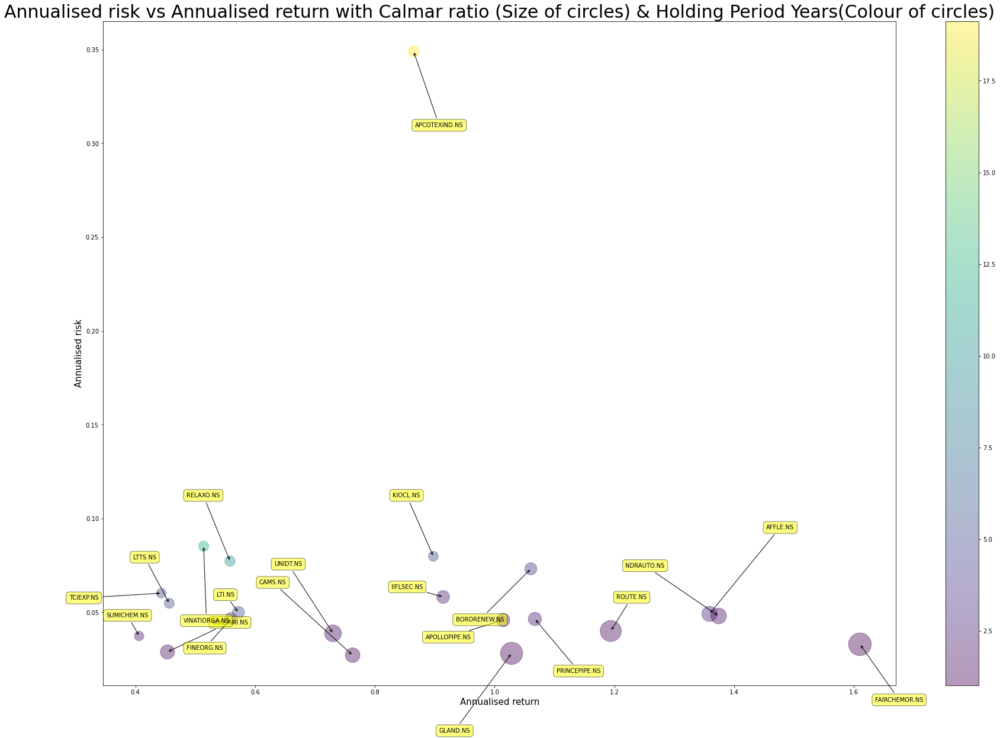

<Figure size 432x288 with 0 Axes>

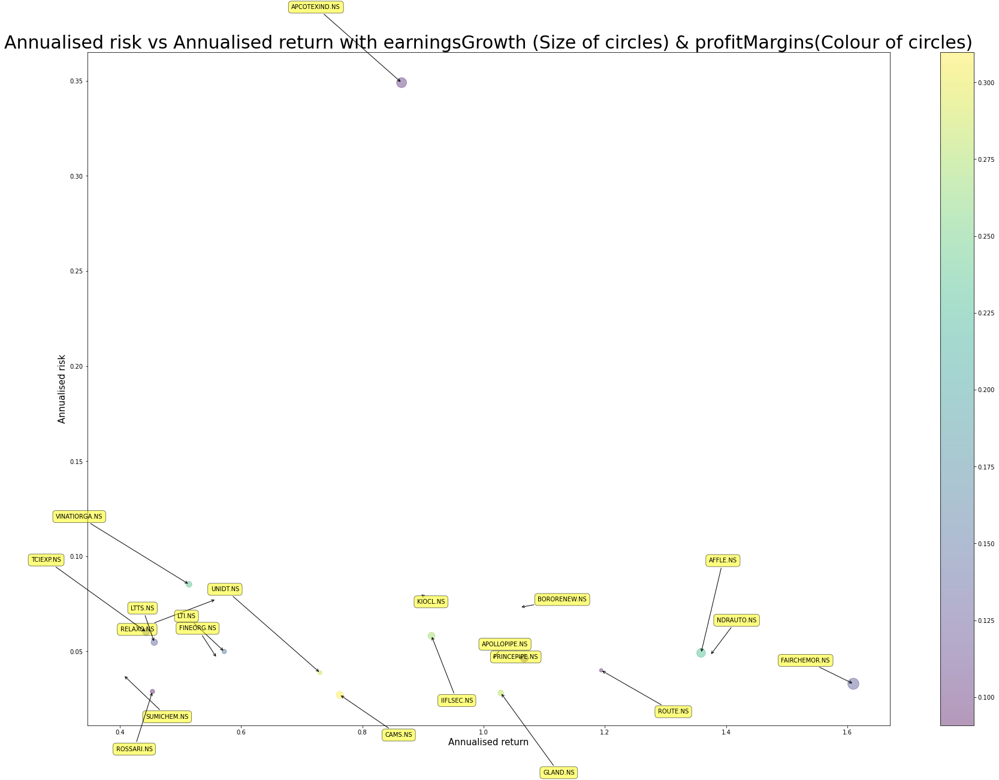

<Figure size 432x288 with 0 Axes>

In [86]:
def display_scatter_graph(data, x_param, y_param, colour_param, circle_size_param):
    #####################################################################
    ############ plt.scatter NOT EFFICIENT FOR large dataset ############ 
    #####################################################################
    rets = data #.dropna()#.sort_values(by=["Average drawdown", 'Max drawdown'])

    labels = rets.index

    rng = np.random.RandomState(0)
    colors = rng.rand(100)
    title = y_param + " vs " + x_param + " with " + circle_size_param + " (Size of circles) & " + colour_param +  "(Colour of circles)"
    fig=plt.figure(figsize=(30,20))
    plt.xlabel(x_param, fontsize=15)
    plt.ylabel(y_param, fontsize=15)
    plt.title(title, fontsize=30)
    plt.subplots_adjust(bottom = 0.1)
    colors[:len(rets.index)]
    plt.scatter(
    #    data[:, 0], data[:, 1], marker='o', c=data[:, 2], s=data[:, 3] * 1500,
        #rets["Annualised return"], rets["Annualised risk"], marker='o', c=colors[:len(rets.index)], alpha=0.8, s=rets["Calmar ratio"]*50, cmap='viridis')
        rets[x_param], rets[y_param], marker='o', c=rets[colour_param], alpha=0.4, s=rets[circle_size_param]*300, cmap='viridis')
    #    cmap=plt.get_cmap('Spectral'))
    plt.colorbar();  # show color scale

    for label, x, y in zip(labels, rets[x_param], rets[y_param]):
        # plt.annotate(
        #     label,
        #     xy=(x, y), xytext=(-20, 20),
        #     textcoords='offset points', ha='right', va='bottom',
        #     bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
        #     arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))
        plt.annotate(
            label,
            xy=(x, y), xytext=(random.randint(-150, 150), random.randint(-150, 150)),
            textcoords='offset points', ha='right', va='bottom',
            bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
            arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))
    plt.show()

    #fig.legend(labels=["Max drawdown [Lesser is better]", "Average drawdown [Lesser is better]", "Annualised return"],  loc='center' )
    plt.savefig(data_directory + title + ".svg")


data_directory
file = 'gsm_asm_groupby_sector_sorted_all_ratios.csv'
gsm_asm_groupby_sector_sorted_all_ratios = pd.DataFrame()

if (os.path.exists(data_directory + file)):
    gsm_asm_groupby_sector_sorted_all_ratios = pd.read_csv(data_directory + file, sep = ',', index_col=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
else:
    print("File does not exist!!")

pd.set_option('display.max_columns', 500)
#gsm_asm_groupby_sector_sorted_all_ratios.head()

result = gsm_asm_groupby_sector_sorted_all_ratios

good = result.loc[(result["Annualised return"] >= 0.3) & (result['Calmar ratio'] >= 0.8) & 
(result['Holding Period Years'] >= 1.0) & (result['MarketCap'] >= 1000000000) & 
(result['debtToEquity(Ideally 0.3 or less)'] <= 20) & (result['HeldPercentInsiders'] >= 0.30) & (result['profitMargins'] > 0.08) &
(np.logical_or(result['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]'] == 0, 
result['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]'].isna())) & 
(np.logical_or(result['(%) PLEDGE / DEMAT'] <= 10, result['(%) PLEDGE / DEMAT'].isna())) &
(result['50DMA>200DMA'] == True)]
good
# DMA 50 > DMA 200 AND DMA 50 previous day < DMA 200 previous day
#(result['Deviation from Ind PE'] <= 250) & (result['Deviation from Ind PB'] <= 250) ]
#good
len(good.index)


display_scatter_graph(good, "Annualised return", "Annualised risk", "Holding Period Years", "Calmar ratio")

display_scatter_graph(good, "Annualised return", "Annualised risk", "profitMargins", "earningsGrowth")


Index(['AFFLE.NS', 'SUMICHEM.NS', 'NDRAUTO.NS', 'APOLLOPIPE.NS', 'IIFLSEC.NS',
       'GLAND.NS', 'RELAXO.NS', 'CAMS.NS', 'LTI.NS', 'LTTS.NS', 'TCIEXP.NS',
       'UNIDT.NS', 'BORORENEW.NS', 'FAIRCHEMOR.NS', 'ROSSARI.NS',
       'PRINCEPIPE.NS', 'FINEORG.NS', 'APCOTEXIND.NS', 'VINATIORGA.NS',
       'KIOCL.NS', 'ROUTE.NS'],
      dtype='object')

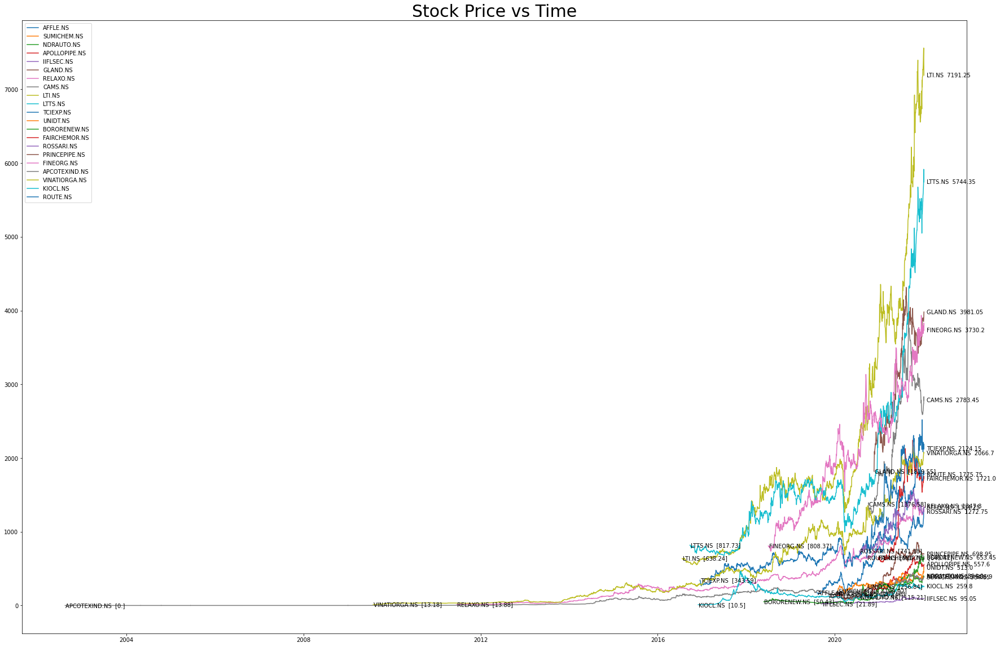

In [87]:
def display_annotated_stock_price(df_all_stock_price, title):
    fig, ax = plt.subplots(1, 1, figsize=(30, 20))
    ax.plot(df_all_stock_price.index ,df_all_stock_price)

    no_of_rows, no_of_columns = df_all_stock_price.shape
    plt.legend(labels=df_all_stock_price.columns)
    plt.title(title, fontsize=30)

    for i in df_all_stock_price.dropna().head(1).columns:
        df_cln = clean_dataset(pd.DataFrame(df_all_stock_price[i]))
        txt = i + "  " + str((df_cln.head(1).values[0]).round(2))
        ax.annotate(xy=(df_cln.head(1).index, df_cln.head(1)[i]), xytext=(1,0), textcoords='offset points', text=txt, va='center')

    for i in df_all_stock_price.dropna().tail(1).columns:
        txt = i + "  " + str((df_all_stock_price[i].dropna().tail(1).values[0]).round(2))
        ax.annotate(xy=(df_all_stock_price.dropna().tail(1).index, df_all_stock_price.dropna().tail(1)[i]), xytext=(5,0), textcoords='offset points', text=txt, va='center')

    return

#df_adj_close_percent_change, df_all_stock_price, bad_tickers = get_ticker_adj_close_price_and_percent_change(start, end, labels)

good.index

display_annotated_stock_price(df_all_stock_price[good.index], 'Stock Price vs Time')

,AFFLE.NS,SUMICHEM.NS,NDRAUTO.NS,APOLLOPIPE.NS,IIFLSEC.NS,GLAND.NS,RELAXO.NS,CAMS.NS,LTI.NS,LTTS.NS,TCIEXP.NS,UNIDT.NS,BORORENEW.NS,FAIRCHEMOR.NS,ROSSARI.NS,PRINCEPIPE.NS,FINEORG.NS,APCOTEXIND.NS,VINATIORGA.NS,KIOCL.NS,ROUTE.NS
256,1.0,0.783375,0.910501,0.829123,0.731106,0.865743,0.937949,0.569484,0.947143,0.967179,0.824365,0.983343,0.900374,0.684695,0.663549,0.797253,0.935924,0.868072,0.959673,0.546657,0.679276


Date,2022-01-06
AFFLE.NS,1.000000
UNIDT.NS,0.983343
LTTS.NS,0.967179
VINATIORGA.NS,0.959673
LTI.NS,0.947143
RELAXO.NS,0.937949
FINEORG.NS,0.935924
NDRAUTO.NS,0.910501
BORORENEW.NS,0.900374
APCOTEXIND.NS,0.868072


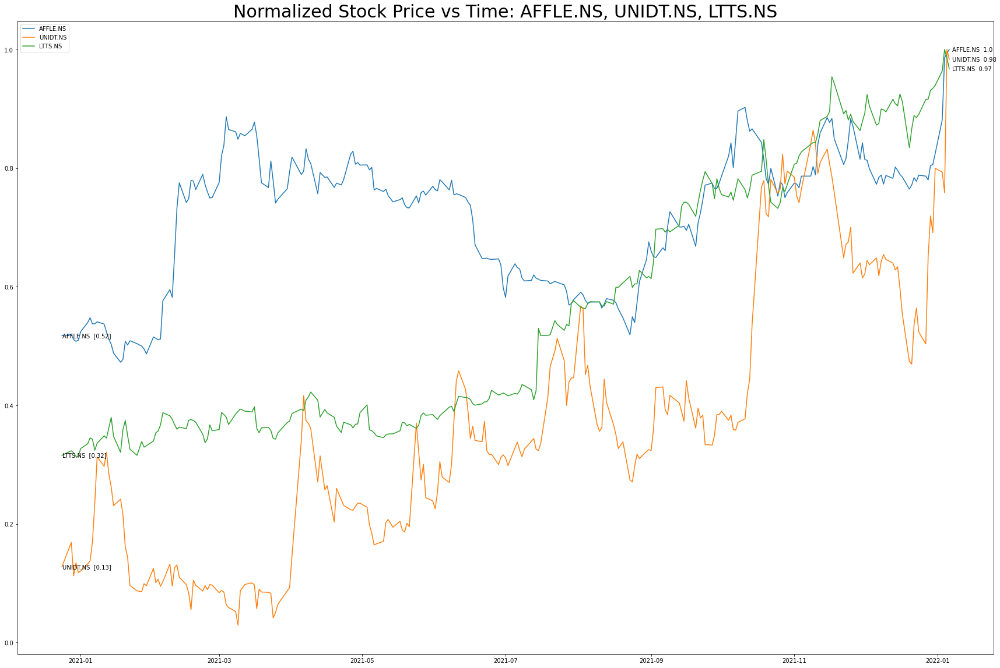

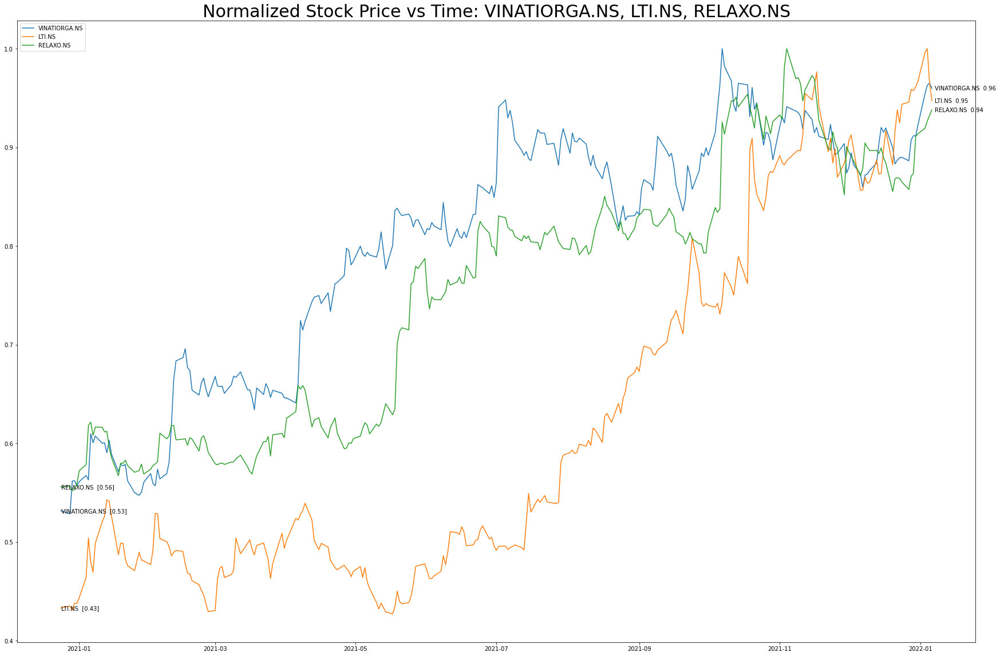

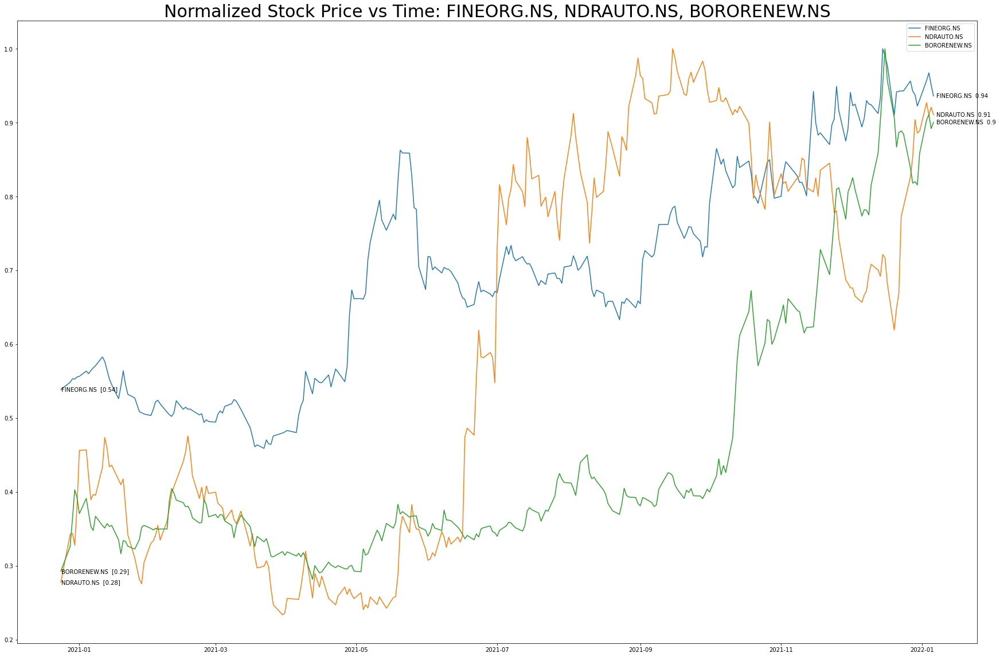

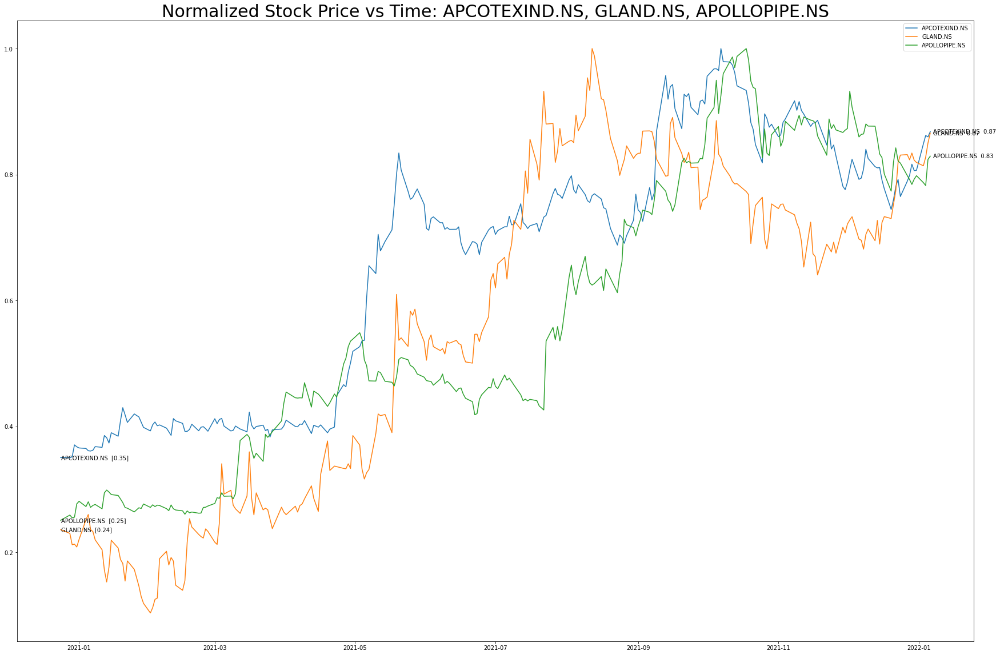

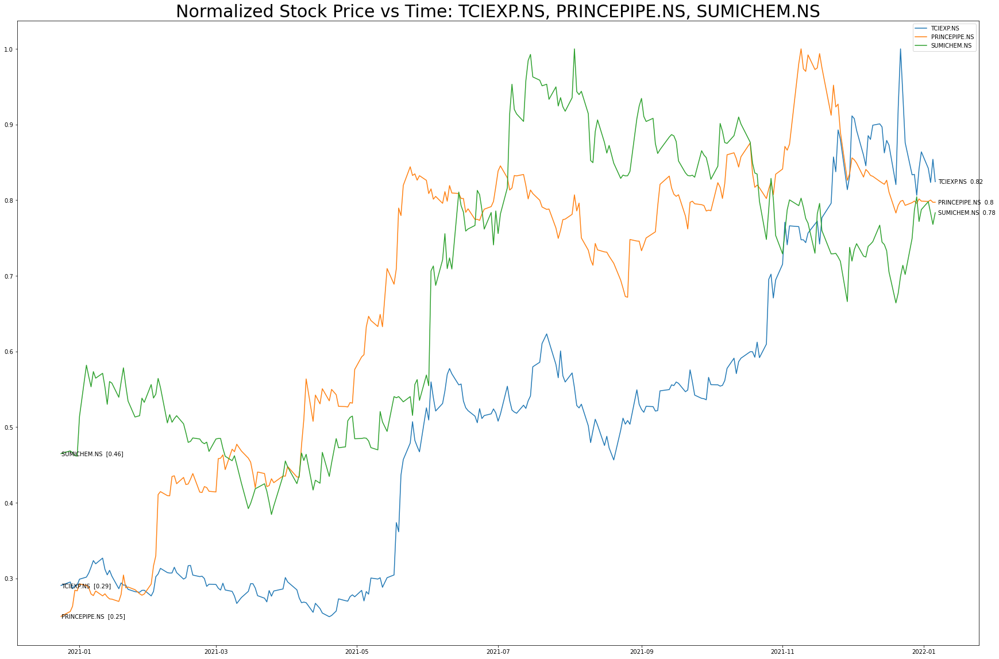

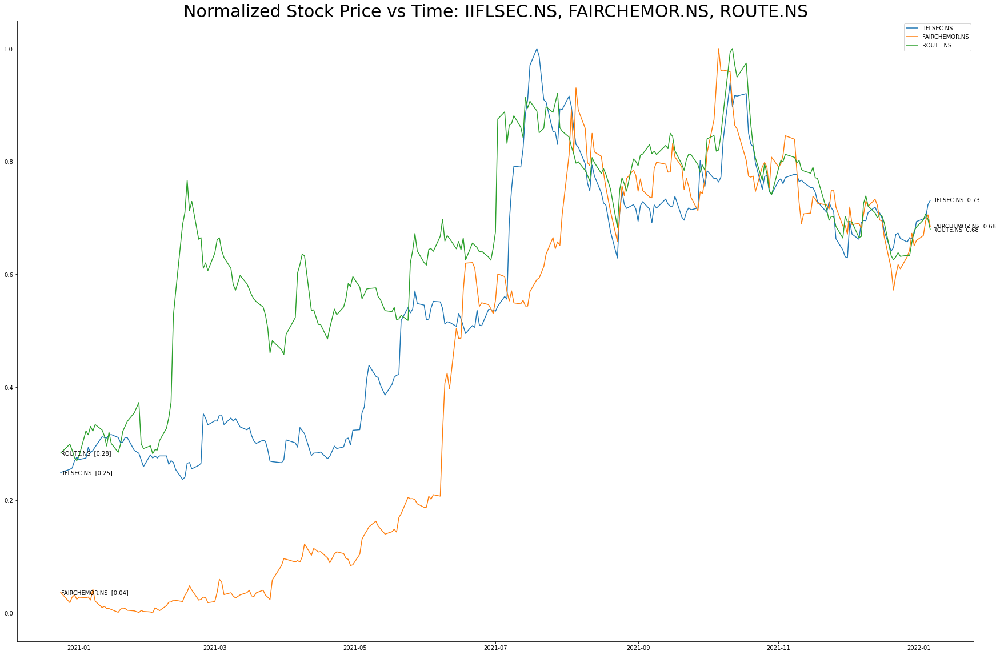

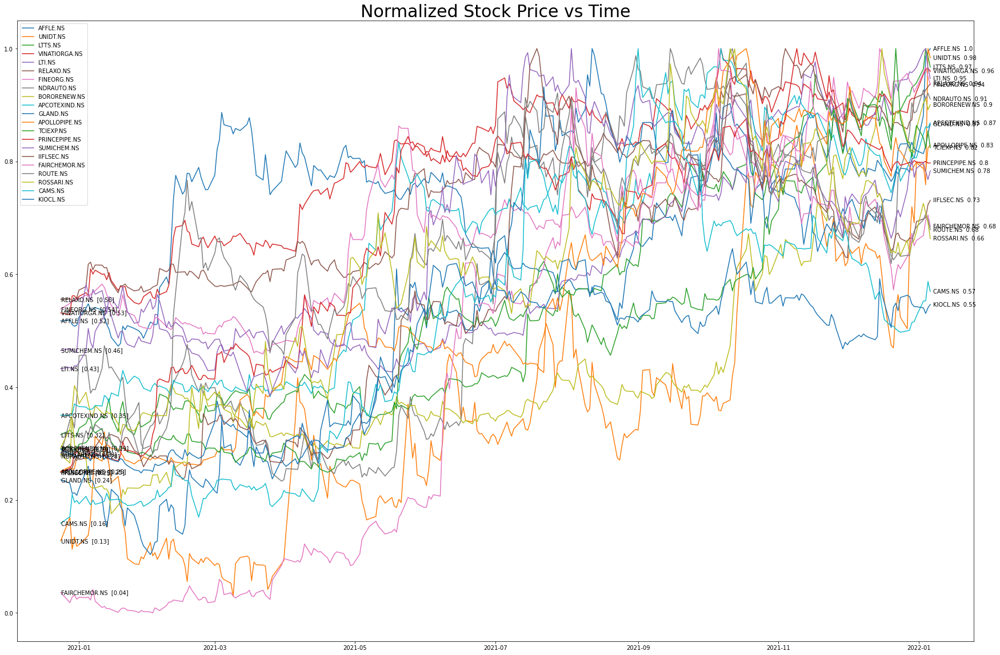

In [88]:
def normalize_data(df):
    # df on input should contain only one column with the price data (plus dataframe index)
    min = df.min()
    max = df.max()
    x = df 
    
    # time series normalization part
    # y will be a column in a dataframe
    y = (x - min) / (max - min)
    return y

df_all_stock_price_normalized = normalize_data(df_all_stock_price[good.index]).dropna()
no_of_rows, no_of_columns =  df_all_stock_price_normalized.shape
df_all_stock_price_normalized_wo_index = df_all_stock_price_normalized.reset_index(inplace = False, drop = True)

last_day = df_all_stock_price_normalized_wo_index.tail(1)
last_day
x = last_day.to_dict('r')

dct = {k: v for k, v in sorted(x[0].items(), key=lambda item: item[1], reverse=True)}
sorted_stock = list(dct.keys())

#df_all_stock_price_normalized.head()
df_all_stock_price_normalized_sorted = df_all_stock_price_normalized[sorted_stock]
df_all_stock_price_normalized_sorted.tail(1).T

no_of_stocks_per_graph = 3
start = 0
for j in np.arange(no_of_stocks_per_graph,len(sorted_stock),no_of_stocks_per_graph):
    t = df_all_stock_price_normalized_sorted.T[start:j].T
    display_annotated_stock_price(t, 'Normalized Stock Price vs Time: ' + ', '.join(pd.Series(t[start:j].columns.values).to_list()))
    start = j

display_annotated_stock_price(df_all_stock_price_normalized_sorted, 'Normalized Stock Price vs Time')

In [89]:
#sorted_all_ratios = sorted_all_ratios[["Annualised return", "Expected return[Equity Risk Premium based]", "Annualised risk", "Calmar ratio", "Sterling ratio", "Sortino ratio", 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", "Max drawdown", "Average drawdown", "Beta [Systematic Risk]", "Idiosyncratic volatility [Unsystematic Risk]", "Semideviation"]]
#sorted_all_ratios = sorted_all_ratios.sort_values(by=['Calmar ratio', 'Sterling ratio', 'Sortino ratio', 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", "Idiosyncratic volatility [Unsystematic Risk]"], ascending=False)

too_good  = result.loc[(result["Annualised return"] >= 0.3) & (result['Calmar ratio'] >= 1.0) & 
(result['Holding Period Years'] >= 1.0) & (result['MarketCap'] >= 1000000000) & 
(result['debtToEquity(Ideally 0.3 or less)'] <= 40) & (result['HeldPercentInsiders'] >= 0.45) & (result['profitMargins'] > 0.1) &
(np.logical_or(result['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]'] == 0, 
result['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]'].isna())) & 
(np.logical_or(result['(%) PLEDGE / DEMAT'] <= 10, result['(%) PLEDGE / DEMAT'].isna())) &
(result['50DMA>200DMA'] == True)]


too_good  = result.loc[(result["Annualised return"] >= 0.3) & (result['Calmar ratio'] >= 0.8) & 
(result['Holding Period Years'] >= 1.0) & (result['MarketCap'] >= 1000000000) & 
(result['debtToEquity(Ideally 0.3 or less)'] <= 20) & (result['HeldPercentInsiders'] >= 0.30) & (result['profitMargins'] > 0.08) &
(np.logical_or(result['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]'] == 0, 
result['PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)]'].isna())) & 
(np.logical_or(result['(%) PLEDGE / DEMAT'] <= 10, result['(%) PLEDGE / DEMAT'].isna())) &
(result['50DMA>200DMA'] == True)]

#(result['Deviation from Ind PE'] <= 250) & (result['Deviation from Ind PB'] <= 250) ]

#too_good = result.loc[(result["Annualised return"] >= 0.5) & (result['Calmar ratio'] >= 3.0) & (result['Sharpe ratio'] >= 3.0) & (result['Holding Period Years'] >= 1.0) & (result['MarketCap'] >= 1000000000)]
too_good


,Industry,Sector,Industry.1,Annualised return,Holding Period Years,GSM STAGE,LT ASM STAGE,ST ASM STAGE,MarketCap,enterpriseValue,earningsGrowth,pegRatio,CurrentPrice,Calmar ratio,Sterling ratio,Sortino ratio,Sharpe ratio,Treynor ratio,Jensen's alpha,Information ratio,Appraisal ratio,Tracking error,Max drawdown,Average drawdown,Expected return[Equity Risk Premium based],Annualised risk,RevenuePerShare,Beta [Systematic Risk],Idiosyncratic volatility [Unsystematic Risk],HeldPercentInsiders,HeldPercentInstitutions,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,bookValue,debtToEquity(Ideally 0.3 or less),returnOnEquity(Ideally > 20%),profitMargins,dividendYield,ForwardEPS,TrailingPE(CurrentPrice/TrailingEPS) Lower better,52WeekChange,fiftyDayAverage,TwoHundredDayAverage,50DMA>200DMA,TrailingAnnualDividendYield,PayoutRatio,AverageVolume10days,RegularMarketVolume,DividendRate,ExDividendDate,Beta from YF,longBusinessSummary
AFFLE.NS,Advertising Agencies,Communication Services,Advertising Agencies,1.35879,2.369048,NaN,NaN,NaN,1.591350e+11,1.446571e+11,0.709,93.682685,1194.25,2.244254,-77.853353,13.310322,26.606480,2.179650,1.276038,11.531515,11.540516,0.108821,0.582728,-0.016798,0.099,0.049153,57.178,0.6,0.110570,0.59911,0.18591,NaN,NaN,78.688,15.778,0.26442,0.23270,NaN,17.98,89.759480,0.424069,1102.68500,1019.88794,True,NaN,0.0000,232788.0,1001679.0,NaN,NaN,1.771658,"Affle (India) Limited, together with its subsi..."
SUMICHEM.NS,Agricultural Inputs,Basic Materials,Agricultural Inputs,0.40638,1.920635,NaN,NaN,NaN,1.930946e+11,1.853545e+11,-0.022,NaN,386.85,0.857268,-37.639591,4.109935,9.519724,0.444225,0.313044,3.649983,3.376955,0.082866,0.414549,-0.009442,0.115,0.037331,55.851,0.8,0.092700,0.75370,0.06562,NaN,NaN,35.281,2.436,0.23081,0.13213,0.0021,NaN,52.418697,0.195386,375.26300,373.99774,True,0.002056,0.1084,300116.0,566662.0,0.80,2021-07-22,NaN,Sumitomo Chemical India Limited engages in the...
NDRAUTO.NS,Auto Parts,Consumer Cyclical,Auto Parts,1.37408,1.424603,NaN,NaN,NaN,2.108367e+09,1.400371e+09,NaN,NaN,352.35,2.359351,-88.003982,14.832530,27.548091,1.890114,1.286036,9.293680,9.289224,0.136669,0.560781,-0.015034,0.107,0.048028,261.438,0.7,0.138444,0.77698,0.00000,NaN,NaN,299.495,2.490,NaN,0.10051,0.0027,NaN,24.554007,NaN,352.39200,314.53450,True,0.003122,0.0000,20273.0,20999.0,1.00,2021-09-14,NaN,NDR Auto Components Limited engages in the man...
APOLLOPIPE.NS,Building Products & Equipment,Industrials,Building Products & Equipment,1.01408,2.130952,NaN,Stage I,NaN,7.252081e+09,2.104864e+10,NaN,NaN,533.15,1.745327,-62.583304,10.316195,20.994582,1.203850,0.920744,8.880914,8.473697,0.102485,0.551805,-0.015389,0.115,0.045873,164.799,0.8,0.108659,0.59207,0.10974,0.0,7.19,95.393,6.335,0.16093,0.08607,NaN,NaN,16.302650,1.304784,572.43634,458.97950,True,0.001769,0.0000,46003.0,59638.0,NaN,NaN,1.258849,Apollo Pipes Limited engages in the manufactur...
IIFLSEC.NS,Capital Markets,Financial Services,Capital Markets,0.91401,2.261905,NaN,NaN,NaN,2.694785e+10,-3.825535e+09,0.447,NaN,88.95,1.598723,-35.662736,7.157027,14.837544,1.232871,0.825966,6.212216,6.165001,0.130403,0.539812,-0.024199,0.107,0.058164,31.840,0.7,0.133977,0.65344,0.17743,NaN,NaN,31.945,17.820,0.25805,0.27182,0.0113,NaN,12.872648,NaN,93.08600,85.19025,True,0.011274,0.1173,207432.0,141942.0,1.00,2021-03-18,1.300097,IIFL Securities Limited provides capital marke...
GLAND.NS,Drug Manufacturers—General,Healthcare,Drug Manufacturers—General,1.02835,1.107143,NaN,NaN,NaN,6.322215e+11,6.062603e+11,0.301,NaN,3851.30,4.698661,-232.316037,18.772403,34.776899,9.773500,0.972058,9.508899,10.479219,0.097217,0.208006,-0.004207,0.059,0.028103,244.870,0.1,0.092761,0.68073,0.18214,NaN,NaN,401.088,0.073,NaN,0.28061,NaN,NaN,64.743430,0.565514,3633.76600,3475.12520,True,NaN,0.0000,218502.0,640087.0,NaN,NaN,NaN,Gland Pharma Limited engages in the developmen...
RELAXO.NS,Footwear & Accessories,Consumer Cyclical,Footwear & Accessories,0.55813,10.317460,Na

,LTI.NS,GLAND.NS,LTTS.NS,RELAXO.NS,VINATIORGA.NS,SUMICHEM.NS,AFFLE.NS,KIOCL.NS,CAMS.NS,FINEORG.NS,ROUTE.NS,TCIEXP.NS,BORORENEW.NS,PRINCEPIPE.NS,ROSSARI.NS,IIFLSEC.NS,FAIRCHEMOR.NS,APCOTEXIND.NS,UNIDT.NS,APOLLOPIPE.NS,NDRAUTO.NS
MarketCap,122956.139725,63222.146662,55834.116096,31033.167053,19708.711731,19309.463142,15913.500672,15479.416422,12715.633050,11529.392128,11369.621094,9196.820890,8399.095398,7723.026022,7220.554138,2694.784614,2098.066227,1832.449434,801.714688,725.208115,210.836736
enterpriseValue,93350.677709,60626.029773,57388.118835,30872.220467,20195.842458,18535.445299,14465.708851,14254.543667,12251.280998,8703.734579,9913.400525,7142.925107,5287.515341,7779.859661,7018.937549,-382.553498,2492.784026,1840.460186,1244.570214,2104.863744,140.037082


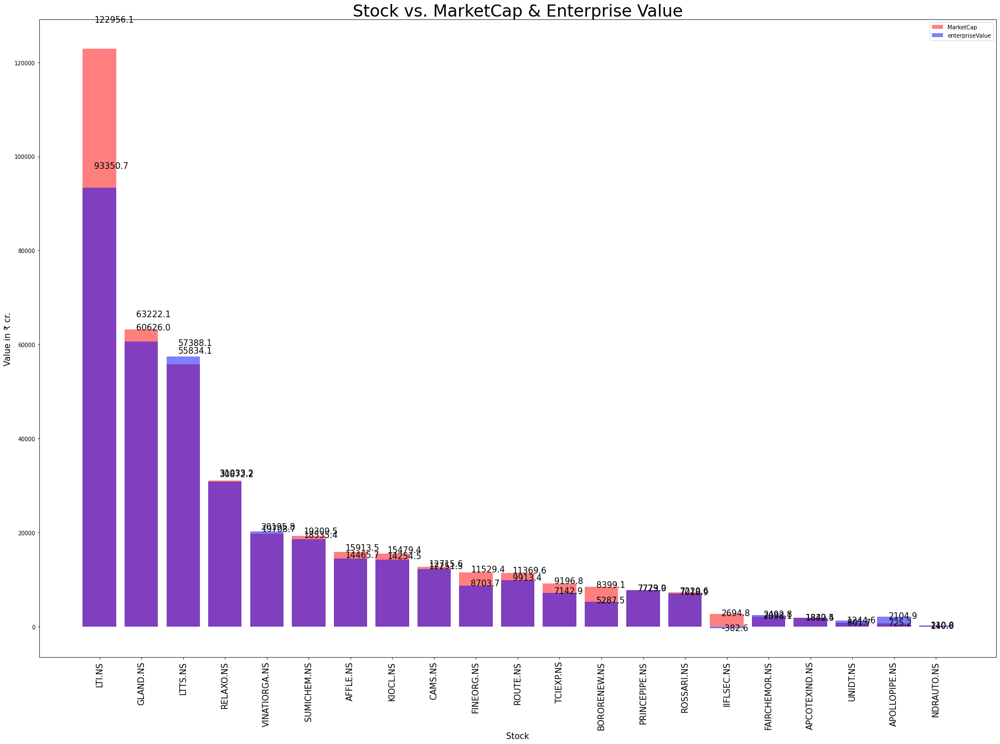

In [90]:
# xtick_parm1, xtick_parm2 are columns names within dataframe data
def display_bar_graph_two_parameters(data, xtick_parm1, xtick_parm2, xlabel, ylabel, title):
    xticks = data.columns

    fig=plt.figure(figsize=(24,16))
    ax=fig.add_axes([0,0,1,1])
    plt.xlabel(xlabel, fontsize=15)
    plt.ylabel(ylabel, fontsize=15)
    plt.title(title, fontsize=30)
    plt.xticks(range(len(xticks)), xticks, rotation='vertical', fontsize=15)
    #plt.scatter(range(len(rets.columns)), rets.loc["Calmer Ratio", : ], s=area)

    ax.bar(range(len(xticks)), data.loc[xtick_parm1], color='r', alpha=0.5)
    ax.bar(range(len(xticks)), data.loc[xtick_parm2], color='b', alpha=0.5)
    #ax.bar(range(len(rets.columns)), np.clip(rets.loc["Sterling Ratio", : ], -0.5, 1.5), color='b')

    # Annotate Text
    for i, ar in enumerate(data.loc[xtick_parm1]):
        if (ar > 0):
            ax.text(i-0.125, ar + (ar * 0.05), round(ar, 1), verticalalignment='center', fontsize=15)
        elif (ar < 0):
            ax.text(i-0.125, ar - (ar * 0.05), round(ar, 1), verticalalignment='center', fontsize=15)
        else:
            ax.text(i-0.125, ar, round(ar, 2), verticalalignment='center', fontsize=15)


    for i, ar in enumerate(data.loc[xtick_parm2]):
        if (ar > 0):
            ax.text(i-0.125, ar + (ar * 0.05), round(ar, 1), verticalalignment='center', fontsize=15)
        elif (ar < 0):
            ax.text(i-0.125, ar - (ar * 0.05), round(ar, 1), verticalalignment='center', fontsize=15)
        else:
            ax.text(i-0.125, ar, round(ar, 2), verticalalignment='center', fontsize=15)

    #p1 = patches.Rectangle((.57, -0.005), width=.33, height=.13, alpha=.1,  angle=0.0, facecolor='red', label="red", transform=fig.transFigure)
    #p2 = patches.Rectangle((.124,-0.005), width=.446, height=.13, alpha=.1,  angle=0.0, facecolor='green', label="green", transform=fig.transFigure)
    #fig.add_artist(p1)
    #fig.add_artist(p2)

    ax.legend(labels=[xtick_parm1, xtick_parm2])
    plt.savefig(data_directory + title + ".svg")

    return

title = "Stock vs. MarketCap & Enterprise Value"

#rets = sorted_all_ratios.dropna().sort_values(by=['Annualised return'], ascending=False)
rets = too_good[['MarketCap', 'enterpriseValue']].sort_values(by=['MarketCap'], ascending=False)
rets = np.divide(rets, 10000000)
rets = rets.T
rets

display_bar_graph_two_parameters(rets, 'MarketCap', 'enterpriseValue', "Stock", "Value in ₹ cr.", title)

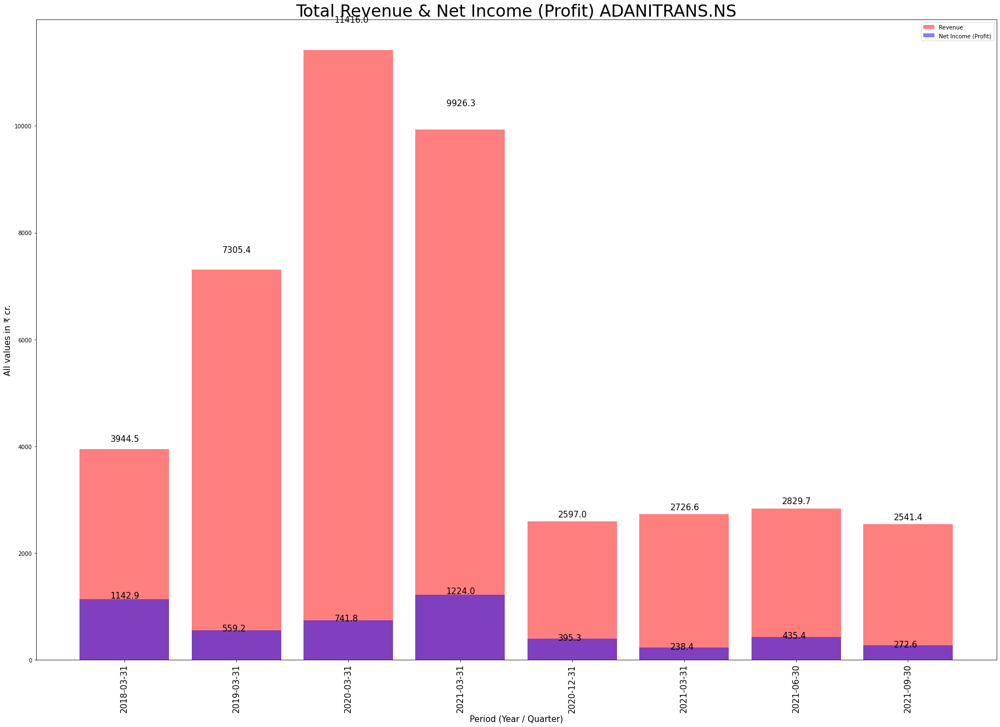

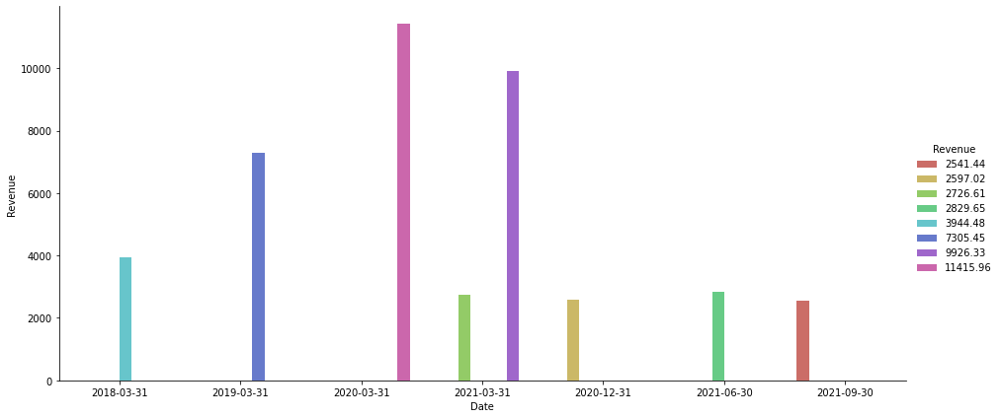

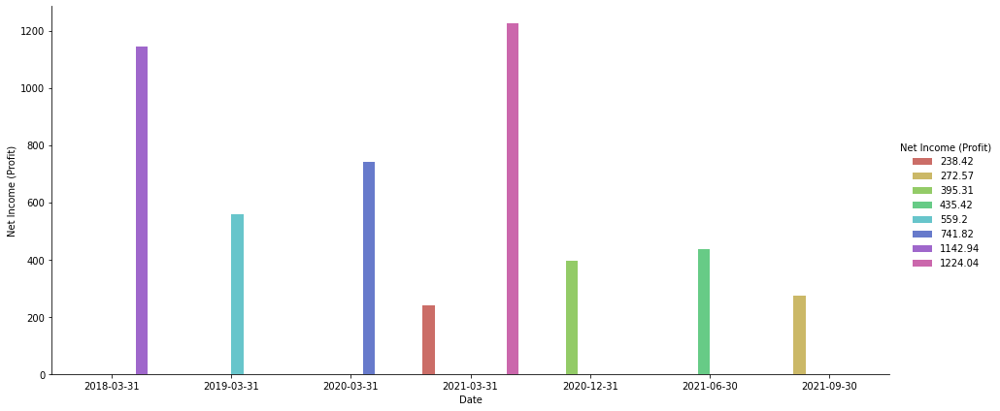

In [91]:
import seaborn as sns

def get_financial(stock):
    financial = pd.DataFrame()
    if (os.path.exists(data_directory + stock + '_financials.csv')):
        financial_yearly = pd.read_csv(data_directory + stock + '_financials.csv', sep = ',', index_col=0, header=0).sort_index(axis=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
        financial_quarterly = pd.read_csv(data_directory + stock + '_quarterly_financials.csv', sep = ',', index_col=0, header=0).sort_index(axis=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
        financial = pd.concat([financial_yearly, financial_quarterly], axis=1)
        financial = financial.T

        financial.rename(columns = {'Total Revenue':'Revenue'}, inplace = True)
        financial.rename(columns = {'Net Income':'Net Income (Profit)'}, inplace = True)
        try:
            financial = financial[['Revenue', 'Net Income (Profit)']].T
        except KeyError:
            print("Oops!", sys.exc_info(), "occurred.")
    else:
        print("File does not exist!!")
    
    return financial


title = "Total Revenue & Net Income (Profit)"

for i in ['ADANITRANS.NS']: #too_good.index[:1]:
    financial  = get_financial(i).divide(10000000) #Convert into crore

    display_bar_graph_two_parameters(financial, 'Revenue', 'Net Income (Profit)', 'Period (Year / Quarter)', 'All values in ₹ cr.', title + " " + i)

    financial = financial.T.reset_index()
    financial.columns = ["Date", "Revenue", "Net Income (Profit)"]
    sns.catplot(x='Date', y='Revenue', hue='Revenue', data=financial, kind='bar', height=6, aspect=13/6, legend=True, palette='hls')
    sns.catplot(x='Date', y='Net Income (Profit)', hue='Net Income (Profit)', data=financial, kind='bar', height=6, aspect=13/6, legend=True, palette='hls')

0 AFFLE.NS
1 SUMICHEM.NS
2 NDRAUTO.NS
3 APOLLOPIPE.NS
4 IIFLSEC.NS
5 GLAND.NS
6 RELAXO.NS
7 CAMS.NS
8 LTI.NS
9 LTTS.NS
10 TCIEXP.NS
11 UNIDT.NS
12 BORORENEW.NS
13 FAIRCHEMOR.NS
14 ROSSARI.NS
15 PRINCEPIPE.NS
16 FINEORG.NS
17 APCOTEXIND.NS
18 VINATIORGA.NS
19 KIOCL.NS
20 ROUTE.NS


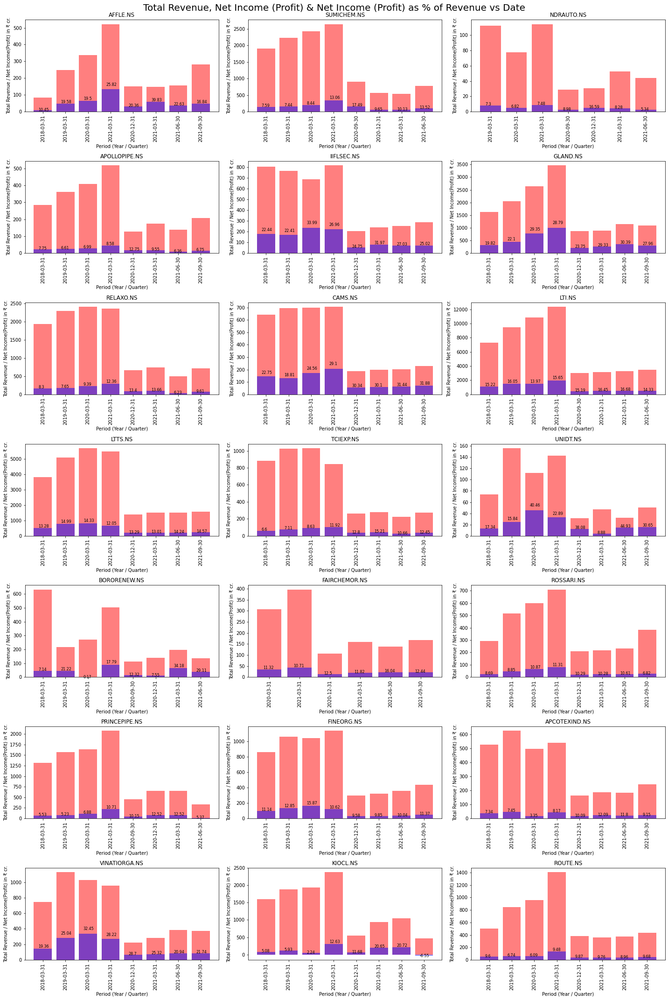

In [92]:

def display_multigrid_bar_graph(list_of_stocks, num_of_columns_in_subplot):
    length = len(list_of_stocks)
    length

    num_of_columns_in_subplot
    num_of_rows_in_subplot = math.ceil(length / num_of_columns_in_subplot)
    num_of_rows_in_subplot

    fig, ax_lst = plt.subplots(num_of_rows_in_subplot, num_of_columns_in_subplot)  # a figure with a 2x2 grid of Axes
    fig.set_figheight(6 * 5)
    fig.set_figwidth(4 * 5)

    fig.suptitle('Total Revenue, Net Income (Profit) & Net Income (Profit) as % of Revenue vs Date', fontsize=20,  y=0.99 )  # add a overall title

    for i, v in enumerate(list_of_stocks):
        print(i, v)
        r= int(i/num_of_columns_in_subplot)
        ax_lst[r,i-(num_of_columns_in_subplot*r)].set_title(list_of_stocks[i])
        try:
            financial  = get_financial(v).divide(10000000).T.reset_index() #Convert into crore
            percent_profit_of_revenue = ((financial['Net Income (Profit)'] / financial['Revenue']) * 100).round(2)
            #percent_profit_of_revenue
            financial = pd.concat([financial, percent_profit_of_revenue], axis=1)
            financial.columns = ["Date", "Revenue", "Net Income (Profit)", "Profit as % of revenue"]
            ax_lst[r,i-(num_of_columns_in_subplot*r)].bar(range(len(financial['Revenue'])), financial['Revenue'], color='r', alpha=0.5)
            ax_lst[r,i-(num_of_columns_in_subplot*r)].bar(range(len(financial['Net Income (Profit)'])), financial['Net Income (Profit)'], color='b', alpha=0.5)
            #g = sns.catplot(x='Date', y='Revenue', hue='Revenue', data=f, kind='bar', legend=True, palette='hls', ax=ax_lst[r,i-(num_of_columns_in_subplot*r)]) # pass ax

            ax_lst[r,i-(num_of_columns_in_subplot*r)].set_xticks(range(len(financial['Date'])))
            ax_lst[r,i-(num_of_columns_in_subplot*r)].set_xticklabels(financial['Date'], rotation='vertical', fontsize=10)
            ax_lst[r,i-(num_of_columns_in_subplot*r)].set(xlabel='Period (Year / Quarter)', ylabel='Total Revenue / Net Income(Profit) in ₹ cr.')

            # Annotate Text
            for y, profit_percentage in enumerate(financial['Net Income (Profit)']):
                ax_lst[r,i-(num_of_columns_in_subplot*r)].text(y-0.2, financial['Net Income (Profit)'][y] * 1.20, financial["Profit as % of revenue"][y], verticalalignment='center', fontsize=8)
        except KeyError:
            print("Oops!", sys.exc_info(), "occurred.")
    plt.tight_layout()




display_multigrid_bar_graph(too_good.index, 3)

In [ ]:


def add_annotate_text(y_axis_values, ax, lower_clip_limit=0, upper_clip_limit=100000):
    # # Annotate Text
    for i, ar in enumerate(y_axis_values):
        if (ar > 0.0):
            if (ar > upper_clip_limit):
                ax.text(i-0.25, upper_clip_limit, round(ar, 1), verticalalignment='center')
            else:
                ax.text(i-0.25, ar+0.05, round(ar, 1), verticalalignment='center')
        elif (ar < 0.0):
            if (ar > lower_clip_limit):
                ax.text(i-0.25, lower_clip_limit, round(ar, 2), verticalalignment='center')
            else:
                ax.text(i-0.25, ar-0.05, round(ar, 2), verticalalignment='center')
        else:
            ax.text(i-0.25, ar, round(ar, 2), verticalalignment='center')


def display_overlapping_multi_bar_graph(rets):
    title = "Stock vs Annualised return and Drawdowns"

    fig=plt.figure(figsize=(12,8))
    ax=fig.add_axes([0,0,1,1])
    plt.xlabel("Scrip", fontsize=15)
    plt.ylabel("Return", fontsize=15)
    plt.title(title, fontsize=20)
    plt.xticks(range(len(rets.columns)), rets.columns, rotation='vertical')

    ax.bar(range(len(rets.columns)), rets.loc["Max drawdown", : ], color='aqua', alpha=0.5)
    add_annotate_text(rets.loc["Max drawdown", : ], ax)
    ax.bar(range(len(rets.columns)), rets.loc["Average drawdown", : ], color='magenta', alpha=0.5)
    add_annotate_text(rets.loc["Average drawdown", : ], ax)
    lower_clip_limit = -0.5
    upper_clip_limit = 1.5
    ax.bar(range(len(rets.columns)), np.clip(rets.loc["Annualised return", : ], lower_clip_limit, upper_clip_limit), color='gold', alpha=0.5)
    add_annotate_text(rets.loc['Annualised return', : ], ax, lower_clip_limit, upper_clip_limit)


    ax.legend(labels=["Max drawdown [Lesser is better]", "Average drawdown [Lesser is better]", "Annualised return"],  loc='center' )
    plt.savefig(data_directory + title + ".svg")


rets = too_good[['Annualised return', 'Average drawdown', 'Max drawdown']].dropna().sort_values(by=["Average drawdown", 'Max drawdown'])
rets = rets.T
display_overlapping_multi_bar_graph(rets)


,Industry,Sector,Industry.1,Annualised return,Holding Period Years,GSM STAGE,LT ASM STAGE,ST ASM STAGE,MarketCap,enterpriseValue,earningsGrowth,pegRatio,CurrentPrice,Calmar ratio,Sterling ratio,Sortino ratio,Sharpe ratio,Treynor ratio,Jensen's alpha,Information ratio,Appraisal ratio,Tracking error,Max drawdown,Average drawdown,Expected return[Equity Risk Premium based],Annualised risk,RevenuePerShare,Beta [Systematic Risk],Idiosyncratic volatility [Unsystematic Risk],HeldPercentInsiders,HeldPercentInstitutions,PROMOTER SHARES ENCUMBERED AS OF LAST QUARTER % OF TOTAL SHARES [X/(A+B+C)],(%) PLEDGE / DEMAT,bookValue,debtToEquity(Ideally 0.3 or less),returnOnEquity(Ideally > 20%),profitMargins,dividendYield,ForwardEPS,TrailingPE(CurrentPrice/TrailingEPS) Lower better,52WeekChange,fiftyDayAverage,TwoHundredDayAverage,50DMA>200DMA,TrailingAnnualDividendYield,PayoutRatio,AverageVolume10days,RegularMarketVolume,DividendRate,ExDividendDate,Beta from YF,longBusinessSummary
APCOTEXIND.NS,Specialty Chemicals,Basic Materials,Specialty Chemicals,0.86470,19.123016,NaN,NaN,NaN,1.832449e+10,1.840460e+10,0.915,NaN,353.05,1.126121,-4.631287,2.768608,2.331049,1.017125,0.771364,3.937793,3.929491,0.193200,0.722569,-0.175696,0.115,0.349070,150.233,0.8,0.196301,0.60362,0.00014,0.0,3.07,58.907,10.299,0.27048,0.10681,0.0099,NaN,41.45239,NaN,372.765,332.57574,True,0.010059,0.2178,52241.0,31477.0,3.50,2021-07-01,0.745132,Apcotex Industries Limited produces and sells ...
KIOCL.NS,Steel,Basic Materials,Steel,0.89768,5.007937,NaN,NaN,NaN,1.547942e+11,1.425454e+11,NaN,NaN,258.75,0.938667,-6.407921,4.918940,10.605737,1.209543,0.809636,6.559187,6.549347,0.121015,0.902002,-0.132130,0.107,0.079832,48.956,0.7,0.123621,0.99037,0.00000,NaN,NaN,34.091,5.431,0.21999,0.14823,0.0113,NaN,52.27832,0.88216,253.555,244.04900,True,0.006288,0.2271,157177.0,87464.0,2.62,2021-11-25,1.592035,KIOCL Limited manufactures and sells iron oxid...
VINATIORGA.NS,Specialty Chemicals,Basic Materials,Specialty Chemicals,0.51406,12.186508,NaN,NaN,NaN,1.970871e+11,2.019584e+11,0.310,NaN,1916.50,0.998169,-5.683765,2.633767,5.432591,0.771767,0.431308,4.909791,5.115879,0.083535,0.463910,-0.081471,0.099,0.085237,122.966,0.6,0.084308,0.75304,0.10450,0.0,0.71,150.163,0.006,0.19476,0.23521,0.0033,NaN,73.14885,NaN,1950.526,1857.90750,True,0.003140,0.2075,24724.0,21116.0,6.50,2021-06-24,-0.111504,"Vinati Organics Limited, a specialty chemical ..."
RELAXO.NS,Footwear & Accessories,Consumer Cyclical,Footwear & Accessories,0.55813,10.317460,NaN,NaN,NaN,3.103317e+11,3.087222e+11,-0.086,-968.785392,1248.90,1.033003,-8.138142,3.172107,6.560955,1.014260,0.480670,5.500730,5.779177,0.082573,0.490928,-0.062315,0.091,0.077295,105.916,0.5,0.083173,0.74721,0.09652,0.0,1.56,55.260,8.578,0.19556,0.11093,0.0020,14.99,128.75258,NaN,1311.033,1156.67550,True,0.000000,0.2131,136074.0,136650.0,2.50,2021-08-17,0.279646,Relaxo Footwears Limited manufactures and sell...
BORORENEW.NS,Packaging & Containers,Consumer Cyclical,Packaging & Containers,1.06046,3.543651,NaN,NaN,NaN,8.399095e+10,5.287515e+10,NaN,NaN,645.30,1.432875,-17.680150,7.279934,13.800617,1.261825,0.967124,7.364753,7.186946,0.129881,0.704500,-0.057096,0.115,0.073146,47.933,0.8,0.134567,0.68506,0.00091,NaN,NaN,47.326,9.996,NaN,0.22442,NaN,NaN,85.35714,NaN,554.858,357.13474,True,NaN,0.0000,697180.0,304950.0,NaN,2019-12-18,2.757602,Borosil Renewables Limited engages in the manu...


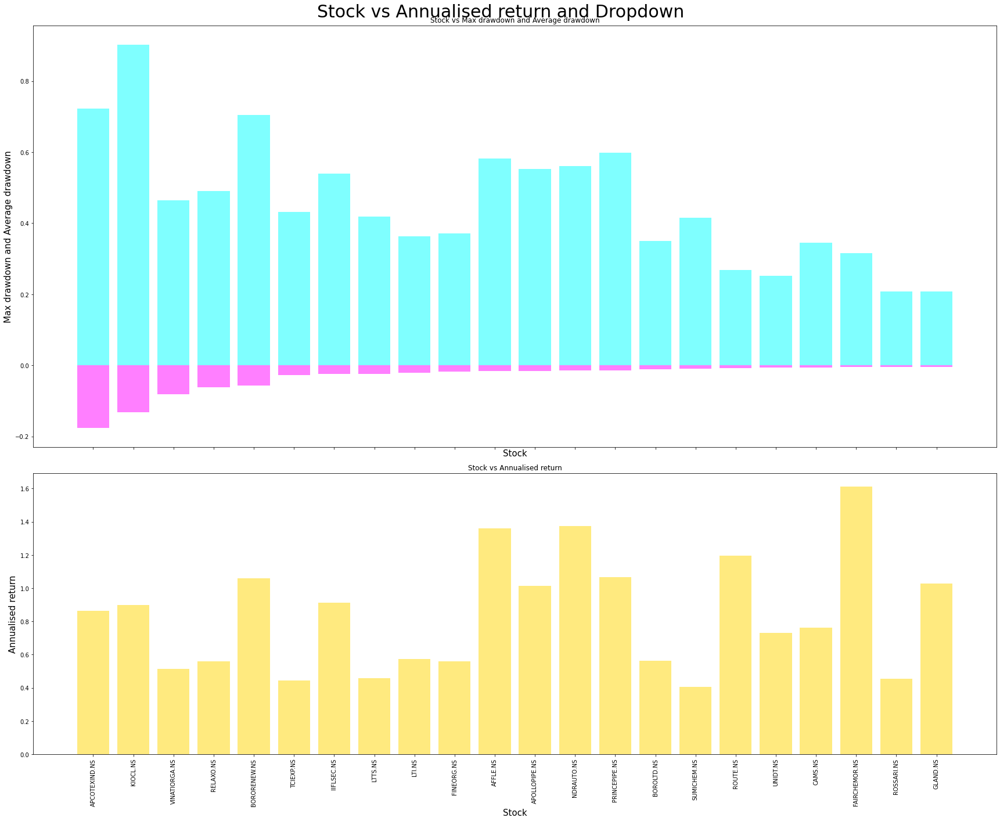

In [ ]:
#color='rgbycmk'
#ax.set_color_cycle(colors)

def display_hortzontal_subplots(rets):
    # using subplot function and creating plot one
    # row 2, column 1, count 1
    fig, ax = plt.subplots(nrows=2, ncols=1, sharex=True, sharey=False, gridspec_kw={'height_ratios':[3,2]}, figsize=(24,20))
    fig.suptitle("Stock vs Annualised return and Dropdown", fontsize=30)
    #ax[0].plot(x, y, color='red')
    #ax[1].plot(x, y, color='blue')
    plt.gca().set_xlabel('Stock', fontsize=15)
    ax[0].set_xticks(range(len(rets.columns)))
    ax[0].set_xticklabels(rets.columns, rotation='vertical')
    ax[0].title.set_text('Stock vs Max drawdown and Average drawdown')
    ax[0].set_xlabel('Stock', fontsize=15)
    ax[0].set_ylabel('Max drawdown and Average drawdown', fontsize=15)
    ax[0].bar(range(len(rets.columns)), rets.loc["Max drawdown", : ], color='aqua', alpha=0.5)
    ax[0].bar(range(len(rets.columns)), rets.loc["Average drawdown", : ], color='magenta', alpha=0.5)

    ax[1].set_xticks(range(len(rets.columns)))
    ax[1].set_xticklabels(rets.columns, rotation='vertical')
    ax[1].title.set_text('Stock vs Annualised return')
    ax[1].set_xlabel('Stock', fontsize=15)
    ax[1].set_ylabel('Annualised return', fontsize=15)
    ax[1].bar(range(len(rets.columns)), np.clip(rets.loc["Annualised return", : ],-100, 150 ), color='gold', alpha=0.5)

    plt.subplots_adjust(left=1,
                        bottom=0.8, 
                        right=2, 
                        top=1, 
                        wspace=1,
                        hspace=1)
    fig.tight_layout()
    
    # show plot
    plt.show()

rets = too_good.sort_values(by=["Average drawdown", 'Max drawdown'])
rets.head()
rets = rets.T
display_hortzontal_subplots(rets)

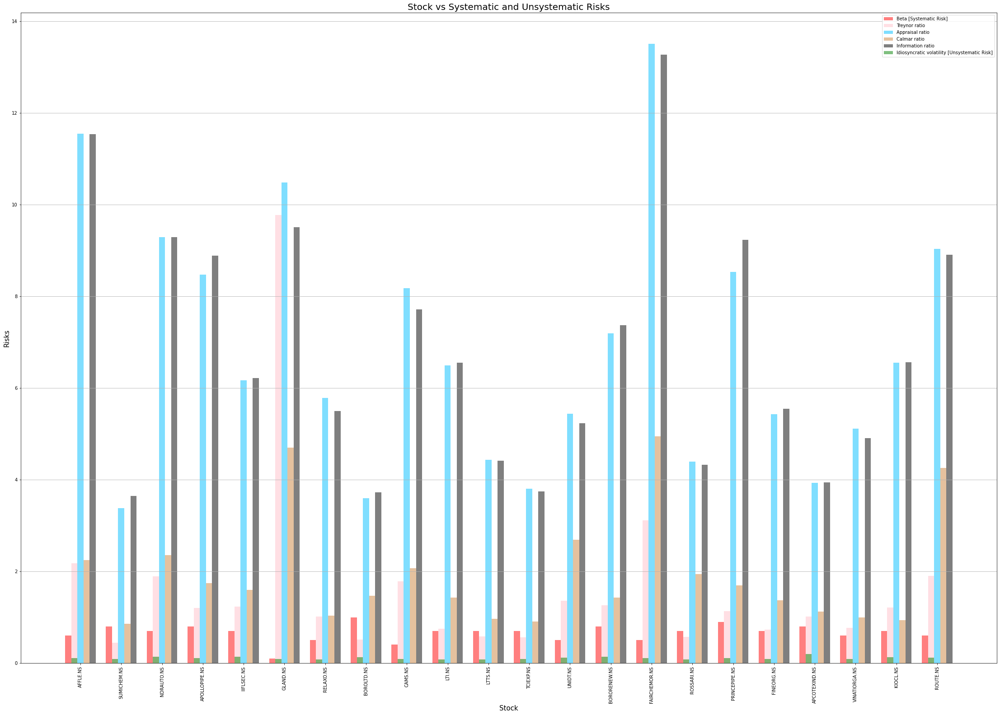

<Figure size 432x288 with 0 Axes>

In [ ]:
#index = ["Annualised return", "Expected return", "Annualised risk", "Sharpe ratio", "Beta [Systematic Risk]", 
#        "Treynor ratio", "Jensen's alpha", "Tracking error", "Information ratio", "Idiosyncratic volatility [Unsystematic Risk]", "Appraisal ratio", 
#        "Semideviation", "Max drawdown", "Average drawdown", "Sortino ratio", "Calmar ratio", "Sterling ratio"]


def display_multibar_graph(rets, title):
    bar_width=0.3

    X = np.arange(len(rets.index.values))
    fig=plt.figure(figsize=(30,20))
    ax=fig.add_axes([0,0,1,1])
    plt.xlabel("Stock", fontsize=15)
    plt.ylabel("Risks", fontsize=15)
    plt.title(title, fontsize=20)
    plt.xticks(X+range(len(rets.index.values))+(bar_width*2), rets.index.values, rotation='vertical')

    # ax.bar(X + range(len(rets.columns))+0.0, rets.loc["Beta [Systematic Risk]", : ], color='r', alpha=0.5, width=bar_width)
    # ax.bar(X + range(len(rets.columns))+(bar_width*1), rets.loc["Treynor ratio", : ], color='pink', alpha=0.5, width=bar_width)
    # ax.bar(X + range(len(rets.columns))+(bar_width*2), rets.loc["Appraisal ratio", : ], color='deepskyblue', alpha=0.5, width=bar_width)
    # ax.bar(X + range(len(rets.columns))+(bar_width*3), rets.loc["Semideviation", : ], color='lawngreen', alpha=0.5, width=bar_width)

    ax.bar(X + range(len(rets.index.values))+0.0, rets["Beta [Systematic Risk]"], color='r', alpha=0.5, width=bar_width)
    ax.bar(X + range(len(rets.index.values))+(bar_width*1), rets["Treynor ratio"], color='pink', alpha=0.5, width=bar_width)
    ax.bar(X + range(len(rets.index.values))+(bar_width*2), rets["Appraisal ratio"], color='deepskyblue', alpha=0.5, width=bar_width)
    ax.bar(X + range(len(rets.index.values))+(bar_width*3), rets["Calmar ratio"], color='peru', alpha=0.5, width=bar_width)
    ax.bar(X + range(len(rets.index.values))+(bar_width*4), rets["Information ratio"], color='black', alpha=0.5, width=bar_width)

    ax.bar(X + range(len(rets.index.values))+(bar_width*1), rets["Idiosyncratic volatility [Unsystematic Risk]"], color='g', alpha=0.5, width=bar_width)
    #ax.bar(X + range(len(rets.index.values))+(bar_width*2), rets["Annualised return"], color='b', alpha=0.5, width=bar_width)
    #ax.bar(X + range(len(rets.index.values))+(bar_width*4), rets.loc["Jensen's alpha", : ], color='aqua', alpha=0.5, width=bar_width)
    #ax.bar(X + range(len(rets.index.values))+(bar_width*5), rets.loc["Tracking error", : ], color='grey', alpha=0.5, width=bar_width)
    #ax.bar(X + range(len(rets.index.values))+(bar_width*7), rets["Annualised return"], color='orange', alpha=0.5, width=bar_width)
    #ax.bar(X + range(len(rets.index.values))+(bar_width*8), rets.loc["Expected return", : ], color='lawngreen', alpha=0.5, width=bar_width)
    #ax.bar(X + range(len(rets.index.values))+(bar_width*9), rets["Annualised risk"], color='peru', alpha=0.5, width=bar_width)
    #ax.bar(X + range(len(rets.index.values))+(bar_width*10), rets.loc["Information ratio", : ], color='black', alpha=0.5, width=bar_width)

    plt.legend(labels=["Beta [Systematic Risk]", "Treynor ratio", "Appraisal ratio", "Calmar ratio", "Information ratio", "Idiosyncratic volatility [Unsystematic Risk]"])
    plt.grid(axis = 'y')
    plt.show()
    plt.savefig(data_directory + title + ".svg")



title = "Stock vs Systematic and Unsystematic Risks"
rets = too_good

display_multibar_graph(rets, title)

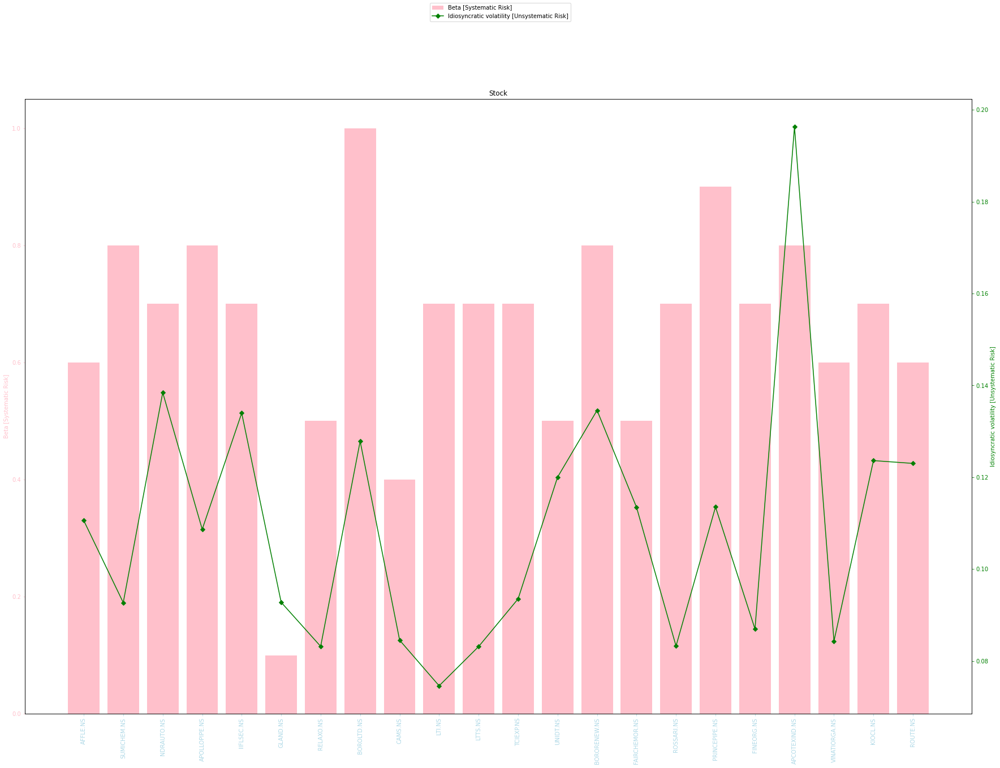

<Figure size 432x288 with 0 Axes>

In [ ]:
def graph_with_two_y_axes(rets, x_param, y_param1, y_param2, title, color1, color2):
    #create basic bar plot
    fig, ax = plt.subplots()
    ax.bar(range(len(rets.columns)), rets.loc[y_param1, : ], color=color1)
    fig.set_figheight(20)
    fig.set_figwidth(30)

    # Set the ticks and ticklabels for all axes
    plt.setp(ax, xticks=range(len(x_param)), xticklabels= x_param, )
    ax.set_title('Stock')
    ax.set_xticks(range(len(x_param)), )
    ax.set_xticklabels(x_param)
    for tick in ax.get_xticklabels():
        tick.set_rotation(90)
    ax.tick_params(axis='x', colors='lightblue')
    ax.set_ylabel(y_param1)
    #specify axis colors
    ax.tick_params(axis='y', colors=color1)
    ax.yaxis.label.set_color(color1)

    ax2 = ax.twinx()
    ax2.plot(range(len(x_param)), rets.loc[y_param2, :], color=color2, marker="D", ms=line_size)
    ax2.set_ylabel(y_param2)
    ax2.yaxis.label.set_color(color2)
    ax2.tick_params(axis='y', colors=color2)

    #display Pareto chart
    fig.legend(labels=[y_param1, y_param2, "Annualised return"], loc='upper center')
    plt.show()
    plt.savefig(data_directory + title + ".svg")


rets = too_good.T

color1 = 'pink'
color2 = 'green'
line_size = 6
title = "Stock vs Beta [Systematic Risk] and Idiosyncratic volatility [Unsystematic Risk]"

graph_with_two_y_axes(rets, rets.columns, "Beta [Systematic Risk]", "Idiosyncratic volatility [Unsystematic Risk]", title, color1, color2 )



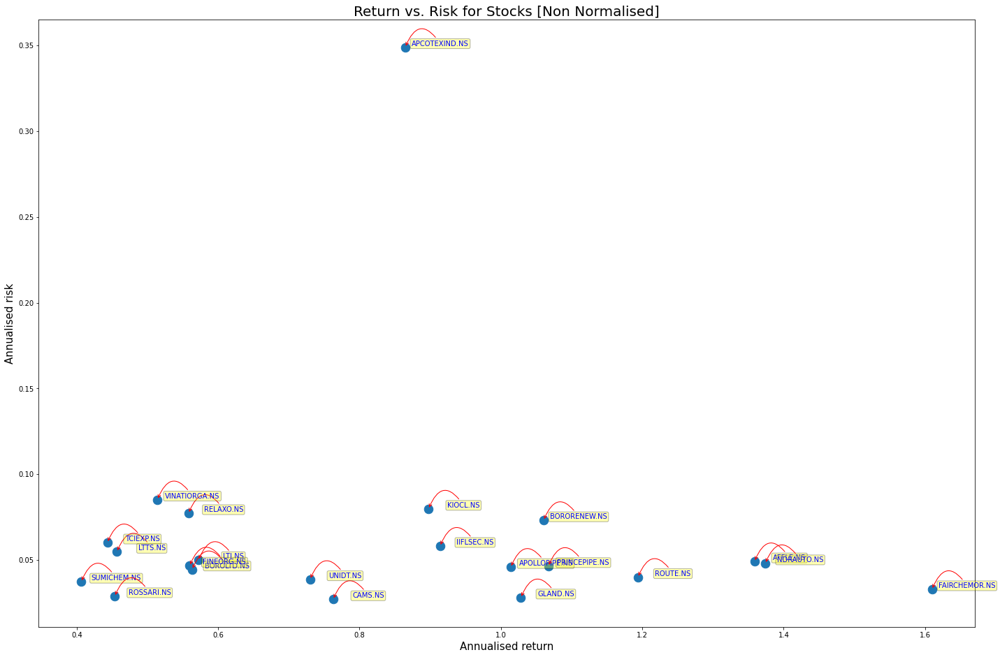

In [ ]:
def scatter_graph_with_annotation(rets, x_param, y_param, title):
    area = np.pi*50.0
    # sns.set(style='darkgrid')
    plt.figure(figsize=(24,16))
    plt.scatter(rets[x_param], rets[y_param], s=area)
    plt.xlabel(x_param, fontsize=15)
    plt.ylabel(y_param, fontsize=15)
    plt.title(title, fontsize=20)

    for label, x, y in zip(rets.index, rets[x_param], rets[y_param]) : 
        plt.annotate(label, xy=(x,y), xytext=(50, 0), 
            textcoords='offset points', ha='center', va='bottom',color='blue',
            bbox=dict(boxstyle='round,pad=0.2', fc='yellow', alpha=0.3),
            arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.95', 
                                color='r'))

    plt.savefig(data_directory + title + ".svg")



rets = too_good#.dropna()
title = "Return vs. Risk for Stocks [Non Normalised]"

scatter_graph_with_annotation(rets, "Annualised return", "Annualised risk", title)


AFFLE.NS         13.310322
SUMICHEM.NS       4.109935
NDRAUTO.NS       14.832530
APOLLOPIPE.NS    10.316195
IIFLSEC.NS        7.157027
GLAND.NS         18.772403
RELAXO.NS         3.172107
BOROLTD.NS        6.043443
CAMS.NS          13.742338
LTI.NS            4.839766
LTTS.NS           3.358104
TCIEXP.NS         3.064253
UNIDT.NS          9.255117
BORORENEW.NS      7.279934
FAIRCHEMOR.NS    26.484134
ROSSARI.NS        6.933144
PRINCEPIPE.NS    10.582050
FINEORG.NS        5.261669
APCOTEXIND.NS     2.768608
VINATIORGA.NS     2.633767
KIOCL.NS          4.918940
ROUTE.NS         15.102513
Name: Sortino ratio, dtype: float64

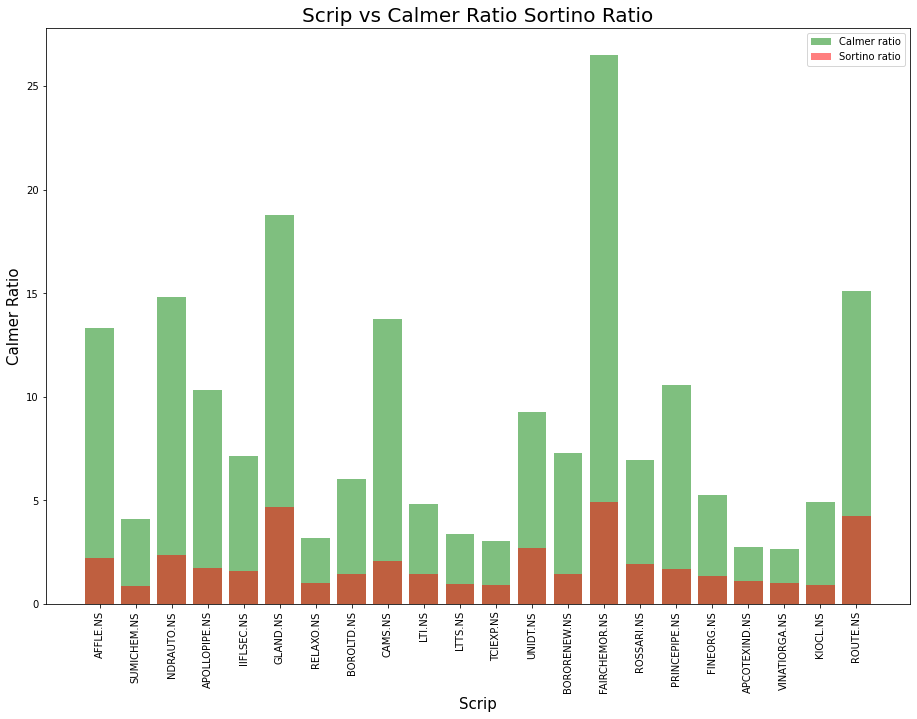

In [ ]:


def display_stacked_bar_graph(rets, title):
    fig=plt.figure(figsize=(12,8))
    ax=fig.add_axes([0,0,1,1])

    plt.xlabel("Scrip", fontsize=15)
    plt.ylabel("Calmer Ratio", fontsize=15)
    plt.title(title, fontsize=20)
    plt.xticks(range(len(rets.index)), rets.index, rotation='vertical')

    #############################################################
    #          Data has been clipped for Outlier Stocks         #
    #############################################################
    #ax.bar(range(len(rets.columns)), np.clip(rets["Calmer Ratio"], -0.5, 1.5), color='r', alpha=0.5)
    #ax.bar(range(len(rets.index)), rets.loc["Calmer Ratio"], color='r', alpha=0.5)
    #ax.bar(range(len(rets.columns)), np.clip(rets["Sortino Ratio"], -0.5, 1.5), color='g', alpha=0.5)
    ax.bar(range(len(rets["Sortino ratio"])), rets["Sortino ratio"], color='g', alpha=0.5)
    ax.bar(range(len(rets["Calmar ratio"])), rets["Calmar ratio"], color='r', alpha=0.5)

    plt.legend(labels=["Calmer ratio", "Sortino ratio"])
    plt.savefig(data_directory + title + ".svg")


title = "Scrip vs Calmer Ratio Sortino Ratio"
rets = too_good[["Sortino ratio", "Calmar ratio"]] 
rets["Sortino ratio"]
display_stacked_bar_graph(rets, title)

In [ ]:
def cumulative_returns(returns):
    
    return returns

def downside_risk(returns, risk_free=0):
    adj_returns = returns - risk_free
    sqr_downside = np.square(np.clip(adj_returns, np.NINF, 0))
    return np.sqrt(np.nanmean(sqr_downside) * 252)

def sortino(returns, risk_free=0):
    adj_returns = returns - risk_free
    drisk = downside_risk(adj_returns)
    if drisk == 0:
        return np.nan
    return (np.nanmean(adj_returns) * np.sqrt(252)) / drisk

def annual_returns(returns):
    num_years = len(returns) / 252
    cum_ret_final = (returns + 1).prod().squeeze()
    return cum_ret_final ** (1 / num_years) - 1

def calmar(returns):
    max_dd = max_drawdown(cumulative_returns(returns))
    if max_dd < 0:
        return annual_returns(returns) / abs(max_dd)
    return np.nan